In this notebook we looking for suitable models for gold price forecasting better than baseline models. Period is latest day = 2025-02-03

The aim of the project is to study the possibility of forecasting the price of gold for 60 working days ahead.

As a result, 17 models out of 48 were selected. In the next laptop, additional selection was carried out on 60 periods, and not only on the last one. There was not a single acceptable model that shows better results than Baseline Naive models.

Full list of used models:
- Moving average, ETS
- Prophet
- ARIMA, ARIMAX, ARFIMA
- StatsForecats: ARIMA, ETS, CES, Theta, MFLES, TBATS
- LGBMRegressor, CatBoost
- RNN based NN: RNN, LSTM, GRU, TCN, DeepAR, DRNN, BiTCN
- MLP based NN: MLP, NBEATS, NBEATSx, NHITS, Dlinear, NLinear, TiDE, DeepNPTS
- Kolmogorov-Arnold Networks (KANs)
- Transformer based NN: TFT, Vanilla Transformer, Informer, Autoformer, FEDformer, PatchTST, iTransformer
- TimesNet (CNN)
- Multivariate NN: StemGNN, TSMixer, TSMixerx, MLPMultivariate, SOFTS, TimeMixer
- TimeLLM, TimeGPT

In [1]:
import gc
import logging
import os
import random
from datetime import datetime
from itertools import product
from pathlib import Path

import joblib
import lightning.pytorch as pl
import matplotlib.pyplot as plt
import mplcyberpunk
import numpy as np
import optuna
import pandas as pd
import plotly.graph_objects as go
import pmdarima as pm
import quandl
import scipy.stats as stats
import tensorflow as tf
import torch
import yfinance as yf
from arch import arch_model
from catboost import CatBoostRegressor
from etsformer_pytorch import ETSFormer
from IPython.display import display
from IPython.utils import io
from joblib import Parallel, delayed
from lightning.pytorch import Trainer
from mlforecast import MLForecast
from mlforecast.lag_transforms import ExpandingMean, RollingMean
from mlforecast.target_transforms import Differences
from neuralforecast import NeuralForecast
from neuralforecast.losses.pytorch import GMM, MAE, DistributionLoss, MQLoss
from neuralforecast.models import (
    GRU,
    KAN,
    LSTM,
    MLP,
    NBEATS,
    NHITS,
    RNN,
    SOFTS,
    TCN,
    TFT,
    Autoformer,
    BiTCN,
    DeepAR,
    DeepNPTS,
    DilatedRNN,
    DLinear,
    FEDformer,
    Informer,
    MLPMultivariate,
    NBEATSx,
    NLinear,
    PatchTST,
    StemGNN,
    TiDE,
    TimeLLM,
    TimeMixer,
    TimesNet,
    TSMixer,
    TSMixerx,
    VanillaTransformer,
    iTransformer,
)
from neuralforecast.tsdataset import TimeSeriesDataset
from optuna.pruners import SuccessiveHalvingPruner
from pandas_datareader import data as pdr
from prophet import Prophet
from pytorch_forecasting import (
    Baseline,
    QuantileLoss,
    TemporalFusionTransformer,
    TimeSeriesDataSet,
)
from pytorch_forecasting.data import GroupNormalizer
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.core.module import LightningModule
from seaborn import displot, distplot, heatmap, histplot, lineplot, scatterplot
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import TimeSeriesSplit, train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from statsforecast import StatsForecast
from statsforecast.arima import arima_string
from statsforecast.models import (
    ADIDA,
    ARIMA,
    AutoARIMA,
    AutoCES,
    AutoETS,
    AutoMFLES,
    AutoTBATS,
    AutoTheta,
    HistoricAverage,
    HoltWinters,
    Naive,
    RandomWalkWithDrift,
    SeasonalNaive,
    SeasonalWindowAverage,
    WindowAverage,
)
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tools.tools import add_constant
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.exponential_smoothing.ets import ETSModel
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import STL, seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from tbats import TBATS
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tqdm import tqdm
from utilsforecast.losses import mae
from utilsforecast.plotting import plot_series

import lightgbm as lgb

NUM_CORES = joblib.cpu_count(only_physical_cores=True)
logging.getLogger("pytorch_lightning").setLevel(logging.WARNING)

os.environ["NIXTLA_ID_AS_COL"] = "1"
os.environ["PL_DISABLE_FORK"] = "1"
RND = 0
n_steps = 60  # горизонт прогнозирования
LEVELS = [80, 95]
plt.style.use("cyberpunk")

In [2]:
def get_metrics(
    y_true: np.ndarray | pd.Series,
    y_pred: np.ndarray | pd.Series,
    y_train: np.ndarray,
    name: str,
) -> pd.DataFrame:
    """
    Generating tables with metrics for time series.

    Parameters
    ----------
    y_true: 1d array-like, or label indicator array / sparse matrix
        Ground truth (correct) labels.

    y_pred: 1d array-like, or label indicator array / sparse matrix
        Predicted labels, as returned by a classifier.

    y_train : np.ndarray or list
        Array of training data used to calculate the naive forecast error.

    name: str
        id of metrics

    Returns
    -------
    df: pd.DataFrame
    """
    df_metrics = pd.DataFrame()
    df_metrics["model"] = [name]
    df_metrics["MAE"] = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    df_metrics["MSE"] = mse
    df_metrics["RMSE"] = np.sqrt(mse)
    df_metrics["R²"] = r2_score(y_true, y_pred)
    df_metrics["MAPE"] = mean_absolute_percentage_error(y_true, y_pred)
    df_metrics["sMAPE"] = smape(y_true, y_pred)
    df_metrics["MASE"] = mean_absolute_scaled_error(y_true, y_pred, y_train)
    df_metrics["Mean residuals"] = np.mean(y_true - y_pred)
    return df_metrics


def mean_absolute_percentage_error(y_true, y_pred) -> float:
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def smape(y_true, y_pred):
    return (
        100
        / len(y_true)
        * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))
    )


def mean_absolute_scaled_error(
    y_true: np.ndarray | list, y_pred: np.ndarray | list, y_train: np.ndarray | list
) -> float:
    """
    Calculate the Mean Absolute Scaled Error (MASE).

    MASE is a metric used to evaluate the accuracy of forecasts by comparing the
    forecast error to the average error of a naive forecasting method (e.g., lag-1 difference).

    Parameters
    ----------
    y_true : np.ndarray or list
        Array of true values for the forecasted period.
    y_pred : np.ndarray or list
        Array of predicted values for the forecasted period.
    y_train : np.ndarray or list
        Array of training data used to calculate the naive forecast error.

    Returns
    -------
    float
        The Mean Absolute Scaled Error (MASE).

    Notes
    -----
    The MASE is defined as:

    .. math:: MASE = \frac{1}{n} \sum_{t=1}^n \frac{|y_t - \hat{y}_t|}{\frac{1}{T-1} \sum_{t=2}^T |y_t - y_{t-1}|}

    where:
    - :math:`y_t` are the true values,
    - :math:`\hat{y}_t` are the predicted values,
    - :math:`T` is the length of the training series.

    A value less than 1 indicates that the forecast is better than the naive forecast.
    A value greater than 1 indicates worse performance than the naive forecast.

    Examples
    --------
    >>> y_true = [100, 200, 300]
    >>> y_pred = [110, 190, 310]
    >>> y_train = [80, 90, 100, 120, 150, 200, 250]
    >>> mean_absolute_scaled_error(y_true, y_pred, y_train)
    0.8253968253968254
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_train = np.array(y_train)

    # Calculate the naive forecast error (denominator)
    naive_diff = np.abs(y_train[1:] - y_train[:-1])
    naive_error = np.mean(naive_diff)

    # Check for division by zero
    if naive_error == 0:
        raise ValueError("Naive forecast error is zero. MASE is undefined.")

    # Calculate the scaled error (numerator)
    scaled_errors = np.abs(y_true - y_pred) / naive_error

    # Return the mean absolute scaled error
    return np.mean(scaled_errors)

In [3]:
def plot_corr_heatmap(df: pd.DataFrame) -> None:
    """
    Plot correlation heatmap of dataframe df

    Parameters
    ----------
    df: pd.DataFrame
        columns

    Returns
    -------
    None
    """
    plt.figure(figsize=(12, 7))
    cor = df.corr()
    matrix = np.triu(cor)
    heatmap(cor, annot=True, mask=matrix)
    plt.show()

In [4]:
def try_auto_model(model) -> None:
    """
    Fit and predict using auto model

    Parameters
    ----------
    model: neuralforecast.model

    metrics: pd.DataFrame

    Returns
    -------
    None
    """
    global metrics
    dataset, *_ = TimeSeriesDataset.from_df(df_train)
    model.fit(dataset=dataset, random_seed=RND)
    y_hat = model.predict(dataset=dataset, random_seed=RND)
    print(f"y_hat shape: {y_hat.shape}")
    if len(y_hat.shape) > 1 and y_hat.shape[1] > 1:
        y_hat = np.mean(y_hat, axis=1)
    y_hat = y_hat.flatten()
    predicted_df = pd.DataFrame(
        {
            model.__class__.__name__: y_hat,
            "ds": Y_test.ds,
            "unique_id": Y_test.unique_id,
        }
    )
    display(StatsForecast.plot(Y_ts, predicted_df, max_insample_length=n_steps * 2))
    metrics_ = get_metrics(
        Y_test["y"].values,
        predicted_df[model.__class__.__name__],
        Y_train["y"].values,
        model.__class__.__name__,
    )
    metrics_.set_index("model", inplace=True)
    metrics = pd.concat((metrics, metrics_))
    display(metrics)

# Import data 

## Gold prices

In [6]:
df = yf.download("GC=F", start="2000-01-01", end=datetime.today().strftime("%Y-%m-%d"))
df.drop(["Open", "High", "Low", "Adj Close", "Volume"], axis=1, inplace=True)
df.rename(columns={"Close": "Price"}, inplace=True)
df

[*********************100%***********************]  1 of 1 completed


,Price
Date,
2000-08-30,273.899994
2000-08-31,278.299988
2000-09-01,277.000000
2000-09-05,275.799988
2000-09-06,274.200012
...,...
2025-01-28,2766.800049
2025-01-29,2769.100098
2025-01-30,2823.000000


Historical data on the price of gold from 1980 to 2000.

In [7]:
df_hist = pd.read_csv("Historical data.csv")
df_hist["Date"] = pd.to_datetime(df_hist["Date"])
df_hist.set_index("Date", inplace=True)
df_hist

,Price
Date,
1979-12-27,515.50
1979-12-28,512.00
1980-01-01,512.00
1980-01-02,559.75
1980-01-03,634.25
...,...
2000-08-23,271.25
2000-08-24,272.95
2000-08-25,274.25


In [8]:
df = pd.concat((df_hist, df))

In [9]:
df.rename({"Price": "y"}, axis=1, inplace=True)

## Loading CPI (Inflation Index) data

In [10]:
cpi_data = pdr.get_data_fred(
    "CPIAUCSL", start="1979-12-27", end=datetime.today().strftime("%Y-%m-%d")
)

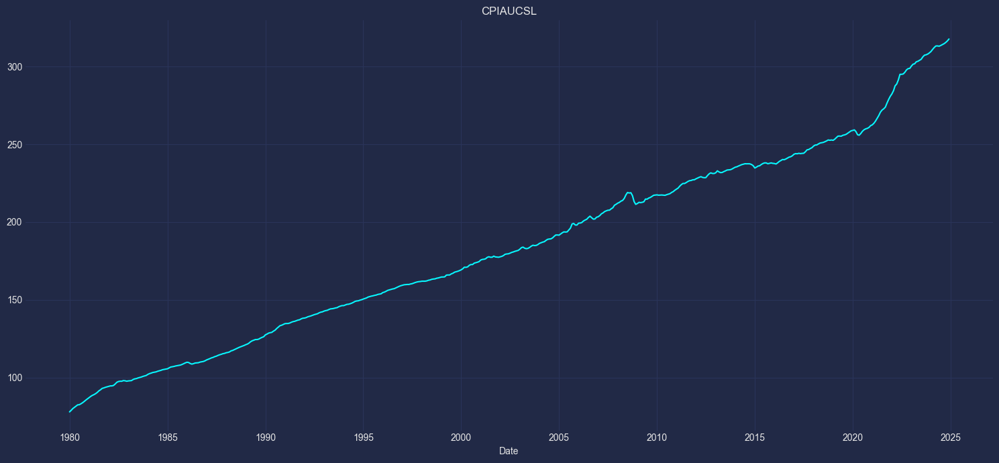

In [11]:
plt.figure(figsize=(15, 7))
plt.plot(cpi_data)
plt.title("CPIAUCSL")
plt.xlabel("Date")
plt.grid(True)
plt.tight_layout()
plt.show()

## ^TNX — 10-Year Treasury Yield

In [12]:
tnx = yf.download("^TNX", start="1979-12-27")
df["TNX"] = tnx["Close"]
df["TNX"] = df["TNX"].interpolate(method="linear")
df["TNX"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: TNX
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


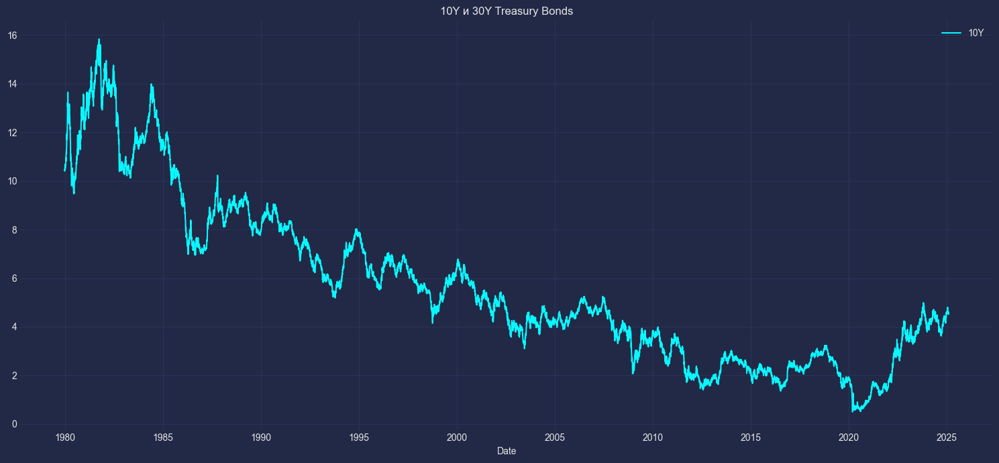

In [13]:
plt.figure(figsize=(15, 7))
plt.plot(df["TNX"], label="10Y")
plt.title("10Y и 30Y Treasury Bonds")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## ^DJI — The Dow Jones Index, which can serve as an indicator of economic confidence.

In [14]:
dji = yf.download("^DJI", start="1979-12-27")
df["DJI"] = dji["Close"]
df["DJI"] = df["DJI"].interpolate(method="linear").bfill()
df["DJI"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: DJI
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


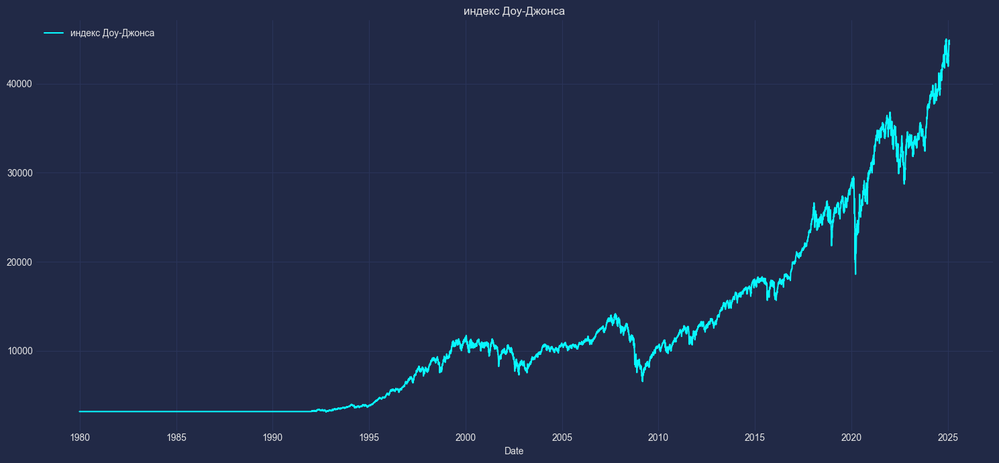

In [15]:
plt.figure(figsize=(15, 7))
plt.plot(df["DJI"], label="индекс Доу-Джонса")
plt.title("индекс Доу-Джонса")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## US dollar exchange rate (DXY)

The dollar index measures the strength of the US dollar against a basket of other currencies. Gold has an inverse correlation with the dollar - when the dollar rises, the price of gold often falls.

In [16]:
dxy = yf.download("DX-Y.NYB", start="1979-12-27")
df["DX-Y.NYB"] = dxy["Close"]
df["DX-Y.NYB"] = df["DX-Y.NYB"].interpolate(method="linear")
df["DX-Y.NYB"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: DX-Y.NYB
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


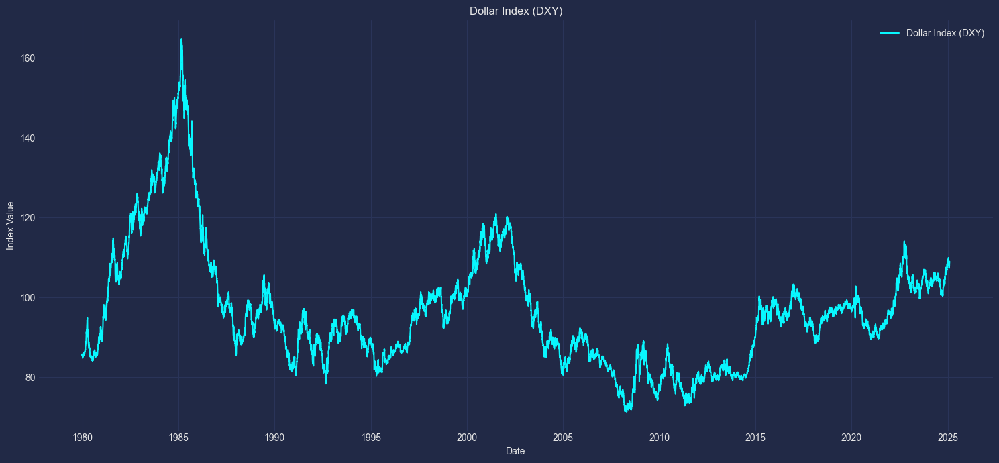

In [17]:
plt.figure(figsize=(15, 7))
plt.plot(df["DX-Y.NYB"], label="Dollar Index (DXY)")
plt.title("Dollar Index (DXY)")
plt.xlabel("Date")
plt.ylabel("Index Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Oil prices (WTI)

The price of oil can influence inflation expectations, which in turn can influence the demand for gold as a safe haven asset.

In [18]:
wti = yf.download("CL=F", start="1979-12-27")

df["WTI"] = wti["Close"]
df["WTI"] = df["WTI"].interpolate(method="linear").bfill()
df["WTI"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: WTI
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


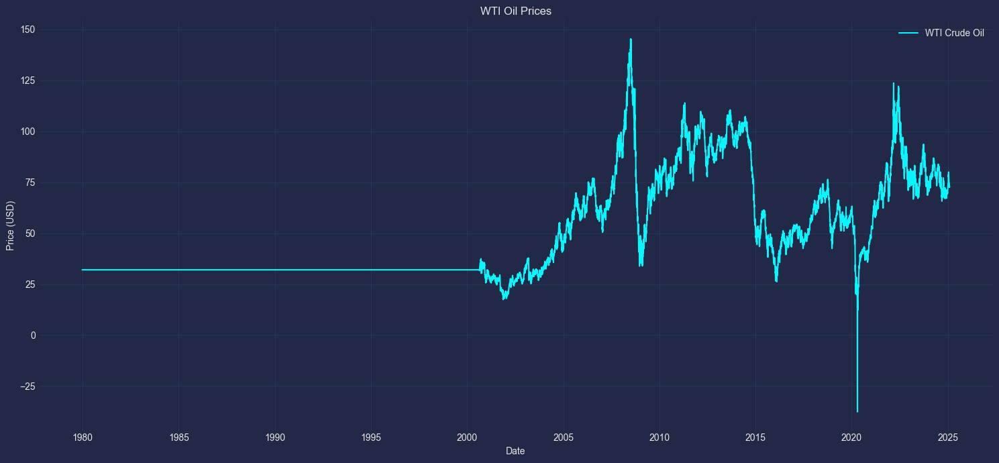

In [19]:
plt.figure(figsize=(15, 7))
plt.plot(df["WTI"].bfill(), label="WTI Crude Oil")
plt.title("WTI Oil Prices")
plt.xlabel("Date")
plt.ylabel("Price (USD)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## US Interest Rates

In [20]:
irx = yf.download("^IRX", start="1979-12-27")

df["IRX"] = irx["Close"]
df["IRX"] = df["IRX"].interpolate(method="linear")
df["IRX"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: IRX
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


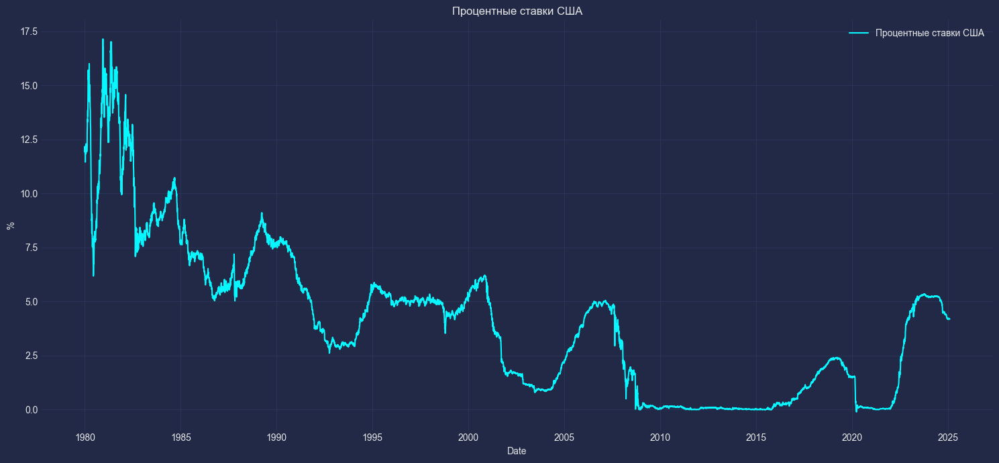

In [21]:
plt.figure(figsize=(15, 7))
plt.plot(df["IRX"], label="Процентные ставки США")
plt.title("Процентные ставки США")
plt.xlabel("Date")
plt.ylabel("%")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Gold Mining Stock Indices

Gold mining companies can provide insight into gold's prospects. When gold prices rise, these companies' stocks often rise.

In [22]:
gdx = yf.download("GDX", start="1979-12-27")

df["GDX"] = gdx["Close"]
df["GDX"] = df["GDX"].interpolate(method="linear").bfill()
df["GDX"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: GDX
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


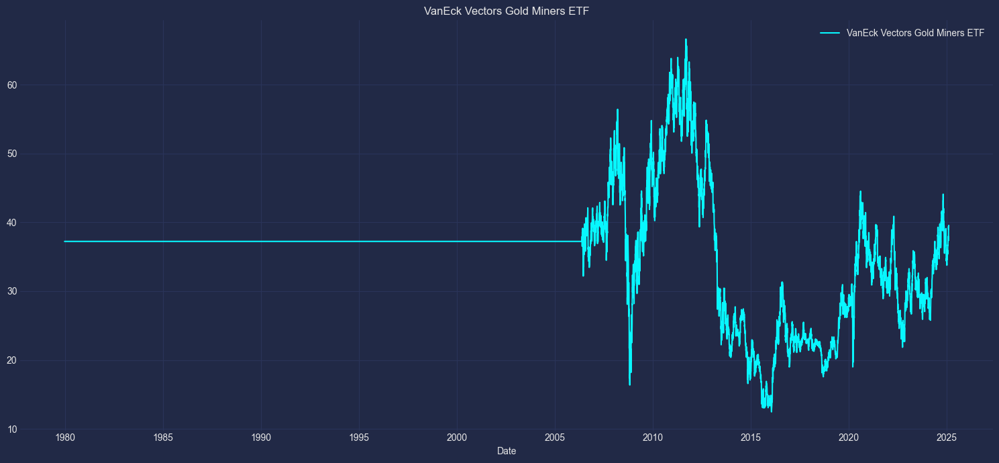

In [23]:
plt.figure(figsize=(15, 7))
plt.plot(df["GDX"], label="VanEck Vectors Gold Miners ETF")
plt.title("VanEck Vectors Gold Miners ETF")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Euro to dollar exchange rate

Gold is often used to hedge currency risks, especially in European countries where the euro is the main currency.

In [24]:
eur_usd = yf.download("EURUSD=X", start="1979-12-27")

df["EURUSD"] = eur_usd["Close"]
df["EURUSD"] = df["EURUSD"].interpolate(method="linear").bfill()
df["EURUSD"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: EURUSD
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


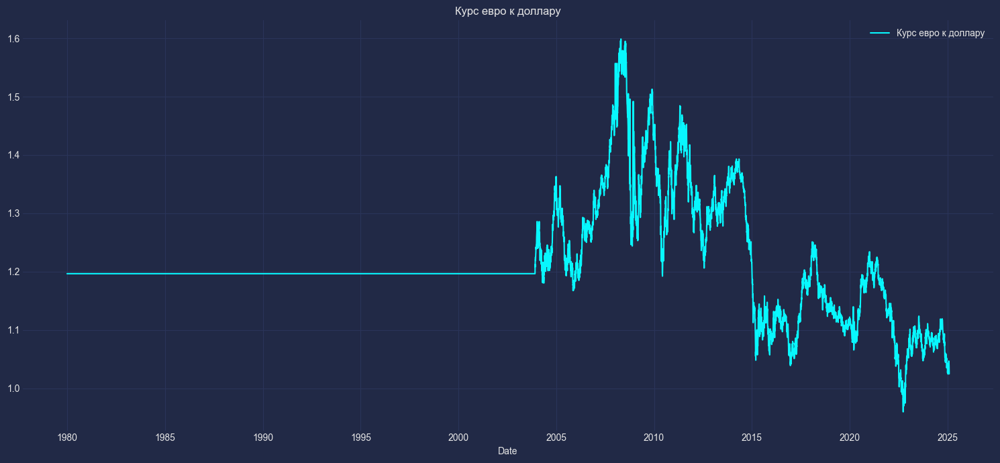

In [25]:
plt.figure(figsize=(15, 7))
plt.plot(df["EURUSD"], label="Курс евро к доллару")
plt.title("Курс евро к доллару")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Volatility Index (VIX)

The "Fear Index" can be an indicator of market uncertainty. When uncertainty increases, gold becomes a more desirable asset for preserving capital.

In [26]:
vix = yf.download("^VIX", start="1979-12-27")

df["VIX"] = vix["Close"]
df["VIX"] = df["VIX"].interpolate(method="linear").bfill()
df["VIX"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: VIX
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


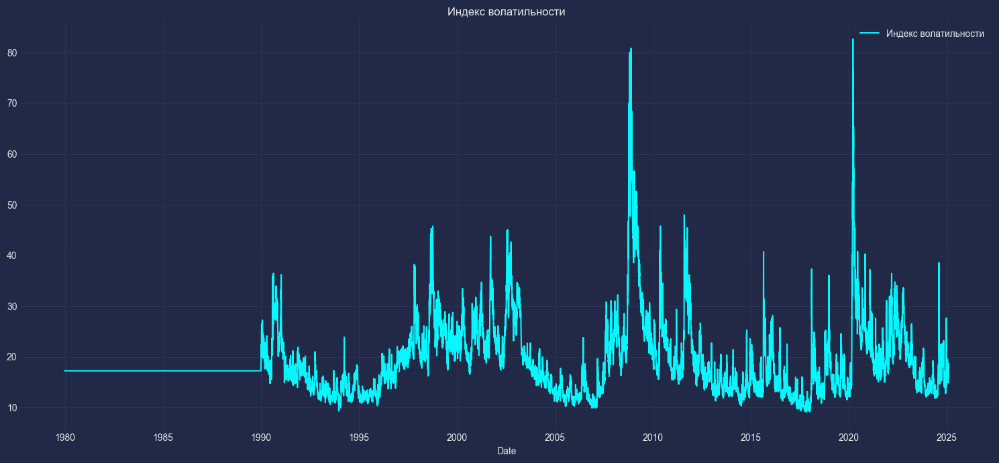

In [27]:
plt.figure(figsize=(15, 7))
plt.plot(df["VIX"], label="Индекс волатильности")
plt.title("Индекс волатильности")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Silver Futures

Although gold and silver differ in functionality and demand, they often move in the same direction due to similar economic factors.

In [28]:
silver = yf.download("SI=F", start="1979-12-27")

df["SI"] = silver["Close"]
df["SI"] = df["SI"].interpolate(method="linear").bfill()
df["SI"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: SI
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


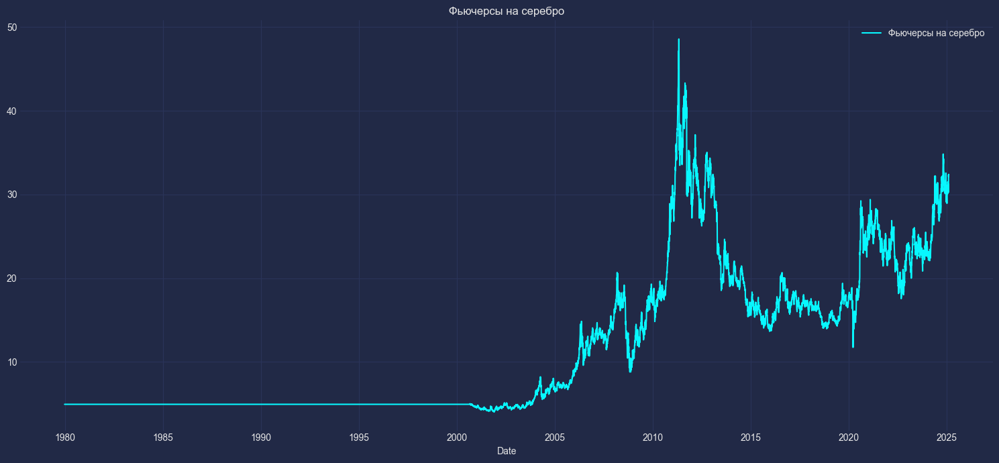

In [29]:
plt.figure(figsize=(15, 7))
plt.plot(df["SI"], label="Фьючерсы на серебро")
plt.title("Фьючерсы на серебро")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## S&P 500 Index

When the stock market is in decline, investors may move funds into gold to protect themselves from market risks.

In [30]:
gspc = yf.download("^GSPC", start="1979-12-27")

df["GSPC"] = gspc["Close"]
df["GSPC"] = df["GSPC"].interpolate(method="linear").bfill()
df["GSPC"].info()

[*********************100%***********************]  1 of 1 completed

<class 'pandas.core.series.Series'>
DatetimeIndex: 11464 entries, 1979-12-27 to 2025-02-03
Series name: GSPC
Non-Null Count  Dtype  
--------------  -----  
11464 non-null  float64
dtypes: float64(1)
memory usage: 179.1 KB


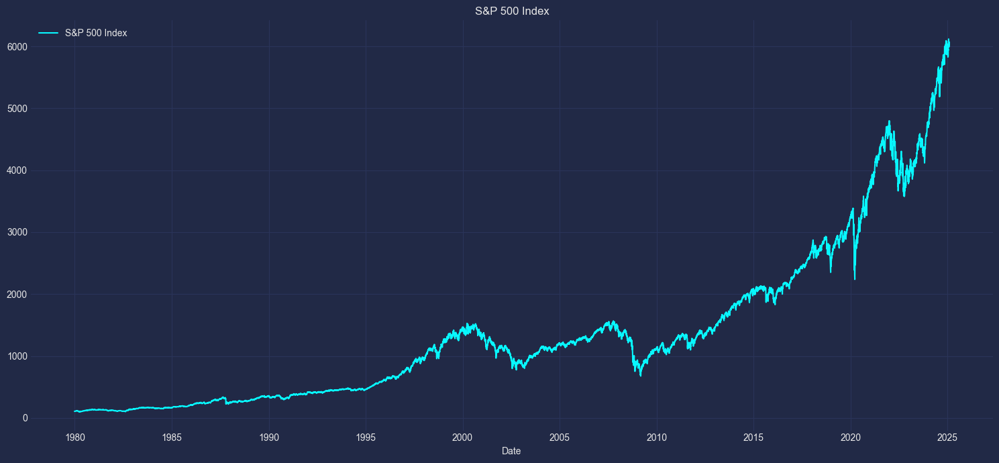

In [31]:
plt.figure(figsize=(15, 7))
plt.plot(df["GSPC"], label="S&P 500 Index")
plt.title("S&P 500 Index")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [32]:
df

,y,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC
Date,,,,,,,,,,,
1979-12-27,515.500000,10.460,3172.399902,85.510002,32.049999,11.970,37.230000,1.196501,17.240000,4.930000,107.959999
1979-12-28,512.000000,10.410,3172.399902,85.809998,32.049999,11.920,37.230000,1.196501,17.240000,4.930000,107.839996
1980-01-01,512.000000,10.455,3172.399902,85.564999,32.049999,12.045,37.230000,1.196501,17.240000,4.930000,106.799999
1980-01-02,559.750000,10.500,3172.399902,85.320000,32.049999,12.170,37.230000,1.196501,17.240000,4.930000,105.760002
1980-01-03,634.250000,10.600,3172.399902,85.260002,32.049999,12.100,37.230000,1.196501,17.240000,4.930000,105.220001
...,...,...,...,...,...,...,...,...,...,...,...
2025-01-28,2766.800049,4.551,44850.351562,107.870003,73.769997,4.190,37.700001,1.044506,16.410000,30.726999,6067.700195
2025-01-29,2769.100098,4.555,44713.519531,108.000000,72.620003,4.188,37.900002,1.042905,16.559999,31.238001,6039.310059
2025-01-30,2823.000000,4.512,44882.128906,107.800003,72.730003,4.182,39.419998,1.042525,15.840000,32.363998,6071.169922


In [33]:
# Let's combine gold and CPI data, synchronize by date
df = df.join(cpi_data, how="left").ffill().bfill()

# Bringing CPI to a single base point (e.g. current date)
df["CPI_Adjusted"] = df["CPIAUCSL"] / df["CPIAUCSL"].iloc[-1]

# Let's adjust gold prices for inflation
df["Gold_Inflation_Adjusted"] = df["y"] / df["CPI_Adjusted"]
df = df.asfreq("B").interpolate(method="linear")
df = df.drop(["CPIAUCSL", "CPI_Adjusted"], axis=1)
df

,y,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC,Gold_Inflation_Adjusted
Date,,,,,,,,,,,,
1979-12-27,515.500000,10.4600,3172.399902,85.510002,32.049999,11.9700,37.230000,1.196501,17.240000,4.930000,107.959999,2091.350455
1979-12-28,512.000000,10.4100,3172.399902,85.809998,32.049999,11.9200,37.230000,1.196501,17.240000,4.930000,107.839996,2077.151179
1979-12-31,512.000000,10.4325,3172.399902,85.687498,32.049999,11.9825,37.230000,1.196501,17.240000,4.930000,107.319998,2077.151179
1980-01-01,512.000000,10.4550,3172.399902,85.564999,32.049999,12.0450,37.230000,1.196501,17.240000,4.930000,106.799999,2077.151179
1980-01-02,559.750000,10.5000,3172.399902,85.320000,32.049999,12.1700,37.230000,1.196501,17.240000,4.930000,105.760002,2270.869869
...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-28,2766.800049,4.5510,44850.351562,107.870003,73.769997,4.1900,37.700001,1.044506,16.410000,30.726999,6067.700195,2766.800049
2025-01-29,2769.100098,4.5550,44713.519531,108.000000,72.620003,4.1880,37.900002,1.042905,16.559999,31.238001,6039.310059,2769.100098
2025-01-30,2823.000000,4.5120,44882.128906,107.800003,72.730003,4.1820,39.419998,1.042525,15.840000,32.363998,6071.169922,2823.000000


## Visualization

Let's plot charts for the closing price

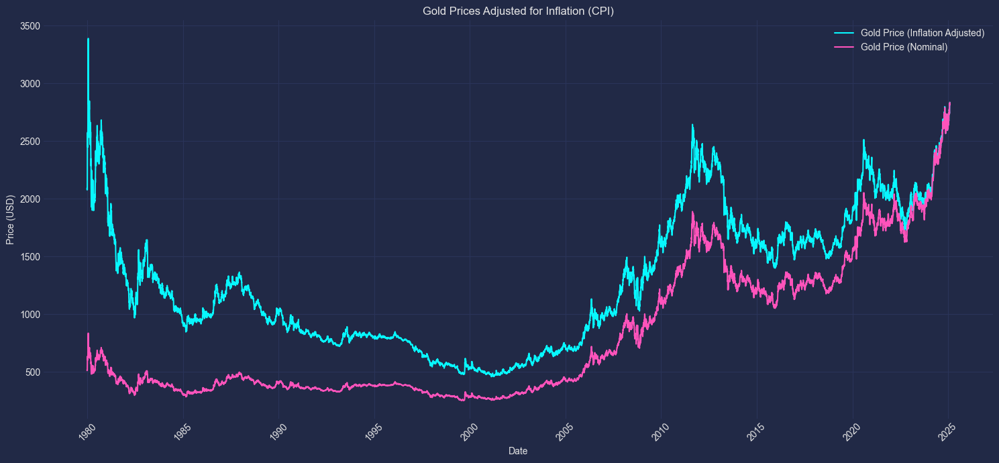

In [34]:
plt.figure(figsize=(15, 7))
lineplot(
    data=df,
    x=df.index,
    y="Gold_Inflation_Adjusted",
    label="Gold Price (Inflation Adjusted)",
)
lineplot(data=df, x=df.index, y="y", label="Gold Price (Nominal)")
plt.title("Gold Prices Adjusted for Inflation (CPI)")
plt.xlabel("Date")
plt.ylabel("Price (USD)")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

- In 1971, US President Richard Nixon de-pegged the dollar to gold. This meant that the dollar was no longer backed by anything other than US debt. After this, gold became a special investment commodity. Investors trusted gold exclusively for many years.
- As a result of the collapse of the Bretton Woods system, gold prices jumped to 195 per ounce by the end of 1974, and to 200 by 1978. By the beginning of 1980, the price of gold reached a record high of 850 per ounce (over 2,000 in 2008 prices), after which it began to gradually fall and was about 500 per ounce by the end of 1987.
- The most rapid decline occurred in 1996-1999, when the price of gold fell from 420 to 260 per ounce.
- However, the decline stopped and the price of gold began to rise again due to the agreement of leading central banks to limit gold sales in 1999.
- Since 2004, due to the devaluation of the US dollar, the price of gold entered a sharp rise. By the end of 2006, the price of an ounce of gold reached 620, and by the end of 2007 - already about 800. In early 2008, the price of gold exceeded 1,000 per ounce (however, in comparable prices, gold did not reach the peak of the 80s - above 2,000); on November 21, 2008, gold prices rose by 7.5% in one day. In mid-October 2009, the price of gold fluctuated between 1,060 and 1,070 per troy ounce.
- In 2010, world gold prices rose by 22%, reaching 1,337 per troy ounce.
- The following year, 2011, amid unrest in the Middle East (the Arab Spring), prices began to creep up.
- Since the beginning of 2014, amid the Ukrainian crisis, Iraqi civil strife and the weakening dollar, gold has risen in price by 15%, reaching 1,391 per ounce in March; for the first time since 2011, it grew for two quarters in a row, but then began to fall in price.
- On March 6, 2020, world gold prices reached a maximum of $1,690 per ounce.
- On March 8-9, after the OPEC+ deal to cut oil production fell apart and oil prices collapsed, gold rose to a record 1,702 per ounce.
- In July 2020, due to the coronavirus pandemic, the price of gold updated its record highs since 2011: the cost of the August futures rose to 1,807.35 per troy ounce (at its peak, it rose to 1,809 per troy ounce), which is the highest since September 21, 2011.

In [35]:
df = df.drop(["Gold_Inflation_Adjusted"], axis=1, errors="ignore")
#  "DJI", "TNX", "SI",

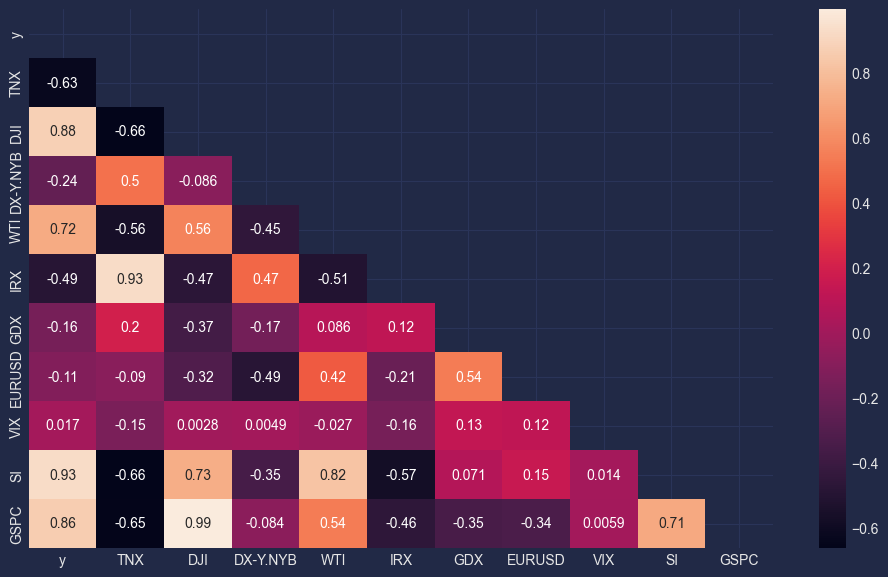

In [36]:
plot_corr_heatmap(df)

# Exploratory Data Analysis

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11768 entries, 1979-12-27 to 2025-02-03
Freq: B
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   y         11768 non-null  float64
 1   TNX       11768 non-null  float64
 2   DJI       11768 non-null  float64
 3   DX-Y.NYB  11768 non-null  float64
 4   WTI       11768 non-null  float64
 5   IRX       11768 non-null  float64
 6   GDX       11768 non-null  float64
 7   EURUSD    11768 non-null  float64
 8   VIX       11768 non-null  float64
 9   SI        11768 non-null  float64
 10  GSPC      11768 non-null  float64
dtypes: float64(11)
memory usage: 1.1 MB


Видим что пропусков в данных нет.

In [38]:
df.describe()

,y,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC
count,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000,11768.000000
mean,805.797689,5.651462,11940.802592,96.541013,49.697599,4.033161,35.800663,1.212045,18.960963,11.507516,1371.707176
std,584.970931,3.325943,9934.866920,14.969321,24.558599,3.490552,7.736580,0.090143,6.954553,8.721401,1283.699203
min,252.550000,0.499000,3136.600098,71.330002,-37.630001,-0.105000,12.470000,0.959619,9.140000,4.026000,98.220001
25%,362.187509,2.949750,3172.399902,86.177500,32.049999,0.912000,35.747500,1.196501,14.850000,4.930000,373.642502
50%,441.415000,4.825000,9998.004883,94.470001,32.049999,4.140000,37.230000,1.196501,17.240000,4.930000,1115.075012
75%,1262.450012,7.582500,15569.267334,102.300003,67.312498,5.670000,37.230000,1.203254,21.150000,17.150500,1748.272522
max,2833.899902,15.840000,45014.039062,164.720001,145.289993,17.139999,66.629997,1.598798,82.690002,48.584000,6118.709961


## Anomalies: Finding Outliers

#### Moving average method with local thresholds

This method calculates a moving average and standard deviation over a window (e.g. 30 or 60 days) and uses them to determine thresholds beyond which the data should not exceed. If a value exceeds a local threshold, it is considered an anomaly.

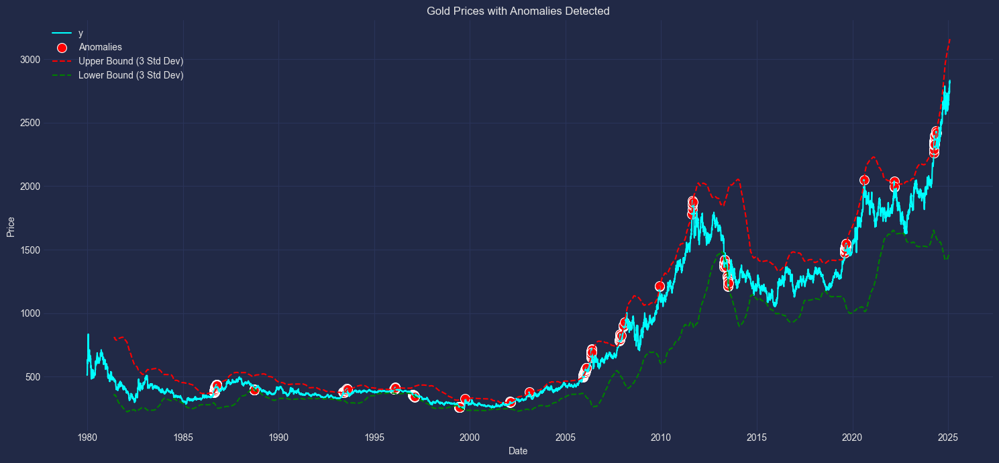

In [39]:
# Выбираем окно для скользящего среднего (например, год)
window_size = 365
target_col = "y"
# Рассчитываем скользящее среднее и стандартное отклонение
rolling_mean = df[target_col].rolling(window=window_size).mean()
rolling_std = df[target_col].rolling(window=window_size).std()

# Определяем верхние и нижние границы для аномалий (± 3 стандартных отклонения)
upper_bound = rolling_mean + (3 * rolling_std)
lower_bound = rolling_mean - (3 * rolling_std)

# Ищем точки, выходящие за границы
anomaly = np.where(
    (df[target_col] > upper_bound) | (df[target_col] < lower_bound), True, False
)

# Визуализация аномалий
plt.figure(figsize=(15, 7))
lineplot(data=df, x=df.index, y=target_col, label=target_col, color="cyan")
scatterplot(
    data=df[anomaly],
    x=df[anomaly].index,
    y=target_col,
    color="red",
    label="Anomalies",
    s=100,
)
plt.plot(upper_bound, color="red", linestyle="--", label="Upper Bound (3 Std Dev)")
plt.plot(lower_bound, color="green", linestyle="--", label="Lower Bound (3 Std Dev)")
plt.title("Gold Prices with Anomalies Detected")
plt.ylabel("Price")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

The chart displays gold prices over time with anomalies detected using a moving average method combined with local thresholds based on a 365-day window.

Anomalies are indicated by red circles, marking points where gold prices deviated significantly from the expected range defined by the upper and lower bounds.
Key periods of anomalies include:
- The sharp price rise around 1987.
- Periods around 2008-2010, when prices spiked, causing multiple anomalies.
- The strong rise in 2020-2025, when prices reached new peaks, causing multiple anomaly points. In late 2019 - early 2020, due to Covid. In February 2022, due to the outbreak of war. And the current hysterical situation in September 2024 is not yet clear what it is connected with.

These anomalies occur when the price rises above or falls below local thresholds, indicating unusual movements in the gold market, often related to economic events or shocks.

#### Using Isolation Forest Model to Detect Outliers

Isolation Forest is a machine learning method for outlier detection that builds random trees to isolate data points. It is especially effective for time series, where outliers are not always obvious from simple statistics.

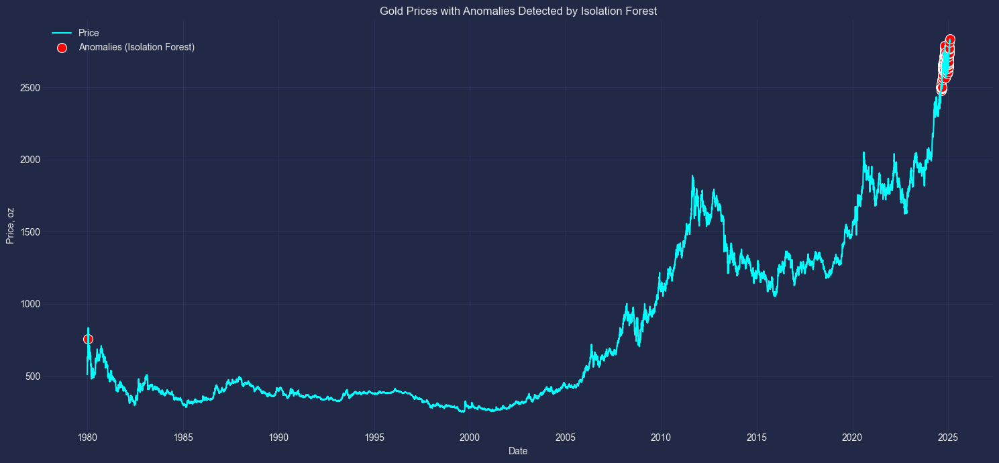

In [40]:
# Преобразуем индекс даты в формат, который можно использовать для обучения модели
df["Date_ordinal"] = df.index.map(lambda date: date.toordinal())

# Определяем фичи для модели (цена закрытия и дата)
features = df[[target_col, "Date_ordinal"]].dropna().copy()


# Настройка и обучение модели Isolation Forest
model = IsolationForest(
    contamination=0.01, random_state=RND
)  # Параметр contamination указывает процент аномалий
df["Anomaly_IF"] = model.fit_predict(features)

# -1 в Anomaly_IF означает аномалию, 1 - нормальная точка
df["Anomaly_IF"] = df["Anomaly_IF"].apply(lambda x: True if x == -1 else False)

# Визуализация результатов Isolation Forest
plt.figure(figsize=(15, 7))
lineplot(data=df, x=df.index, y=target_col, label="Price", color="cyan")
scatterplot(
    data=df[df["Anomaly_IF"]],
    x=df[df["Anomaly_IF"]].index,
    y=target_col,
    color="red",
    label="Anomalies (Isolation Forest)",
    s=100,
)
df = df.drop(["Date_ordinal", "Anomaly_IF"], axis=1)
plt.title("Gold Prices with Anomalies Detected by Isolation Forest")
plt.ylabel("Price, oz")
plt.xlabel("Date")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

This chart shows historical gold price data with anomalies detected by the Isolation Forest algorithm.
The anomalous points highlighted in red are visible in 2023-2024. This may be due to unexpected increases in gold prices, which could be caused by economic shocks, global instability or inflationary processes. The Isolation Forest algorithm highlights these points as outliers, indicating anomalous price dynamics.

## Stationarity and Self-correlation

Stationarity test (Dickey-Fuller test)

In [41]:
def check_stationarity(series):
    result = adfuller(series)
    print(f"ADF Statistic: {result[0]}")
    print(f"p-value: {result[1]}")
    for key, value in result[4].items():
        print(f"Critical Value {key}: {value}")
    if result[0] < 0.05:
        print("Ряд стационарен")
    else:
        print("Ряд не стационарен")

In [42]:
check_stationarity(df["y"])

ADF Statistic: 2.631041494145297
p-value: 0.9990802535128633
Critical Value 1%: -3.4309067051913162
Critical Value 5%: -2.861786034612406
Critical Value 10%: -2.566900959152624
Ряд не стационарен


Using differentiation to reduce a series to a stationary form

In [43]:
price_diff = df[target_col].diff().dropna()

In [44]:
check_stationarity(price_diff)

ADF Statistic: -27.294630202884715
p-value: 0.0
Critical Value 1%: -3.4309067051913162
Critical Value 5%: -2.861786034612406
Critical Value 10%: -2.566900959152624
Ряд стационарен


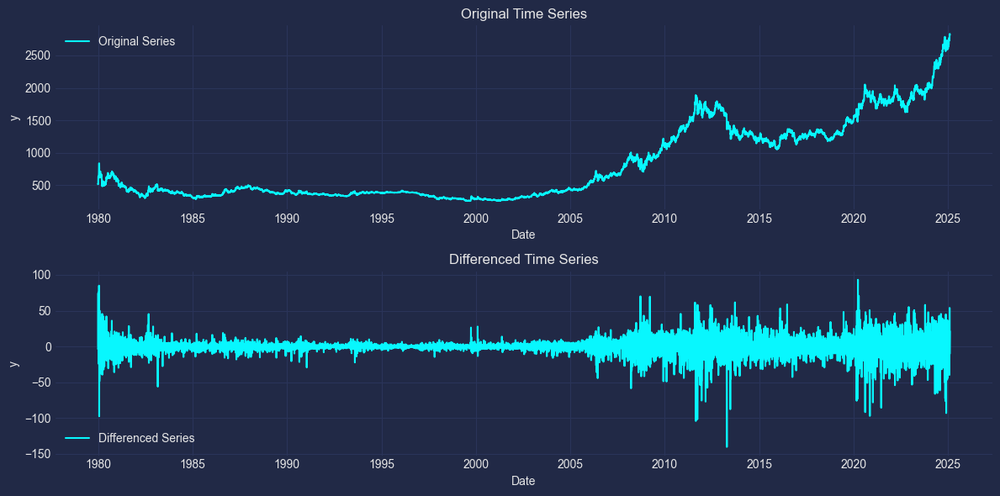

In [45]:
# Визуализация
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
lineplot(data=df[target_col], label="Original Series")
plt.title("Original Time Series")
plt.subplot(2, 1, 2)
lineplot(data=price_diff, label="Differenced Series")
plt.title("Differenced Time Series")
plt.tight_layout()
plt.show()

Построение графиков автокорреляции (ACF) и частичной автокорреляции (PACF)

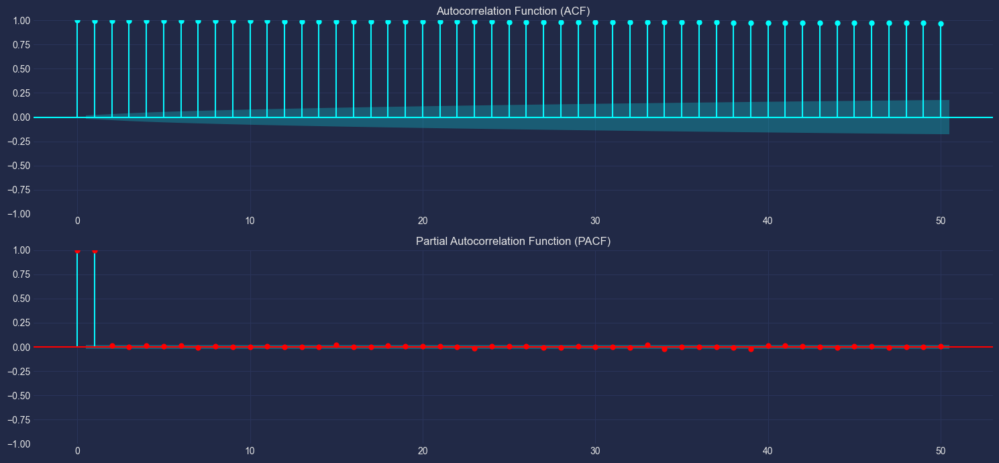

In [46]:
plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
plot_acf(df[target_col], lags=50, ax=plt.gca(), color="cyan")
plt.title("Autocorrelation Function (ACF)")

plt.subplot(2, 1, 2)
plot_pacf(df[target_col], lags=50, ax=plt.gca(), color="red")
plt.title("Partial Autocorrelation Function (PACF)")

plt.tight_layout()
plt.show()

The ACF plot displays the correlation of a time series with its own lagged values. The blue lines represent the autocorrelation at different lags (up to about 50 lags).

- The autocorrelation values ​​are very strong and positive in many lags, indicating that past values ​​of the series are highly correlated with future values ​​over time.
- The autocorrelation gradually decreases but remains significant, with all lag values ​​above the confidence interval (indicated by the shaded area), suggesting that the data are not random and that there may be long-term dependence in the series.

The PACF plot shows the partial correlation of a time series with its lagged values, eliminating the influence of intermediate lags.

- The first lag has a significant PACF value close to 1, and the second lag also has a significant positive value.
- After the second lag, the partial autocorrelation drops sharply, and for subsequent lags the values ​​are close to zero, indicating that beyond lag 2, the remaining lags have little additional impact after accounting for the first two lags.

# Time Series Decomposition Methods

## Classical decomposition

Classical time series decomposition decomposes the data into trend, seasonality, and residuals.

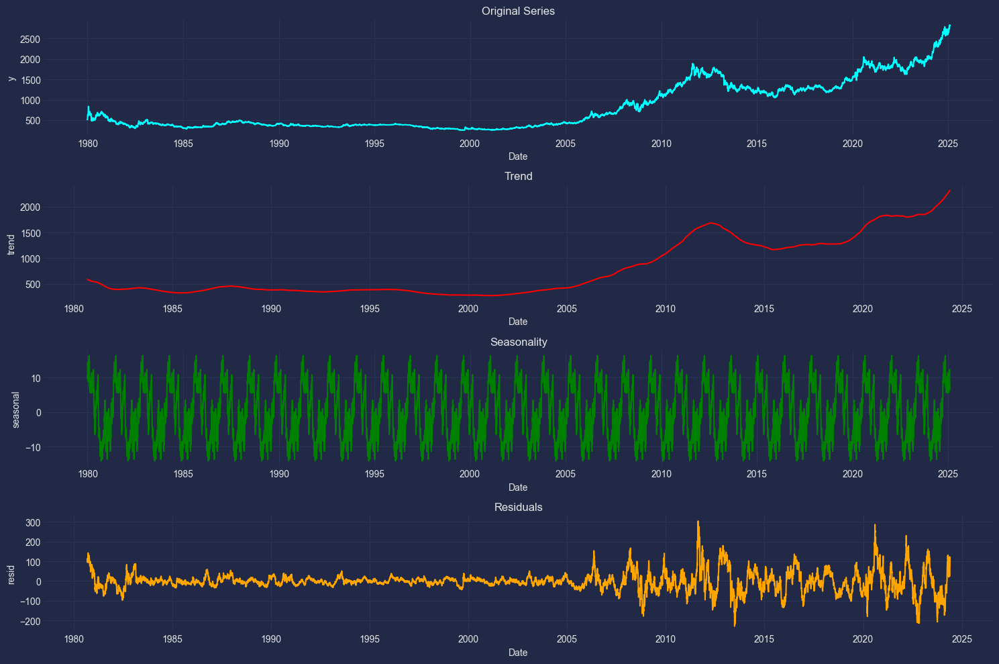

In [47]:
# Классическая декомпозиция (аддитивная модель)
decompose_result = seasonal_decompose(df.y, model="additive", period=365)

plt.figure(figsize=(15, 10))

plt.subplot(4, 1, 1)
lineplot(data=df, x=df.index, y="y", color="cyan")
plt.title("Original Series")

plt.subplot(4, 1, 2)
lineplot(x=decompose_result.trend.index, y=decompose_result.trend, color="red")
plt.title("Trend")

plt.subplot(4, 1, 3)
lineplot(x=decompose_result.seasonal.index, y=decompose_result.seasonal, color="green")
plt.title("Seasonality")

plt.subplot(4, 1, 4)
lineplot(x=decompose_result.resid.index, y=decompose_result.resid, color="orange")
plt.title("Residuals")

plt.tight_layout()
plt.show()

The blue line shows price data over time, starting in 1980 and running through 2024. The data is relatively flat until about the mid-2000s, after which it begins an upward trend that accelerates significantly, especially after 2020.

The red line represents the trend component of the series, which is the long-term movement of the data. From 1980 to 2000, the trend remains fairly stable and low. After 2000, there is a gradual increase in the trend, with a steep rise starting around 2010 and continuing strong gains after 2020.

The green graph shows the seasonality component, which shows repeating patterns or cycles in the data. The seasonality appears to be relatively stable over time, with small fluctuations between 10 and -10. The pattern repeats regularly and is consistent throughout the period from 1980 to 2025.

The orange plot shows the residuals, which are noise or unexplained variations in the data after accounting for trend and seasonality. From 1985 to 2005, the residuals fluctuate less widely, indicating greater stability. After 2005, the residuals become less stable and show some random spikes, unexplained variability.

The seasonality chart shows a repeating pattern, which is a sign that gold prices are subject to cyclical changes. Such regular fluctuations can be related to several factors:

- Economic cycles: The price of gold can be sensitive to macroeconomic conditions such as inflation, economic growth, or recessions. Gold is often seen as a "safe haven" during times of economic uncertainty.

- Seasonal demand factors: Demand for gold can increase at different times of the year. For example, in the fall and winter, there may be an increase in demand for gold due to holidays and weddings in countries where gold is often bought as a gift (such as India or China).

- Stock market cycles: Gold is often used as a hedge against stock market risks. If stock markets are volatile or falling, investors may seek safe assets such as gold. This can lead to some seasonality related to financial cycles.

- Geopolitical events: Gold can react to geopolitical instability or global risks, which can also be seasonal.

To better understand what exactly causes this seasonality, you can:
- Research how gold prices correlate with economic indicators.
- Look at the seasonality of demand in key gold-importing countries.
- Analyze the correlation with major stock indices and global events (e.g. crises).
If the seasonality is regular and repeats year after year, it may involve annual events or cyclical economic processes that affect the price of gold.

## STL: Seasonal and trend decomposition using Loess

STL (Seasonal and Trend decomposition using Loess) — is a method that allows one to identify three components of a time series: trend, seasonality, and residual. The method is based on smoothing the data using locally weighted regression (Loess).

In [48]:
stl = STL(df["y"], seasonal=13)  # seasonal=13 - длина сглаживания сезонности
result = stl.fit()

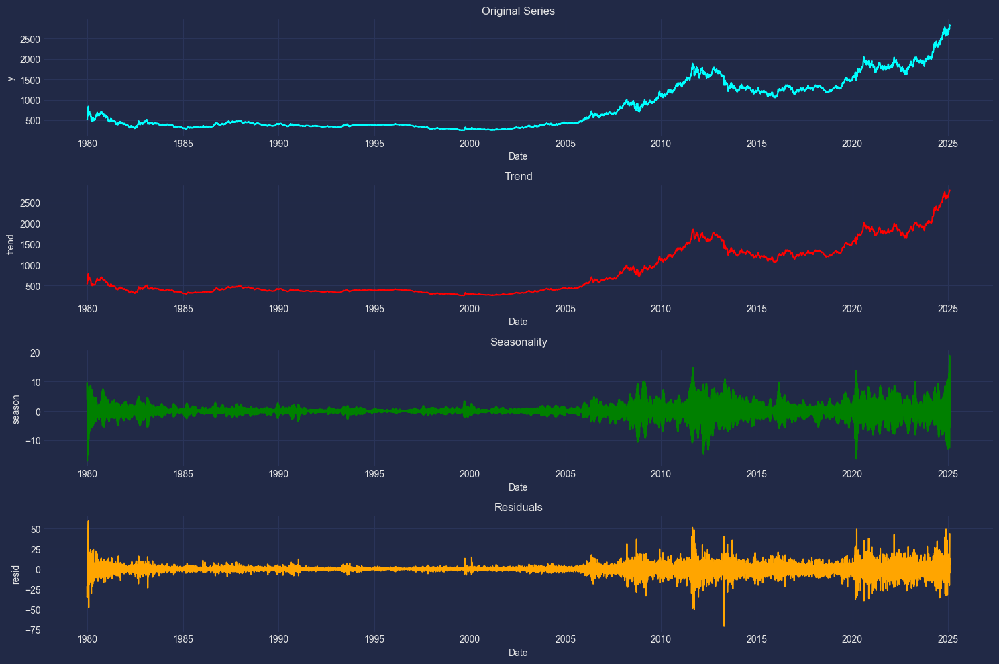

In [49]:
plt.figure(figsize=(15, 10))

plt.subplot(4, 1, 1)
lineplot(data=df, x=df.index, y="y", color="cyan")
plt.title("Original Series")

plt.subplot(4, 1, 2)
lineplot(x=df.index, y=result.trend, color="red")
plt.title("Trend")

plt.subplot(4, 1, 3)
lineplot(x=df.index, y=result.seasonal, color="green")
plt.title("Seasonality")

plt.subplot(4, 1, 4)
lineplot(x=df.index, y=result.resid, color="orange")
plt.title("Residuals")

plt.tight_layout()
plt.show()

# Data preparation

In [50]:
df

,y,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC
Date,,,,,,,,,,,
1979-12-27,515.500000,10.4600,3172.399902,85.510002,32.049999,11.9700,37.230000,1.196501,17.240000,4.930000,107.959999
1979-12-28,512.000000,10.4100,3172.399902,85.809998,32.049999,11.9200,37.230000,1.196501,17.240000,4.930000,107.839996
1979-12-31,512.000000,10.4325,3172.399902,85.687498,32.049999,11.9825,37.230000,1.196501,17.240000,4.930000,107.319998
1980-01-01,512.000000,10.4550,3172.399902,85.564999,32.049999,12.0450,37.230000,1.196501,17.240000,4.930000,106.799999
1980-01-02,559.750000,10.5000,3172.399902,85.320000,32.049999,12.1700,37.230000,1.196501,17.240000,4.930000,105.760002
...,...,...,...,...,...,...,...,...,...,...,...
2025-01-28,2766.800049,4.5510,44850.351562,107.870003,73.769997,4.1900,37.700001,1.044506,16.410000,30.726999,6067.700195
2025-01-29,2769.100098,4.5550,44713.519531,108.000000,72.620003,4.1880,37.900002,1.042905,16.559999,31.238001,6039.310059
2025-01-30,2823.000000,4.5120,44882.128906,107.800003,72.730003,4.1820,39.419998,1.042525,15.840000,32.363998,6071.169922


In [51]:
exog_cols = [
    "DX-Y.NYB",
    "WTI",
    "IRX",
    "GDX",
    "EURUSD",
    "VIX",
    "GSPC",
    "TNX",
    "DJI",
    "SI",
]

In [52]:
df["ds"] = df.index
df["unique_id"] = "gold"
df_train = df.iloc[:-n_steps]
df_test = df.iloc[-n_steps:]
Y_ts = df[["ds", "unique_id", "y"]].copy()
X_ts = df.drop(["y"], axis=1)
Y_train = Y_ts.iloc[:-n_steps]
Y_test = Y_ts.iloc[-n_steps:]

X_train = X_ts.iloc[:-n_steps]
X_test = X_ts.iloc[-n_steps:]

# Baseline models

100%|████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<?, ?it/s]


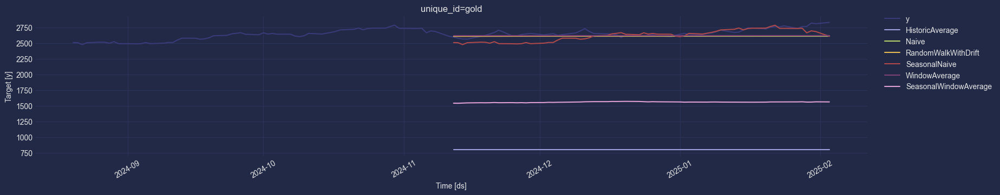

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113


In [53]:
models = [
    HistoricAverage(),
    Naive(),
    RandomWalkWithDrift(),
    SeasonalNaive(season_length=n_steps),
    WindowAverage(window_size=n_steps),
    SeasonalWindowAverage(season_length=n_steps, window_size=n_steps),
]
for model in tqdm(models):
    model.fit(y=Y_train.y.values)
forecasts = {
    model.__class__.__name__: model.predict(h=n_steps)["mean"] for model in tqdm(models)
}
predicted_df = pd.DataFrame(
    {
        "ds": Y_test.ds,
        "unique_id": Y_test.unique_id,
    }
)
predicted_df = predicted_df.assign(**forecasts)
display(StatsForecast.plot(Y_ts, predicted_df, max_insample_length=n_steps * 2))
metrics = get_metrics(
    Y_test.y,
    predicted_df[models[0].__class__.__name__],
    Y_train.y,
    models[0].__class__.__name__,
)
metrics.set_index("model", inplace=True)
for model in models[1:]:
    metrics_ = get_metrics(
        Y_test["y"].values,
        predicted_df[model.__class__.__name__],
        Y_train.y,
        model.__class__.__name__,
    )
    metrics_.set_index("model", inplace=True)
    metrics = pd.concat((metrics, metrics_))
metrics

# Moving average

This method averages the value of a series over a specified period and is continually updated as new data is added.

Let's add a forecast using a moving average

The moving average method works well on stationary data, where the price fluctuates around some average value. For unstable or trending data, it may be necessary to combine it with other methods, such as exponential smoothing or ARIMA models.

class SMA:
    """
    Implementation of smoothing average.

    Parameters
    ----------
    h : int
        Forecast horizont
    """

    def __init__(self, h: int) -> None:
        self.h = h
        self.sma = None
        self.rolling_data = None
        self.last_date = None
        self.forecast_df = None

    def fit(self, df: pd.DataFrame) -> None:
        """
        Calculate self.sma

        Parameters
        ----------
        df: pd.DataFrame
            Dataset with train data
        """
        self.sma = df.y.rolling(window=self.h).mean()

        # Начальные данные для скользящего среднего
        self.rolling_data = df["y"].iloc[-self.h :].values

        self.last_date = df.index[-1]

    def predict(self) -> pd.DataFrame:
        """
        Predict the next h values by repeating the last moving average.

        Returns
        -------
        pd.DataFrame
            DataFrame with forecast
        """
        rolling_forecast = []
        # Последнее значение скользящего среднего (которое будем использовать для прогноза)
        last_known_value = self.sma.iloc[-1]

        # Прогнозируем следующие значения, повторяя последнее скользящее среднее
        for i in range(self.h):
            next_forecast = np.mean(
                self.rolling_data[-self.h :]
            )  # Вычисляем среднее за последние window_size дней
            rolling_forecast.append(next_forecast)

            # Добавляем прогнозируемое значение в "исторические" данные для последующих расчетов
            self.rolling_data = np.append(self.rolling_data, next_forecast)

        # Добавляем прогнозируемые даты
        future_dates = pd.date_range(self.last_date, periods=self.h + 1, freq="B")[
            1:
        ]  # Только рабочие дни

        # Создаем DataFrame с прогнозом
        self.forecast_df = pd.DataFrame(
            data=rolling_forecast, index=future_dates, columns=["forecast"]
        )
        return self.forecast_df

    def plot(self, df: pd.DataFrame) -> None:
        """
        Build plot with actual price, moving average and forecast.

        Parameters
        ----------
        df: pd.DataFrame
            Dataset with all data
        """
        plt.figure(figsize=(15, 7))
        sns.lineplot(x=df.index, y=df.y, label="Gold price, $/oz")
        sns.lineplot(
            x=df.index, y=self.sma, label=f"Moving average for({n_steps} days)"
        )
        sns.lineplot(
            x=self.forecast_df.index, y=self.forecast_df["forecast"], label="Forecast"
        )
        plt.title("Forecast using moving average")
        plt.xlabel("Date")
        plt.ylabel("Price")
        plt.legend()
        plt.xlim(df.index[-self.h - 10], self.forecast_df.index[-1])
        max_y = max(
            max(df.y.iloc[-self.h :]),
            max(self.forecast_df["forecast"]),
        )
        min_y = min(min(df.y.iloc[-self.h - 10 :]), min(self.sma.iloc[-self.h - 10 :]))
        plt.ylim(min_y, max_y)
        plt.tight_layout()
        plt.show()

sma = SMA(n_steps)
sma.fit(df_train)
df_forecast = sma.predict()
sma.plot(df_train)

In [54]:
sma = df["y"].rolling(window=n_steps).mean()

In [55]:
rolling_forecast = []

# Начальные данные для скользящего среднего
rolling_data = df["y"].iloc[-n_steps:].values

# Последнее значение скользящего среднего (которое будем использовать для прогноза)
last_known_value = sma.iloc[-1]

# Прогнозируем следующие значения, повторяя последнее скользящее среднее
for i in range(n_steps):
    next_forecast = np.mean(
        rolling_data[-n_steps:]
    )  # Вычисляем среднее за последние window_size дней
    rolling_forecast.append(next_forecast)

    # Добавляем прогнозируемое значение в "исторические" данные для последующих расчетов
    rolling_data = np.append(rolling_data, next_forecast)

# Добавляем прогнозируемые даты
last_date = df.index[-1]
future_dates = pd.date_range(last_date, periods=n_steps + 1, freq="B")[
    1:
]  # Только рабочие дни

# Создаем DataFrame с прогнозом
forecast_df = pd.DataFrame(
    data=rolling_forecast, index=future_dates, columns=["Rolling_Mean_Forecast"]
)

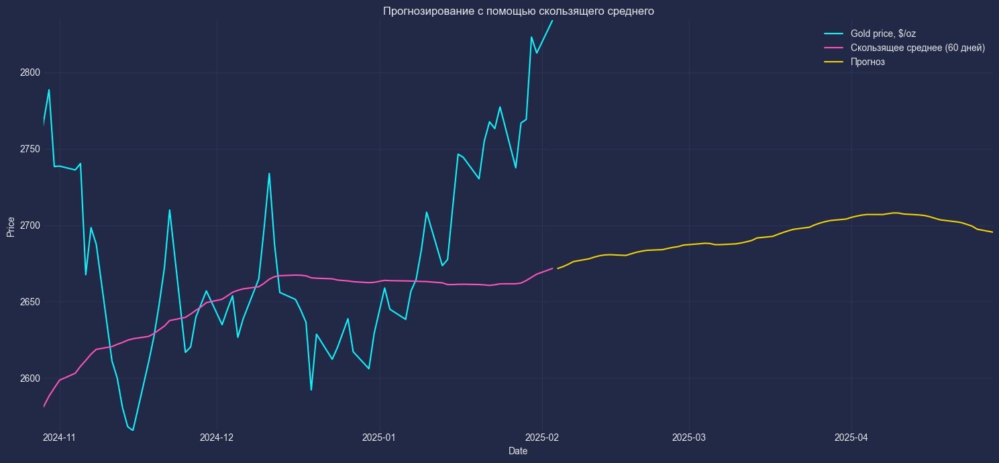

In [56]:
plt.figure(figsize=(15, 7))
lineplot(x=df.index, y=df[target_col], label="Gold price, $/oz")
lineplot(x=df.index, y=sma, label=f"Скользящее среднее ({n_steps} дней)")
lineplot(x=forecast_df.index, y=forecast_df["Rolling_Mean_Forecast"], label="Прогноз")
plt.title("Прогнозирование с помощью скользящего среднего")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.xlim(df.index[-n_steps - 10], forecast_df.index[-1])
max_y = max(
    max(df[target_col].iloc[-n_steps:]), max(forecast_df["Rolling_Mean_Forecast"])
)
min_y = min(min(df[target_col].iloc[-n_steps - 10 :]), min(sma.iloc[-n_steps - 10 :]))
plt.ylim(min_y, max_y)
plt.tight_layout()
plt.show()

In [57]:
metrics_ = get_metrics(
    df[target_col].iloc[-n_steps:],
    sma.iloc[-n_steps:],
    df[target_col].iloc[:-n_steps],
    "SMA",
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682


## Residue analysis and quality assessment

Residual analysis is important to check the quality of the model. Residuals are the difference between the actual and predicted values. They should be random, have zero mean, and have no autocorrelations.

Let's say we have a forecasting model and we get the residuals

In [58]:
residuals = df[target_col] - sma
np.mean(residuals)

5.19723845513773

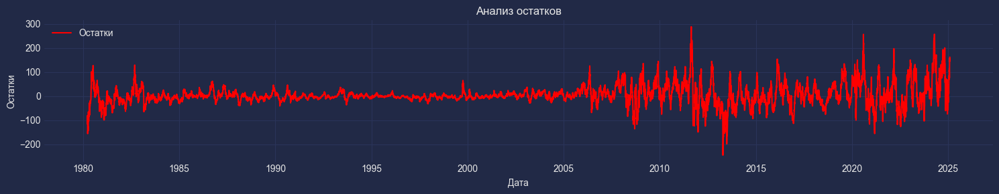

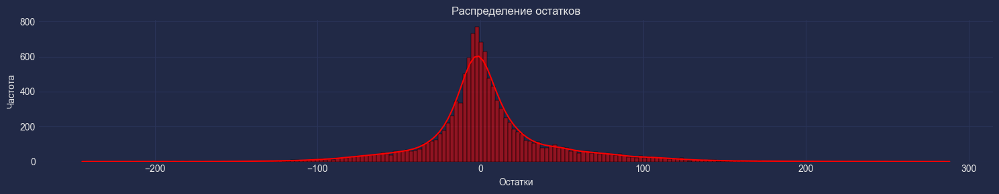

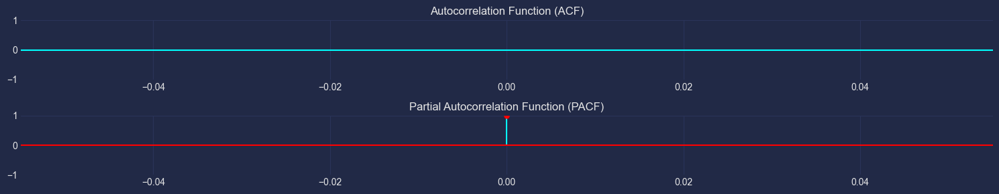

In [59]:
# Визуализация остатков
plt.figure(figsize=(15, 3))
lineplot(x=df.index, y=residuals, label="Остатки", color="red")
plt.title("Анализ остатков")
plt.xlabel("Дата")
plt.ylabel("Остатки")
plt.tight_layout()
plt.show()

# Распределение остатков
plt.figure(figsize=(15, 3))
histplot(residuals, kde=True, color="red")
plt.title("Распределение остатков")
plt.xlabel("Остатки")
plt.ylabel("Частота")
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 3))

plt.subplot(2, 1, 1)
plot_acf(residuals, lags=50, ax=plt.gca(), color="cyan")
plt.title("Autocorrelation Function (ACF)")

plt.subplot(2, 1, 2)
plot_pacf(residuals, lags=50, ax=plt.gca(), color="red")
plt.title("Partial Autocorrelation Function (PACF)")

plt.tight_layout()
plt.show()

For the moving average, the residuals are not completely random and the average is not 0. This means that the model does not predict the change in the series well. And this is also evident from the metric values.

# ETS

ETS (Error, Trend, Seasonal) models are a generalization of exponential smoothing models. ETS models can take into account trend, seasonality, and errors in data. They allow flexible selection of components, which can be additive or multiplicative.
ETS model components:
- Error — additive or multiplicative error.
- Trend — additive or multiplicative trend.
- Seasonal — additive or multiplicative seasonality.

Forecast for the test (multi-step forecast for 30 steps ahead)

In [60]:
ets_model_test = ETSModel(df_train["y"], trend="add", seasonal="add", freq="B")
ets_result_test = ets_model_test.fit()
forecast_ets_test = ets_result_test.forecast(steps=n_steps)

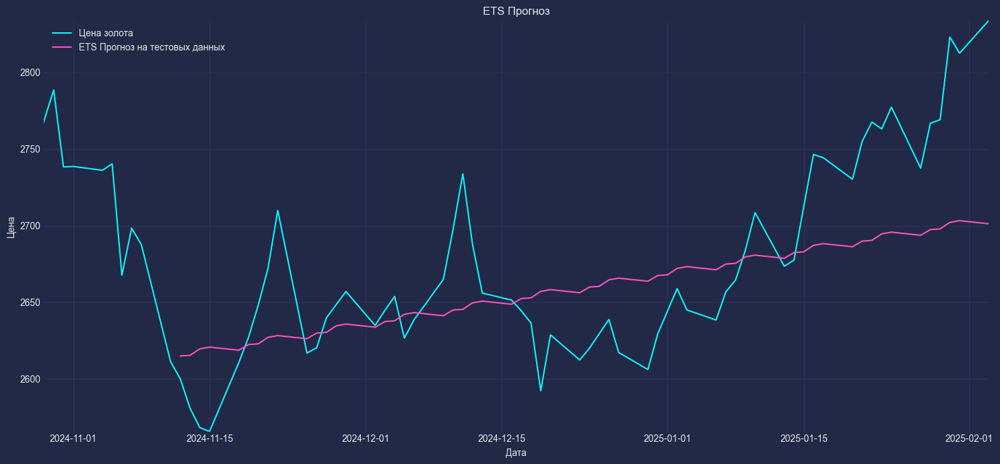

In [61]:
plt.figure(figsize=(15, 7))
lineplot(x=df.index, y=df["y"], label="Цена золота")
lineplot(
    forecast_ets_test,
    label="ETS Прогноз на тестовых данных",
)

plt.title("ETS Прогноз")
plt.xlabel("Дата")
plt.ylabel("Цена")
plt.legend()

plt.xlim(df.index[-n_steps - 10], forecast_ets_test.index[-1])
max_y = max(df["y"].iloc[-n_steps - 10 :])

min_y = min(min(df["y"].iloc[-n_steps - 10 :]), min(forecast_ets_test))
plt.ylim(min_y, max_y)
plt.tight_layout()
plt.show()

In [62]:
metrics_ = get_metrics(df_test["y"], forecast_ets_test, df_train["y"], "ETS")
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379


## Conclusion

ETS (Error-Trend-Seasonal) models, including approaches such as Holt-Winters, can indeed exhibit limited ability to forecast over long periods, especially if the data has complex seasonality or trends that change over time. In ETS models, if the trend or seasonality stabilizes, the model can begin to produce a linear forecast, as it "averages out" the patterns it sees in the data, especially over long horizons. give complex seasonality or trends that change over time.

Reasons:

- Linear trend: If the data has a weak or linear trend component, the model will predict this trend for the long term without changes.
- Information limitation: Long-term forecasts increase uncertainty and the model begins to rely on stable parameters, which leads to "averaging" of predictions.

ETS is suitable for:
- Short-term forecasts: The model works well for a small number of steps ahead (e.g. 10-20 steps) with a clear trend or seasonality.
- Data with a simple, stable trend: If trends and seasonality remain unchanged over time, ETS models can produce fairly accurate long-term forecasts.

That is, for our task of long-term forecasting with a complex trend, ETS is poorly suited.

# Prophet

Prophet is a time series model developed at Facebook. It effectively handles irregular time series that contain missing data, holidays, and trend changes. Prophet uses an additive model to decompose the time series into trend, seasonality, and additional components.

In [63]:
m = Prophet()
m.fit(df)

12:03:37 - cmdstanpy - INFO - Chain [1] start processing
12:03:41 - cmdstanpy - INFO - Chain [1] done processing


In [64]:
future = m.make_future_dataframe(periods=n_steps)
future.tail()

,ds
11823,2025-03-31
11824,2025-04-01
11825,2025-04-02
11826,2025-04-03
11827,2025-04-04


In [65]:
forecast = m.predict(future)
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()

,ds,yhat,yhat_lower,yhat_upper
11823,2025-03-31,2305.221783,2203.865402,2409.267266
11824,2025-04-01,2305.950031,2199.860665,2416.337141
11825,2025-04-02,2306.959149,2202.306965,2410.659099
11826,2025-04-03,2307.964239,2210.829961,2404.478715
11827,2025-04-04,2309.210131,2199.359215,2414.904250


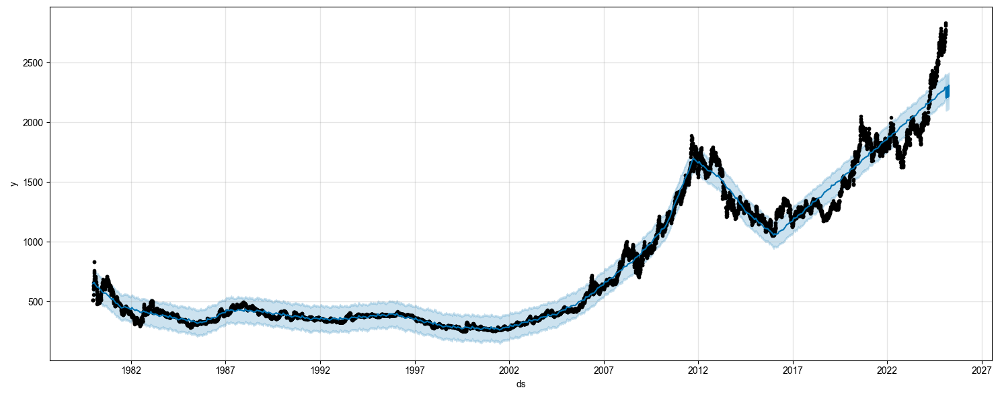

In [66]:
plt.style.use("default")
fig1 = m.plot(forecast, figsize=(15, 6))
plt.style.use("cyberpunk")

In [67]:
metrics_ = get_metrics(
    df["y"].iloc[-n_steps:],
    forecast.iloc[-n_steps:]["yhat"].values,
    df["y"].iloc[:-n_steps],
    "Prophet",
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


This chart shows that the Prophet model makes predictions based on historical data, taking into account only the gold price series itself. The forecast appears smoothed, reflecting the seasonal and trend features of the time series, but does not capture much of the volatility of the real data.
Prophet is tailored to capture trends and seasonality, but it smooths out short-term fluctuations, which may explain the discrepancies with actual prices.
The uncertainty intervals are relatively narrow, indicating low variability in the model. This may indicate a lack of explanatory factors or insufficient adaptation of the parameters to the specifics of the data.
Gold volatility (often associated with macroeconomic and geopolitical factors) cannot be fully captured by Prophet.

Gold as an asset has a complex nature (investment, defensive, industrial asset), which results in Prophet's insufficient ability to capture all aspects of the time series.

# Models for stationary time series

## Non-seasonal autoregressive moving average model (ARIMA)

ARIMA (AutoRegressive Integrated Moving Average) is a popular time series model that combines three components:

1. AR (autoregressive) - uses the dependence of current values ​​on previous values.
2. I (integration) - performs differentiation to achieve stationarity.
3. MA (moving average) - uses the dependence of the current value on the errors of previous steps.

Formal notation of the model: ARIMA(p, d, q), where:

- p is the order of autoregressive,
- d is the order of integration (number of differentiations),
= q is the order of the moving average.

Automatic selection of ARIMA parameters

In [68]:
auto_arima_model = pm.auto_arima(df["y"], seasonal=True, stepwise=True, trace=True)
auto_arima_model.summary()

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=inf, Time=1.90 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=97275.829, Time=0.17 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=93846.004, Time=0.19 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.54 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=92306.265, Time=0.23 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=91631.456, Time=0.49 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=91142.372, Time=0.68 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=90904.747, Time=0.84 sec
 ARIMA(5,2,1)(0,0,0)[0]             : AIC=inf, Time=2.65 sec
 ARIMA(4,2,1)(0,0,0)[0]             : AIC=inf, Time=1.97 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=90906.747, Time=1.85 sec

Best model:  ARIMA(5,2,0)(0,0,0)[0]          
Total fit time: 11.521 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                11768
Model:               SARIMAX(5, 2, 0)   Log Likelihood              -45446.374
Date:                Tue, 04 Feb 2025   AIC                          90904.747
Time:                        12:03:53   BIC                          90948.985
Sample:                    12-27-1979   HQIC                         90919.601
                         - 02-03-2025                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8389      0.005   -186.349      0.000      -0.848      -0.830
ar.L2         -0.6704      0.005   -123.763      0.000      -0.681      -0.660
ar.L3         -0.4789      0.006    -80.121      0.000      -0.491      -0.467
ar.L4         -0.3180      0.006    -56.040      0.000      -0.329      -0.307
ar.L5         -0.1425      0.005    -29.593      0.000      -0.152      -0.133
sigma2       132.5654      0.622    213.117      0.000     131.346     133.785
===================================================================================
Ljung-Box (L1) (Q):                   4.79   Jarque-Bera (JB):            105736.69
Prob(Q):                              0.03   Prob(JB):                         0.00
Heteroskedasticity (H):               5.41   Skew:                            -0.70
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Final model: ARIMA model order: (5,2,0), which means:

- 5 autoregressive parameters (AR).
- 2nd differentiation of the time series (I) to achieve stationarity.
- 0 moving average (MA) parameters.
- AIC: 89748.396 is the optimal balance between accuracy and complexity of the model.
- BIC: 89792.589 is a similar criterion that penalizes for the number of parameters in the model.
- HQIC: 89763.241 is another information criterion that can be used to select a model.

Description of the final model parameters:
- AR parameters (L1-L5): All coefficients (ar.L1 - ar.L5) have negative values ​​​​and are significant (p-value < 0.05), which indicates the importance of these lags for the model.
The coefficient is highest at the first lag (ar.L1 = -0.8359), then the effect weakens as the lag increases (ar.L5 = -0.1436).
- sigma2 (error variance): The error variance value is 127.1892, which indicates the dispersion of the model residuals.

Model quality tests:
- Ljung-Box test (L1) (Q = 4.52, Prob(Q) = 0.03): Indicates some autocorrelation of the residuals at the first lag (p-value < 0.05).
- Jarque-Bera test (JB = 102413.91, Prob(JB) = 0.00): Indicates a significant deviation from normality of the residuals.
- Skewness coefficient (Skew = -0.63): Indicates the presence of asymmetry in the distribution of the residuals.
- Kurtosis (Kurtosis = 17.45): The value is significantly greater than 3, indicating heavy tails (outliers) in the distribution of residuals.

In [69]:
forecast, conf_int = auto_arima_model.predict(n_periods=n_steps, return_conf_int=True)

Let's create dates for forecasts

In [70]:
future_dates = pd.date_range(df.index[-1], periods=n_steps + 1, freq="B")[1:]

Let's create a DataFrame with forecasts and confidence intervals

In [71]:
forecast_df = pd.DataFrame(
    {
        "Forecast": forecast,
        "Lower Bound": conf_int[:, 0],  # Нижняя граница доверительного интервала
        "Upper Bound": conf_int[:, 1],  # Верхняя граница доверительного интервала
    },
    index=future_dates,
)

Forecast on test data

In [72]:
auto_arima_model_test = pm.auto_arima(
    df["y"].iloc[:-n_steps], seasonal=True, stepwise=True, trace=True
)
forecast_test, conf_int_test = auto_arima_model_test.predict(
    n_periods=n_steps, return_conf_int=True
)

Performing stepwise search to minimize aic
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=inf, Time=1.85 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=96445.960, Time=0.17 sec
 ARIMA(1,2,0)(0,0,0)[0]             : AIC=93037.795, Time=0.18 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=0.59 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=91491.735, Time=0.24 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=90840.389, Time=0.52 sec
 ARIMA(4,2,0)(0,0,0)[0]             : AIC=90356.325, Time=0.69 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=90116.004, Time=0.82 sec
 ARIMA(5,2,1)(0,0,0)[0]             : AIC=inf, Time=3.22 sec
 ARIMA(4,2,1)(0,0,0)[0]             : AIC=inf, Time=2.54 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=90117.991, Time=1.86 sec

Best model:  ARIMA(5,2,0)(0,0,0)[0]          
Total fit time: 12.697 seconds


In [73]:
forecast_df_test = pd.DataFrame(
    {
        "Forecast": forecast_test,
        "Lower Bound": conf_int_test[:, 0],  # Нижняя граница доверительного интервала
        "Upper Bound": conf_int_test[:, 1],  # Верхняя граница доверительного интервала
    },
    index=df.index[-n_steps:],
)

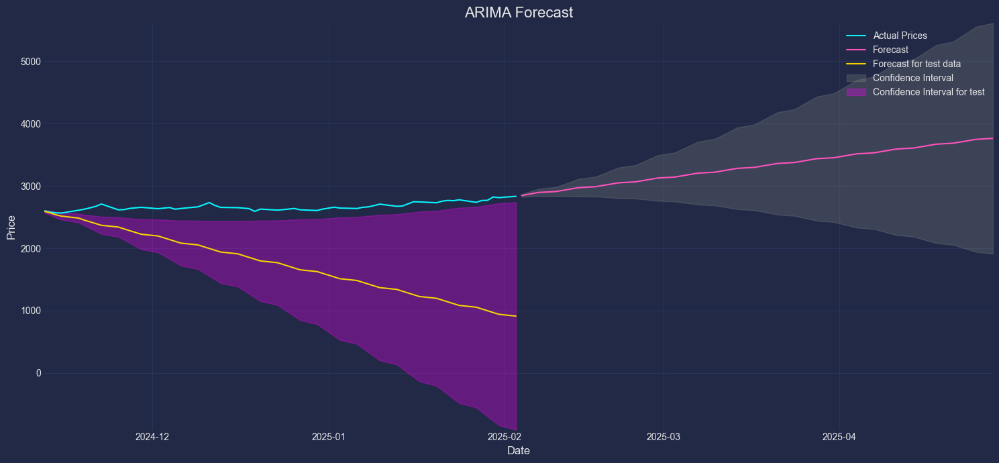

In [74]:
plt.figure(figsize=(15, 7))
lineplot(x=df.index, y=df["y"], label="Actual Prices")
lineplot(x=forecast_df.index, y=forecast_df["Forecast"], label="Forecast")
lineplot(
    x=forecast_df_test.index,
    y=forecast_df_test["Forecast"],
    label="Forecast for test data",
)
plt.fill_between(
    forecast_df.index,
    forecast_df["Lower Bound"],
    forecast_df["Upper Bound"],
    color="gray",
    alpha=0.3,
    label="Confidence Interval",
)
plt.fill_between(
    forecast_df_test.index,
    forecast_df_test["Lower Bound"],
    forecast_df_test["Upper Bound"],
    color="magenta",
    alpha=0.3,
    label="Confidence Interval for test",
)
plt.title("ARIMA Forecast", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Price", fontsize=12)
plt.legend()
plt.xlim(df.index[-n_steps], forecast.index[-1])
max_y = max(max(df["y"].iloc[-n_steps:]), max(forecast_df["Upper Bound"]))
min_y = min(
    min(df["y"].iloc[-n_steps:]),
    min(forecast_df["Lower Bound"]),
    min(forecast_df_test["Lower Bound"]),
)
plt.ylim(min_y, max_y)
plt.tight_layout()
plt.show()

In [75]:
metrics_ = get_metrics(
    df["y"].iloc[-n_steps:], forecast_test, df["y"].iloc[:-n_steps], "ARIMA"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


### Conclusion
- Forecast accuracy on training data:
The forecast trend of the orange line follows the real data well up to a certain point, but starting from the end of September 2024, there is a slight overestimation of the values ​​(the orange line is higher than the blue one).
Confidence intervals look reasonable in the area where the forecast values ​​almost coincide with the real ones, but by October, the confidence intervals begin to widen significantly, indicating high uncertainty.
- Forecast on test data (multi-step forecast):
On the right side of the graph, starting from October 2024, the model builds a forecast for 30 steps ahead (periods based on the working calendar), and the confidence interval widens significantly. This may indicate that the model is losing accuracy on the long-term horizon.
Visually, it seems that the forecast trend is a little "smoothed out" and the model may not capture short-term fluctuations or seasonal changes.

What can be improved:
- Adding exogenous variables:

If additional data that affects gold prices is available (e.g. dollar exchange rate, oil prices, inflation), they can be included in the model as external regressors. This will help to take into account economic factors that can improve the accuracy of the forecast.
Thus, although the ARIMA model gives reasonable forecasts, more complex models or a combination of several approaches (ETS, hybrids) can be used to improve the quality of the long-term forecast and reduce uncertainty.

## ARIMA model with additional variables (ARIMAX)

In [76]:
start_idx = df.index.get_loc(datetime.fromisoformat("2006-05-22"))

In [77]:
df[exog_cols].iloc[start_idx:].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4881 entries, 2006-05-22 to 2025-02-03
Freq: B
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DX-Y.NYB  4881 non-null   float64
 1   WTI       4881 non-null   float64
 2   IRX       4881 non-null   float64
 3   GDX       4881 non-null   float64
 4   EURUSD    4881 non-null   float64
 5   VIX       4881 non-null   float64
 6   GSPC      4881 non-null   float64
 7   TNX       4881 non-null   float64
 8   DJI       4881 non-null   float64
 9   SI        4881 non-null   float64
dtypes: float64(10)
memory usage: 419.5 KB


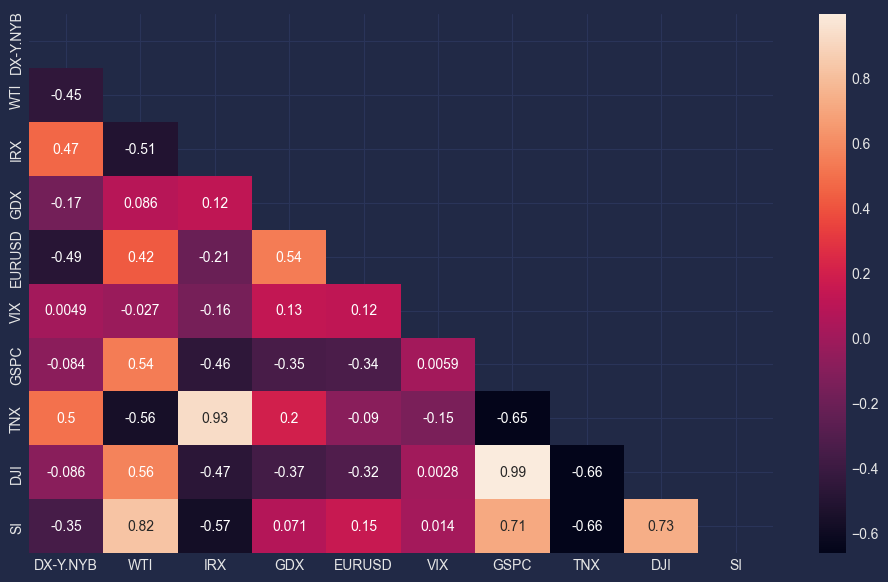

In [78]:
plot_corr_heatmap(df[exog_cols])

In [79]:
scaler = StandardScaler()

In [80]:
exog = pd.DataFrame(
    scaler.fit_transform(df[exog_cols].iloc[start_idx:]),
    columns=exog_cols,
    index=df.index[start_idx:],
)
exog

,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,GSPC,TNX,DJI,SI
Date,,,,,,,,,,
2006-05-22,-0.570887,-0.162882,1.741892,0.294049,0.418002,-0.212498,-0.914266,2.064381,-1.013837,-1.227626
2006-05-23,-0.570887,-0.046855,1.758055,0.356338,0.366756,-0.151500,-0.918472,2.092036,-1.016669,-1.115305
2006-05-24,-0.510308,-0.133990,1.752667,0.233466,0.360180,-0.253163,-0.916947,2.062538,-1.014678,-1.213303
2006-05-25,-0.540597,-0.067033,1.749973,0.387057,0.386538,-0.463267,-0.905983,2.099410,-1.004838,-1.199734
2006-05-26,-0.479009,-0.064740,1.758055,0.406682,0.334564,-0.603336,-0.900405,2.079131,-0.997745,-1.179380
...,...,...,...,...,...,...,...,...,...,...
2025-01-28,1.803807,0.045325,1.476820,0.334153,-1.345004,-0.360474,2.767749,1.617306,2.526646,1.542242
2025-01-29,1.816932,-0.007415,1.475743,0.351219,-1.356729,-0.343530,2.745996,1.620993,2.512281,1.619283
2025-01-30,1.796739,-0.002370,1.472510,0.480917,-1.359515,-0.424861,2.770407,1.581356,2.529982,1.789045


In [81]:
model_arimax = SARIMAX(df["y"].iloc[start_idx:], exog=exog, order=(5, 1, 0), freq="B")
arimax_result = model_arimax.fit(maxiter=200)

In [82]:
arimax_result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 4881
Model:               SARIMAX(5, 1, 0)   Log Likelihood              -17428.404
Date:                Tue, 04 Feb 2025   AIC                          34888.808
Time:                        12:04:12   BIC                          34992.695
Sample:                    05-22-2006   HQIC                         34925.264
                         - 02-03-2025                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
DX-Y.NYB     -12.5572      2.787     -4.506      0.000     -18.019      -7.096
WTI           -0.4679      1.348     -0.347      0.729      -3.110       2.174
IRX          -12.7708      4.426     -2.885      0.004     -21.446      -4.096
GDX           65.7143      1.515     43.372      0.000      62.745      68.684
EURUSD        -0.7893      1.800     -0.439      0.661      -4.317       2.738
VIX            5.7159      0.473     12.094      0.000       4.790       6.642
GSPC         -12.3149     11.064     -1.113      0.266     -34.001       9.371
TNX          -35.1669      1.918    -18.339      0.000     -38.925     -31.409
DJI            2.7353      8.870      0.308      0.758     -14.650      20.120
SI           128.4637      0.962    133.581      0.000     126.579     130.349
ar.L1         -0.0737      0.008     -8.962      0.000      -0.090      -0.058
ar.L2         -0.0421      0.009     -4.438      0.000      -0.061      -0.023
ar.L3          0.0316      0.010      3.323      0.001       0.013       0.050
ar.L4          0.0022      0.010      0.230      0.818      -0.017       0.021
ar.L5          0.0028      0.009      0.295      0.768      -0.016       0.021
sigma2        74.0568      0.757     97.873      0.000      72.574      75.540
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):             10866.45
Prob(Q):                              0.88   Prob(JB):                         0.00
Heteroskedasticity (H):               1.35   Skew:                             0.07
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Прогнозирование

In [83]:
forecast_arimax = arimax_result.get_forecast(steps=n_steps, exog=exog.iloc[-n_steps:])

In [84]:
forecast = forecast_arimax.predicted_mean
conf_int = forecast_arimax.conf_int()

In [85]:
future_dates = pd.date_range(df.index[-1], periods=n_steps + 1, freq="B")[1:]
forecast_df = pd.DataFrame(
    {
        "Forecast": forecast,
        "Lower Bound": conf_int.iloc[:, 0],
        "Upper Bound": conf_int.iloc[:, 1],
    },
    index=future_dates,
)

In [86]:
forecast_df

,Forecast,Lower Bound,Upper Bound
2025-02-04,2784.569600,2767.702888,2801.436312
2025-02-05,2777.750869,2754.760012,2800.741727
2025-02-06,2778.873968,2751.419560,2806.328375
2025-02-07,2776.523427,2744.928114,2808.118740
2025-02-10,2800.588285,2765.345169,2835.831401
2025-02-11,2807.685758,2769.138641,2846.232875
2025-02-12,2800.987721,2759.392198,2842.583244
2025-02-13,2800.916417,2756.481906,2845.350927
2025-02-14,2808.326287,2761.223201,2855.429374
2025-02-17,2785.853581,2736.225061,2835.482101


Forecast on test data

In [87]:
model_arimax_test = SARIMAX(
    df["y"].iloc[start_idx:-n_steps],
    exog=exog.iloc[:-n_steps],
    order=(5, 1, 0),
    freq="B",
)
arimax_result_test = model_arimax_test.fit(maxiter=500)

In [88]:
forecast_arimax_test = arimax_result_test.get_forecast(
    steps=n_steps, exog=exog.iloc[-n_steps * 2 : -n_steps]
)
forecast_ = forecast_arimax_test.predicted_mean
conf_int_ = forecast_arimax_test.conf_int()

In [89]:
forecast_df_test = pd.DataFrame(
    {
        "Forecast": forecast_,
        "Lower Bound": conf_int_.iloc[:, 0],
        "Upper Bound": conf_int_.iloc[:, 1],
    },
    index=df.index[-n_steps:],
)

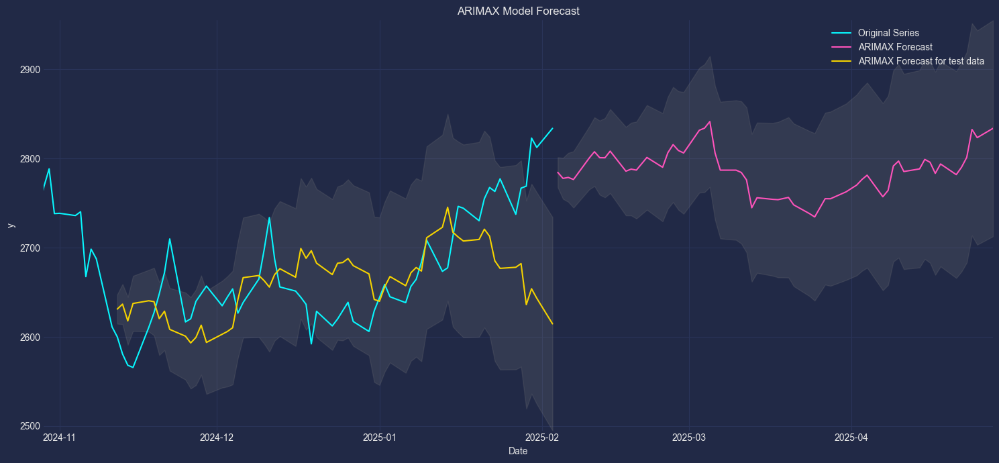

In [90]:
plt.figure(figsize=(15, 7))
lineplot(data=df["y"], label="Original Series")
lineplot(data=forecast_df["Forecast"], label="ARIMAX Forecast")
lineplot(data=forecast_df_test["Forecast"], label="ARIMAX Forecast for test data")
plt.fill_between(
    forecast_df.index,
    forecast_df["Lower Bound"],
    forecast_df["Upper Bound"],
    color="grey",
    alpha=0.2,
    label="Confidence Interval",
)
plt.fill_between(
    forecast_df_test.index,
    forecast_df_test["Lower Bound"],
    forecast_df_test["Upper Bound"],
    color="grey",
    alpha=0.2,
    label="Confidence Interval",
)
plt.title("ARIMAX Model Forecast")
plt.xlim(df.index[-n_steps - 10], forecast_df.index[-1])
max_y = max(max(forecast_df["Forecast"]), max(forecast_df["Upper Bound"]))
min_y = min(
    min(df["y"].iloc[-n_steps:]),
    min(forecast_df["Lower Bound"]),
    min(forecast_df_test["Lower Bound"]),
)
plt.ylim(min_y, max_y)
plt.tight_layout()
plt.show()

In [91]:
metrics_ = get_metrics(
    df["y"].iloc[-n_steps:],
    forecast_df_test["Forecast"],
    df["y"].iloc[:-n_steps],
    "ARIMAX",
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


### Conclusion

ARIMAX shows results much better than ARIMA. But still worse than the base model Naive forecast.

## ARFIMA

The ARFIMA (AutoRegressive Fractionally Integrated Moving Average) model is an extension of the ARIMA model that takes into account the properties of long-term dependence in time series. It is useful for modeling time series where there is evidence of fractional integration (i.e., the time series has a fractional degree of stationarity). ARFIMA can be useful for analyzing financial data, such as gold prices, which exhibit both short-term volatility and long-term trends.

In [92]:
columns = exog_cols + ["y"]
data = df[columns].copy()
train_data = data[:-n_steps]
test_data = data[-n_steps:]
train_exog = train_data[exog_cols]
test_exog = test_data[exog_cols]

In [93]:
arfima_model = pm.auto_arima(
    train_data["y"],
    exogenous=train_exog,
    seasonal=False,
    suppress_warnings=True,
    stepwise=True,
    error_action="ignore",
    start_p=0,
    max_p=6,
    start_q=0,
    max_q=6,
    start_d=0,
    max_d=3,
    trace=True,  # Показать процесс подбора параметров
)
arfima_model.summary()

Performing stepwise search to minimize aic
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=96447.958, Time=0.20 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=93039.791, Time=0.29 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.98 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=96445.960, Time=0.17 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=91493.732, Time=0.41 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=90842.383, Time=1.23 sec
 ARIMA(4,2,0)(0,0,0)[0] intercept   : AIC=90358.316, Time=1.61 sec
 ARIMA(5,2,0)(0,0,0)[0] intercept   : AIC=90117.991, Time=1.85 sec
 ARIMA(6,2,0)(0,0,0)[0] intercept   : AIC=89879.710, Time=2.20 sec
 ARIMA(6,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=8.10 sec
 ARIMA(5,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=7.61 sec
 ARIMA(6,2,0)(0,0,0)[0]             : AIC=89877.726, Time=0.97 sec
 ARIMA(5,2,0)(0,0,0)[0]             : AIC=90116.004, Time=0.83 sec
 ARIMA(6,2,1)(0,0,0)[0]             : AIC=inf, Time=3.69 sec
 ARIMA(5,2,1)(0,0,0)[0]             : AIC=i

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                11708
Model:               SARIMAX(6, 2, 0)   Log Likelihood              -44931.863
Date:                Tue, 04 Feb 2025   AIC                          89877.726
Time:                        12:04:54   BIC                          89929.301
Sample:                    12-27-1979   HQIC                         89895.048
                         - 11-11-2024                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8595      0.004   -191.773      0.000      -0.868      -0.851
ar.L2         -0.7157      0.006   -130.101      0.000      -0.727      -0.705
ar.L3         -0.5439      0.006    -87.841      0.000      -0.556      -0.532
ar.L4         -0.4144      0.006    -67.264      0.000      -0.427      -0.402
ar.L5         -0.2640      0.006    -45.348      0.000      -0.275      -0.253
ar.L6         -0.1434      0.004    -32.146      0.000      -0.152      -0.135
sigma2       126.3117      0.605    208.687      0.000     125.125     127.498
===================================================================================
Ljung-Box (L1) (Q):                   3.97   Jarque-Bera (JB):            105176.49
Prob(Q):                              0.05   Prob(JB):                         0.00
Heteroskedasticity (H):               5.28   Skew:                            -0.66
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [94]:
forecast, conf_int = arfima_model.predict(
    n_periods=n_steps, exogenous=test_exog, return_conf_int=True
)
forecast_df = pd.DataFrame(
    {"forecast": forecast, "lower_ci": conf_int[:, 0], "upper_ci": conf_int[:, 1]},
    index=test_data.index,
)
forecast_df

,forecast,lower_ci,upper_ci
Date,,,
2024-11-12,2595.165651,2573.137912,2617.193390
2024-11-13,2573.271308,2539.858545,2606.684071
2024-11-14,2549.831185,2505.768498,2593.893872
2024-11-15,2522.411882,2467.084097,2577.739666
2024-11-18,2500.974302,2433.838157,2568.110446
2024-11-19,2473.978131,2393.881362,2554.074900
2024-11-20,2443.189969,2349.011973,2537.367965
2024-11-21,2419.283335,2309.382865,2529.183805
2024-11-22,2393.992663,2267.986924,2519.998402


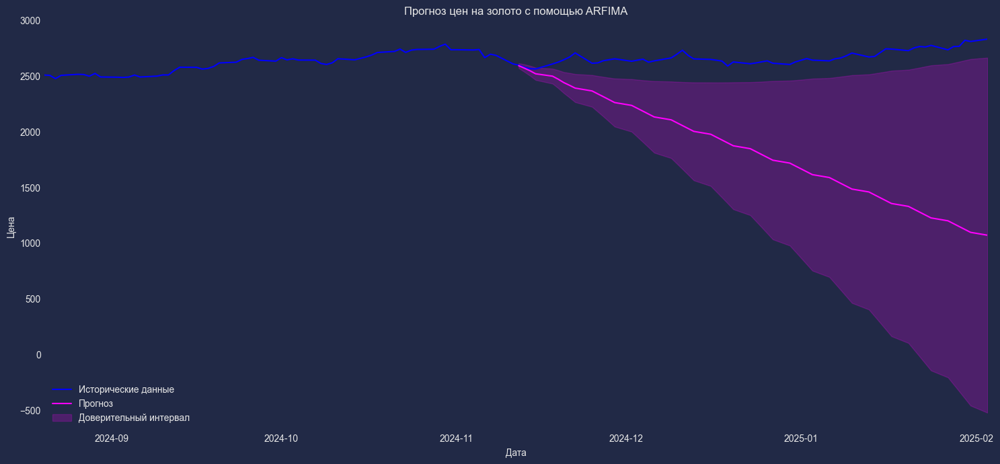

In [95]:
plt.figure(figsize=(15, 7))
plt.plot(data.index, data["y"], label="Исторические данные", color="blue")
plt.plot(forecast_df.index, forecast_df["forecast"], label="Прогноз", color="magenta")
plt.fill_between(
    forecast_df.index,
    forecast_df["lower_ci"],
    forecast_df["upper_ci"],
    color="magenta",
    alpha=0.2,
    label="Доверительный интервал",
)
plt.title("Прогноз цен на золото с помощью ARFIMA")
plt.xlabel("Дата")
plt.ylabel("Цена")
plt.legend()
plt.grid()
plt.xlim(train_data.index[-n_steps], forecast_df.index[-1])
plt.tight_layout()
plt.show()

In [96]:
metrics_ = get_metrics(
    df["y"].iloc[-n_steps:], forecast_df["forecast"], df["y"].iloc[:-n_steps], "ARFIMA"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


Видим что ARFIMA тоже не особо подходит.

# StatsForecast

## AutoARIMA

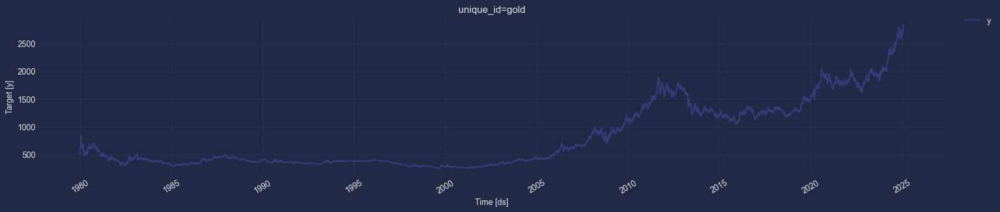

In [97]:
StatsForecast.plot(Y_ts)

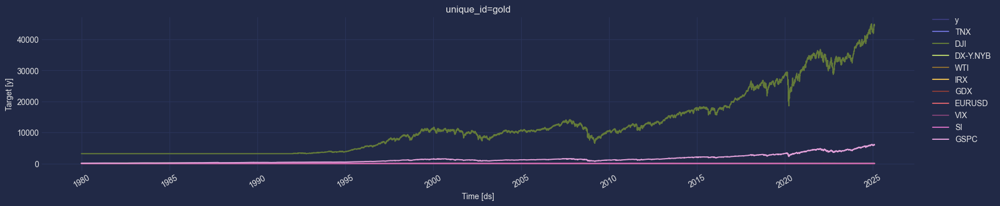

In [98]:
StatsForecast.plot(Y_ts, X_ts, max_insample_length=0)

Add exogenous regressors

In [99]:
train = Y_train.merge(X_ts, how="left", on=["unique_id", "ds"])
train.head()

,ds,unique_id,y,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC
0,1979-12-27,gold,515.50,10.4600,3172.399902,85.510002,32.049999,11.9700,37.23,1.196501,17.24,4.93,107.959999
1,1979-12-28,gold,512.00,10.4100,3172.399902,85.809998,32.049999,11.9200,37.23,1.196501,17.24,4.93,107.839996
2,1979-12-31,gold,512.00,10.4325,3172.399902,85.687498,32.049999,11.9825,37.23,1.196501,17.24,4.93,107.319998
3,1980-01-01,gold,512.00,10.4550,3172.399902,85.564999,32.049999,12.0450,37.23,1.196501,17.24,4.93,106.799999
4,1980-01-02,gold,559.75,10.5000,3172.399902,85.320000,32.049999,12.1700,37.23,1.196501,17.24,4.93,105.760002


Create future exogenous regressors

In [100]:
X_test.head()

,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC,ds,unique_id
Date,,,,,,,,,,,,
2024-11-12,4.432,43910.980469,106.019997,68.120003,4.423,36.110001,1.066439,14.710000,30.686001,5983.990234,2024-11-12,gold
2024-11-13,4.451,43958.191406,106.480003,68.430000,4.390,35.560001,1.061673,14.020000,30.590000,5985.379883,2024-11-13,gold
2024-11-14,4.418,43750.859375,106.669998,68.699997,4.383,35.720001,1.056412,14.310000,30.507999,5949.169922,2024-11-14,gold
2024-11-15,4.428,43444.988281,106.690002,67.019997,4.393,35.509998,1.053008,16.139999,30.371000,5870.620117,2024-11-15,gold
2024-11-18,4.414,43389.601562,106.279999,69.160004,4.403,37.020000,1.053375,15.580000,31.163000,5893.620117,2024-11-18,gold


Train model

In [101]:
models = [AutoARIMA(season_length=12)]

In [102]:
sf = StatsForecast(models=models, freq="B", verbose=True, n_jobs=NUM_CORES)

In [103]:
sf.fit(df=train)

StatsForecast(models=[AutoARIMA])

In [104]:
arima_string(sf.fitted_[0, 0].model_)

'Regression with ARIMA(3,1,5)(0,0,1)[12] errors'

In [105]:
result = sf.fitted_[0, 0].model_
print(result.keys())
print(result["arma"])

dict_keys(['coef', 'sigma2', 'var_coef', 'mask', 'loglik', 'aic', 'arma', 'residuals', 'code', 'n_cond', 'nobs', 'model', 'xreg', 'bic', 'aicc', 'ic', 'x', 'lambda'])
(3, 5, 0, 1, 12, 1, 0)


In [106]:
residual = pd.DataFrame(result.get("residuals"), columns=["residual Model"])
residual

,residual Model
0,0.464968
1,-3.253902
2,-0.530181
3,-0.525291
4,47.055253
...,...
11703,0.765933
11704,-27.613390
11705,13.650467
11706,0.695507


C:\Users\Matro\AppData\Local\Temp\ipykernel_20692\270385542.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  distplot(residual, ax=axs[0, 1])


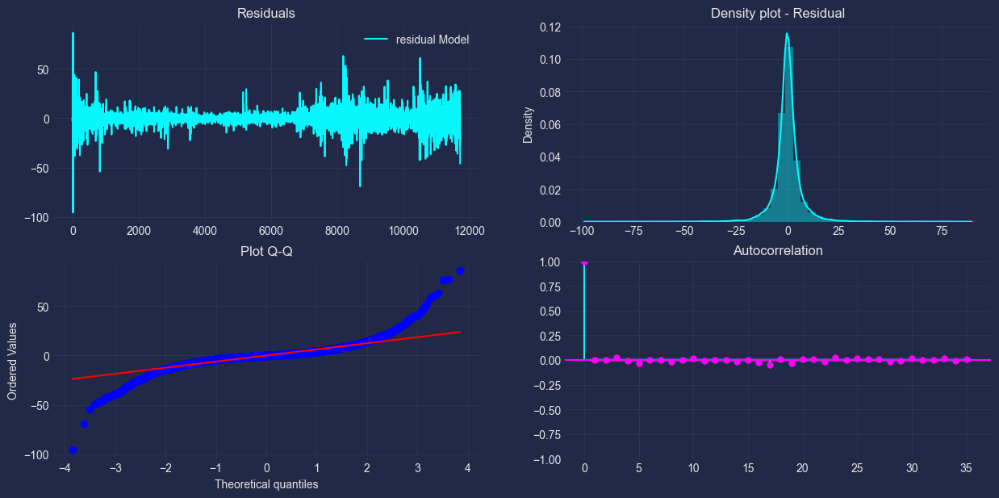

In [107]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 7))

# plot[1,1]
residual.plot(ax=axs[0, 0])
axs[0, 0].set_title("Residuals")

# plot
distplot(residual, ax=axs[0, 1])
axs[0, 1].set_title("Density plot - Residual")

# plot
stats.probplot(residual["residual Model"], dist="norm", plot=axs[1, 0])
axs[1, 0].set_title("Plot Q-Q")

# plot
plot_acf(residual, lags=35, ax=axs[1, 1], color="fuchsia")
axs[1, 1].set_title("Autocorrelation")

plt.show();

In [108]:
fcst = sf.predict(h=n_steps, X_df=X_test, level=[95])
fcst.head()

,unique_id,ds,AutoARIMA,AutoARIMA-lo-95,AutoARIMA-hi-95
0,gold,2024-11-12,2612.451139,2599.120265,2625.782013
1,gold,2024-11-13,2607.292772,2588.828714,2625.756831
2,gold,2024-11-14,2606.873184,2584.649420,2629.096949
3,gold,2024-11-15,2605.534402,2579.898248,2631.170556
4,gold,2024-11-18,2629.293215,2600.697725,2657.888706


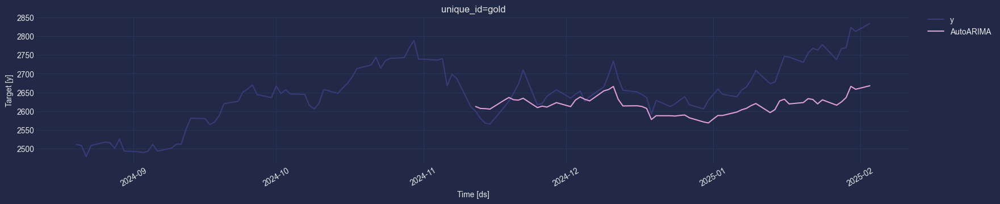

In [109]:
StatsForecast.plot(Y_ts, fcst, max_insample_length=n_steps * 2)

Evaluate results

In [110]:
res = Y_test.merge(fcst, how="left", on=["unique_id", "ds"])
res.head()

,ds,unique_id,y,AutoARIMA,AutoARIMA-lo-95,AutoARIMA-hi-95
0,2024-11-12,gold,2600.000000,2612.451139,2599.120265,2625.782013
1,2024-11-13,gold,2580.800049,2607.292772,2588.828714,2625.756831
2,2024-11-14,gold,2568.199951,2606.873184,2584.649420,2629.096949
3,2024-11-15,gold,2565.699951,2605.534402,2579.898248,2631.170556
4,2024-11-18,gold,2610.600098,2629.293215,2600.697725,2657.888706


In [111]:
mae = abs(res["y"] - res["AutoARIMA"]).mean()
print("The MAE with exogenous regressors is " + str(round(mae, 2)))

The MAE with exogenous regressors is 60.15


In [112]:
metrics_ = get_metrics(res["y"], res["AutoARIMA"], train["y"], "AutoArima with Exo")
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [113]:
fcst_u = sf.forecast(df=train[["unique_id", "ds", "y"]], h=n_steps)

Forecast:   0%|          | 0/1 [00:00<?, ?it/s]

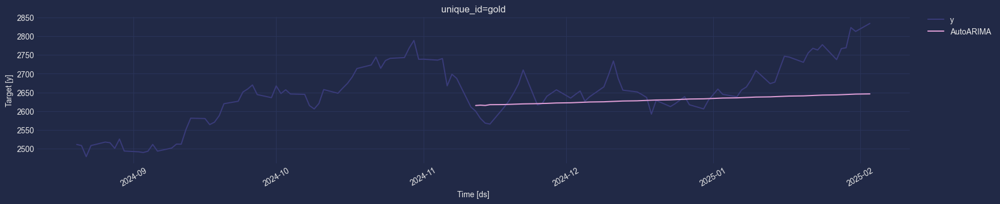

In [114]:
StatsForecast.plot(Y_ts, fcst_u, max_insample_length=n_steps * 2)

In [115]:
res_u = Y_test.merge(fcst_u, how="left", on=["unique_id", "ds"])
mae_u = abs(res_u["y"] - res_u["AutoARIMA"]).mean()
print("The MAE without exogenous regressors is " + str(round(mae_u, 2)))

The MAE without exogenous regressors is 50.21


In [116]:
metrics_ = get_metrics(res_u["y"], res_u["AutoARIMA"], train.y, "AutoArima without Exo")
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


Perform time series cross-validation

crossvalidation_df = sf.cross_validation(
    df=train, h=n_steps, step_size=n_steps, n_windows=5
)
crossvalidation_df.head()

crossvalidation_df.plot(x="ds", y=["y", "AutoARIMA"], figsize=(15, 7))

AutoArima with exogenous variables looks decent, it catches fluctuations, but there is a large shift and this is taking into account that the exogenous variables used were actual (that is, the ideal case), in reality it will be necessary to forecast the variables themselves. Without variables, the metrics look better, but there the forecast is just straight, it does not even fully capture the trend

## AutoETS

Exponential Smoothing Models are one of the key methods for forecasting time series. These models take into account past values ​​of the time series using exponential weights, where recent observations have more weight than older ones.

The main types of exponential smoothing are:
- 1 Simple Exponential Smoothing - used to forecast data without trend and seasonality.
- 2 Models with trend and seasonality (Holt-Winters) - an extension of simple smoothing, where trends and seasonal effects are taken into account.
- 3 State Space Models (ETS) - a generalized form of exponential smoothing, where trend, seasonality, and residuals can be taken into account.

ETS (Error, Trend, Seasonal) models are a generalization of exponential smoothing models. ETS models can take into account trend, seasonality, and errors in data. They allow flexible selection of components, which can be additive or multiplicative.
ETS model components:
- Error — additive or multiplicative error.
- Trend — additive or multiplicative trend.
- Seasonal — additive or multiplicative seasonality.

In [117]:
season_length = 12  # Define season length as 12 months for monthly data
horizon = n_steps  # Forecast horizon is set to 1 month

# Define a list of models for forecasting
models = [
    AutoETS(
        season_length=season_length
    ),  # ETS model with automatic error, trend, and seasonal component
]

In [118]:
sf = StatsForecast(models=models, freq="B", n_jobs=24, verbose=1)

In [119]:
sf = sf.fit(df=Y_train)

In [120]:
Y_hat_df = sf.predict(h=horizon)

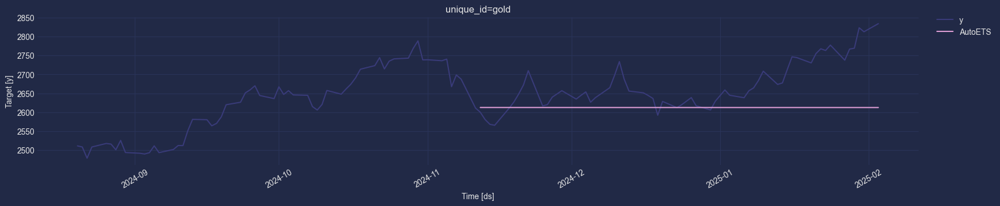

In [121]:
StatsForecast.plot(Y_ts, Y_hat_df, max_insample_length=n_steps * 2)

In [122]:
metrics_ = get_metrics(
    Y_test["y"].values, Y_hat_df["AutoETS"].values, Y_train["y"].values, "AutoETS"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [123]:
model = HoltWinters(season_length=12, error_type="A")
model = model.fit(y=Y_train["y"].values)
y_hat_dict = model.predict(h=n_steps, level=[95])

In [124]:
Y_hat_df["AutoETS"] = y_hat_dict["mean"]
Y_hat_df["AutoETS-lo-95"] = y_hat_dict["lo-95"]
Y_hat_df["AutoETS-hi-95"] = y_hat_dict["hi-95"]

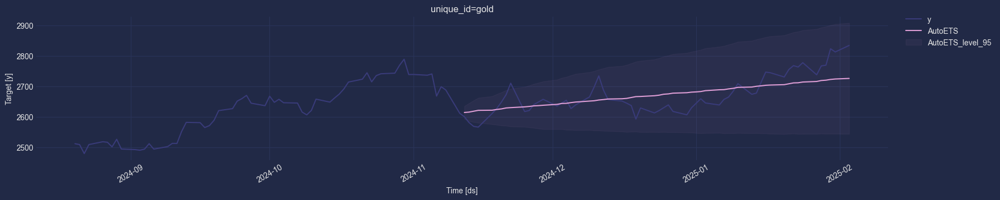

In [125]:
StatsForecast.plot(Y_ts, Y_hat_df, max_insample_length=n_steps * 2, level=[95])

In [126]:
metrics_ = get_metrics(
    Y_test["y"].values, Y_hat_df["AutoETS"].values, Y_train["y"].values, "HoltWinters"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


## AutoCES (Complex Exponential Smoothing model)

In [127]:
ces = AutoCES(model="Z", season_length=12)
sf = StatsForecast(models=[ces], freq="B")
sf.fit(df=Y_train)

StatsForecast(models=[CES])

In [128]:
result = sf.fitted_[0, 0].model_
print(result.keys())
print(result["fit"])

dict_keys(['loglik', 'aic', 'bic', 'aicc', 'mse', 'amse', 'fit', 'fitted', 'residuals', 'm', 'states', 'par', 'n', 'seasontype', 'sigma2', 'actual_residuals'])
results(x=array([1.8       , 1.00039085]), fn=165063.5975778651, nit=42, simplex=array([[1.8       , 1.00039085],
       [1.8       , 1.00039083],
       [1.8       , 1.00039082]]))


In [129]:
residual = pd.DataFrame(result.get("residuals"), columns=["residual Model"])
residual

,residual Model
0,0.347900
1,-3.542664
2,-0.821777
3,-0.272827
4,47.582336
...,...
11703,2.577148
11704,-72.744385
11705,15.598145
11706,-8.266113


C:\Users\Matro\AppData\Local\Temp\ipykernel_20692\270385542.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  distplot(residual, ax=axs[0, 1])


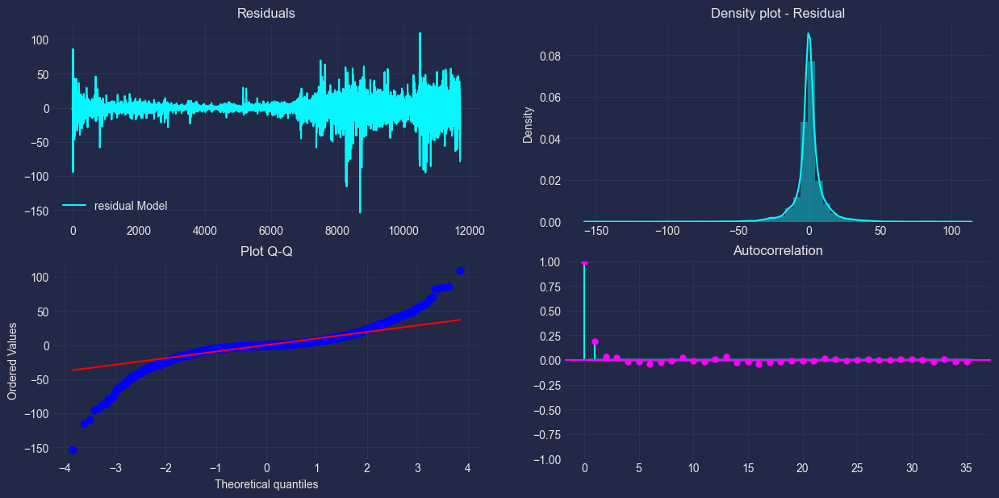

In [130]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 7))

# plot[1,1]
residual.plot(ax=axs[0, 0])
axs[0, 0].set_title("Residuals")

# plot
distplot(residual, ax=axs[0, 1])
axs[0, 1].set_title("Density plot - Residual")

# plot
stats.probplot(residual["residual Model"], dist="norm", plot=axs[1, 0])
axs[1, 0].set_title("Plot Q-Q")

# plot
plot_acf(residual, lags=35, ax=axs[1, 1], color="fuchsia")
axs[1, 1].set_title("Autocorrelation")

plt.show();

In [131]:
Y_hat = sf.forecast(df=Y_train, h=n_steps, fitted=True)

In [132]:
sf.forecast(df=Y_train, h=n_steps, level=[95])

,unique_id,ds,CES,CES-lo-95,CES-hi-95
0,gold,2024-11-12,2627.463379,2606.860400,2648.442694
1,gold,2024-11-13,2628.022949,2607.422705,2649.001233
2,gold,2024-11-14,2628.602051,2607.991760,2649.589465
3,gold,2024-11-15,2629.165771,2608.555756,2650.154041
4,gold,2024-11-18,2629.742188,2609.123853,2650.737927
5,gold,2024-11-19,2630.308594,2609.688812,2651.306610
6,gold,2024-11-20,2630.883301,2610.256665,2651.887604
7,gold,2024-11-21,2631.451660,2610.822351,2652.458948
8,gold,2024-11-22,2632.025146,2611.389966,2653.038257
9,gold,2024-11-25,2632.594727,2611.956378,2653.611530


In [133]:
y_hat = sf.predict(h=n_steps, level=[95])

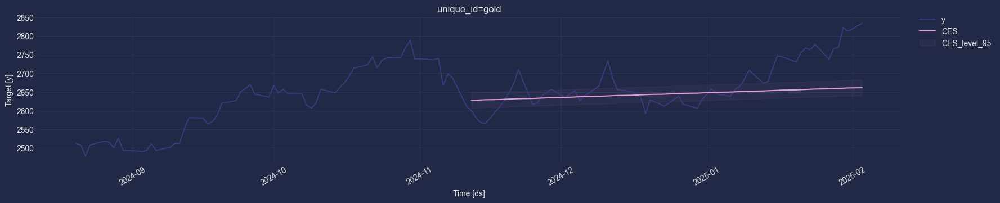

In [134]:
StatsForecast.plot(Y_ts, y_hat, max_insample_length=n_steps * 2, level=[95])

In [135]:
metrics_ = get_metrics(Y_test["y"].values, y_hat["CES"], Y_train["y"].values, "CES")
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


## AutoTheta

Automatically selects the best Theta (Standard Theta Model (‘STM’), Optimized Theta Model (‘OTM’), Dynamic Standard Theta Model (‘DSTM’), Dynamic Optimized Theta Model (‘DOTM’)) model using mse.*

In [136]:
models = [AutoTheta(season_length=12, decomposition_type="additive")]

In [137]:
sf = StatsForecast(models=models, freq="B")

In [138]:
sf.fit(df=Y_train)

StatsForecast(models=[AutoTheta])

In [139]:
result = sf.fitted_[0, 0].model_
result

{'mse': 1609.375607049477,
 'amse': array([109.45956438, 215.3628309 , 319.50500734]),
 'fit': results(x=array([310.44721141,   0.99      ]), fn=1609.3756070541801, nit=9, simplex=array([[341.55233084,   0.99      ],
        [310.44721141,   0.99      ],
        [363.19505148,   0.99      ]])),
 'residuals': array([ 2.69421585e+02, -7.75573730e-01,  1.56677246e-01, ...,
         3.01442871e+01, -1.04455566e+01, -7.63535156e+01]),
 'm': 12,
 'states': array([[ 5.1282178e+02,  5.1539874e+02, -2.3381901e+01,  1.3999785e-01,
          2.4607841e+02],
        [ 5.1177377e+02,  5.1358099e+02, -2.3381901e+01,  1.3999785e-01,
          5.1277557e+02],
        [ 5.1177670e+02,  5.1297955e+02, -2.3381901e+01,  1.3999785e-01,
          5.1184332e+02],
        ...,
        [ 2.6978748e+03,  7.9591919e+02, -2.3381901e+01,  1.3999785e-01,
          2.6682556e+03],
        [ 2.6874827e+03,  7.9608075e+02, -2.3381901e+01,  1.3999785e-01,
          2.6979456e+03],
        [ 2.6117852e+03,  7.9623578e+0

In [140]:
residual = pd.DataFrame(result.get("residuals"), columns=["residual Model"])
residual

,residual Model
0,269.421585
1,-0.775574
2,0.156677
3,0.152588
4,47.893311
...,...
11703,4.327637
11704,-72.514893
11705,30.144287
11706,-10.445557


C:\Users\Matro\AppData\Local\Temp\ipykernel_20692\784610873.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  distplot(residual, ax=axs[0, 1])


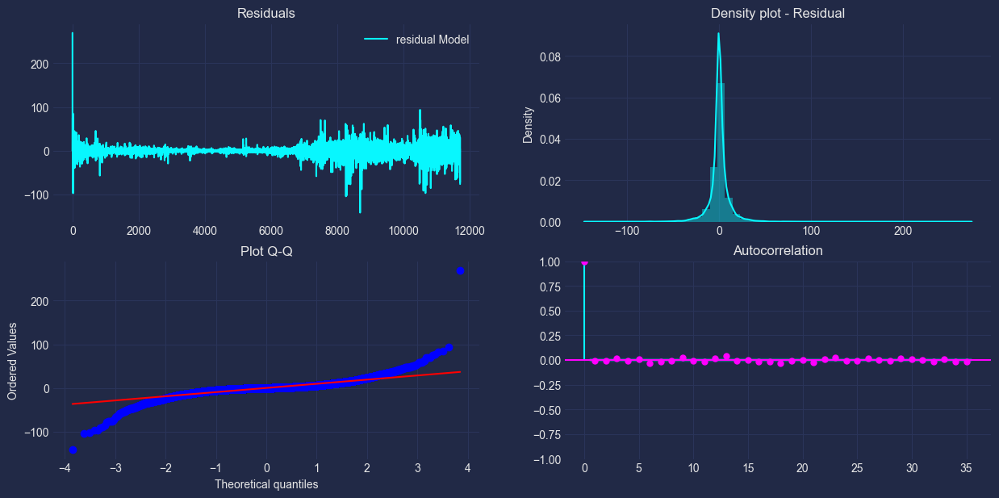

In [141]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 7))

residual.plot(ax=axs[0, 0])
axs[0, 0].set_title("Residuals")

distplot(residual, ax=axs[0, 1])
axs[0, 1].set_title("Density plot - Residual")

stats.probplot(residual["residual Model"], dist="norm", plot=axs[1, 0])
axs[1, 0].set_title("Plot Q-Q")

plot_acf(residual, lags=35, ax=axs[1, 1], color="fuchsia")
axs[1, 1].set_title("Autocorrelation")

plt.show();

In [142]:
forecast_df = sf.predict(h=n_steps, level=[95])
forecast_df

,unique_id,ds,AutoTheta,AutoTheta-lo-95,AutoTheta-hi-95
0,gold,2024-11-12,2611.593246,2594.511086,2631.937649
1,gold,2024-11-13,2611.537704,2582.484610,2638.754074
2,gold,2024-11-14,2611.512091,2573.389826,2645.280573
3,gold,2024-11-15,2611.758014,2572.218292,2651.044513
4,gold,2024-11-18,2612.237490,2564.907393,2656.730373
5,gold,2024-11-19,2612.443113,2564.377134,2659.575730
6,gold,2024-11-20,2612.499643,2554.344779,2658.390170
7,gold,2024-11-21,2612.560364,2552.189649,2669.947260
8,gold,2024-11-22,2612.557530,2551.270982,2672.098552
9,gold,2024-11-25,2612.711897,2549.700960,2674.196266


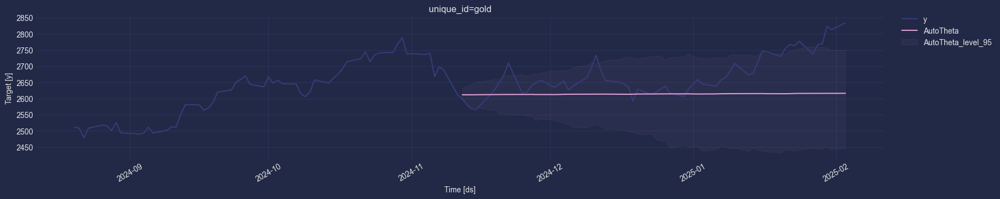

In [143]:
StatsForecast.plot(Y_ts, forecast_df, max_insample_length=n_steps * 2, level=[95])

In [144]:
metrics_ = get_metrics(
    Y_test["y"].values,
    forecast_df["AutoTheta"].values,
    Y_train["y"].values,
    "AutoTheta",
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


## AutoMFLES

In [145]:
mfles_model = AutoMFLES(test_size=n_steps, season_length=[12], metric="smape")

In [146]:
mfles_model.fit(y=Y_train["y"].values, X=X_train.iloc[:, :-2].values)

AutoMFLES

In [147]:
predicted = mfles_model.predict(n_steps, X=X_test.iloc[:, :-2].values)["mean"]
fitted = mfles_model.predict_in_sample()["fitted"]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


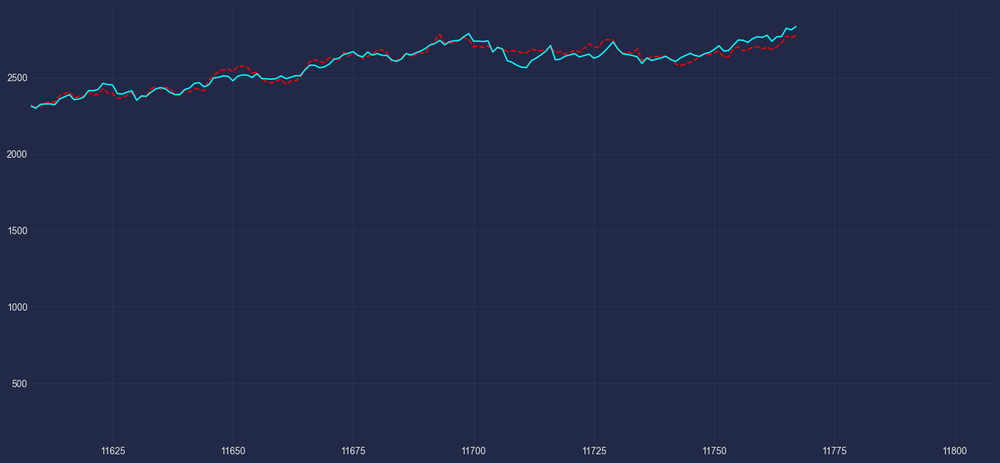

In [148]:
plt.figure(figsize=(15, 7))
plt.plot(np.append(fitted, predicted), linestyle="dashed", color="red")
plt.plot(Y_ts["y"].values)
plt.xlim(len(Y_train) - 100, len(Y_train) + 100)
plt.legend()
plt.tight_layout()
plt.show()

In [149]:
metrics_ = get_metrics(Y_test["y"].values, predicted, Y_train["y"].values, "AutoMFLES")
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


## AutoTBATS

In [150]:
tbats_model = AutoTBATS(season_length=[12])

In [151]:
tbats_model.fit(y=Y_train["y"].values)

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\statsforecast\tbats.py:571: RuntimeWarning: overflow encountered in square
  log_likelihood = n * np.log(np.nansum(e**2))
C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\statsforecast\tbats.py:571: RuntimeWarning: overflow encountered in square
  log_likelihood = n * np.log(np.nansum(e**2))
C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


AutoTBATS

In [152]:
predicted = tbats_model.predict(n_steps, level=[95])

In [153]:
predicted_df = pd.DataFrame(
    {
        "AutoTBATS": predicted["mean"],
        "AutoTBATS-lo-95": predicted["lo-95"],
        "AutoTBATS-hi-95": predicted["hi-95"],
        "ds": Y_test.ds,
        "unique_id": Y_test.unique_id,
    }
)

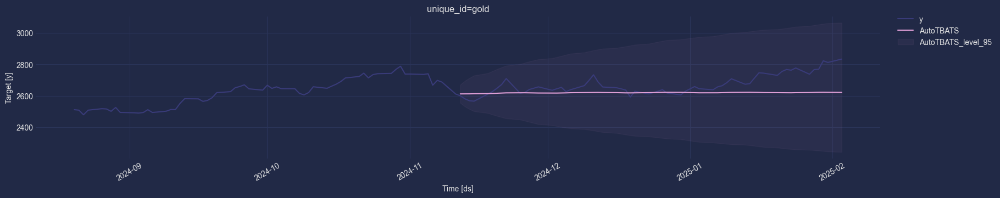

In [154]:
StatsForecast.plot(Y_ts, predicted_df, max_insample_length=n_steps * 2, level=[95])

In [155]:
metrics_ = get_metrics(
    Y_test["y"].values, predicted["mean"], Y_train["y"].values, "AutoTBATS"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


# MLForecast

In [156]:
models = [
    lgb.LGBMRegressor(random_state=RND, verbosity=-1),
]

In [157]:
fcst = MLForecast(
    models=models,
    freq="B",
    lags=[5, 10, n_steps],
    lag_transforms={1: [ExpandingMean()], 7: [RollingMean(window_size=n_steps)]},
    date_features=["dayofweek"],
    target_transforms=[Differences([1])],
)

In [158]:
fcst.fit(Y_train)

MLForecast(models=[LGBMRegressor], freq=B, lag_features=['lag5', 'lag10', 'lag60', 'expanding_mean_lag1', 'rolling_mean_lag7_window_size60'], date_features=['dayofweek'], num_threads=1)

In [159]:
predictions = fcst.predict(n_steps)
predictions

,unique_id,ds,LGBMRegressor
0,gold,2024-11-12,2593.653336
1,gold,2024-11-13,2610.754665
2,gold,2024-11-14,2594.635232
3,gold,2024-11-15,2606.093074
4,gold,2024-11-18,2623.633354
5,gold,2024-11-19,2628.621460
6,gold,2024-11-20,2636.329218
7,gold,2024-11-21,2640.477794
8,gold,2024-11-22,2663.829443
9,gold,2024-11-25,2659.469422


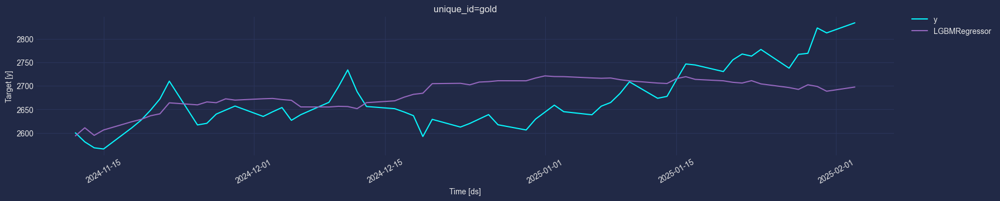

In [160]:
plot_series(Y_test, predictions, max_ids=4, plot_random=False)

In [161]:
metrics_ = get_metrics(
    Y_test["y"].values,
    predictions["LGBMRegressor"],
    Y_train["y"].values,
    "LGBMRegressor",
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


# Gradient Boosting (CatBoost)

In [162]:
def create_lag_features(
    data: pd.DataFrame, target_col: str, lags: int = 5
) -> pd.DataFrame:
    """
    Create lag features for a time series DataFrame.

    Parameters
    ----------
    data : pd.DataFrame
        DataFrame containing the time series data.

    target_col : str
        Column name for which lag features need to be created.

    lags : int, optional
        Number of lag features to create (default is 5).

    Returns
    -------
    pd.DataFrame
        DataFrame with lag features added.
    """
    # Ensure modifications happen on a copy of the data
    data = data.copy()
    for lag in range(1, lags + 1):
        data.loc[:, f"{target_col}_lag{lag}"] = data[target_col].shift(lag)
    return data

In [163]:
df_ = df[exog_cols + ["y"]].copy()
df_["Date"] = df.index
df_

,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,GSPC,TNX,DJI,SI,y,Date
Date,,,,,,,,,,,,
1979-12-27,85.510002,32.049999,11.9700,37.230000,1.196501,17.240000,107.959999,10.4600,3172.399902,4.930000,515.500000,1979-12-27
1979-12-28,85.809998,32.049999,11.9200,37.230000,1.196501,17.240000,107.839996,10.4100,3172.399902,4.930000,512.000000,1979-12-28
1979-12-31,85.687498,32.049999,11.9825,37.230000,1.196501,17.240000,107.319998,10.4325,3172.399902,4.930000,512.000000,1979-12-31
1980-01-01,85.564999,32.049999,12.0450,37.230000,1.196501,17.240000,106.799999,10.4550,3172.399902,4.930000,512.000000,1980-01-01
1980-01-02,85.320000,32.049999,12.1700,37.230000,1.196501,17.240000,105.760002,10.5000,3172.399902,4.930000,559.750000,1980-01-02
...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-28,107.870003,73.769997,4.1900,37.700001,1.044506,16.410000,6067.700195,4.5510,44850.351562,30.726999,2766.800049,2025-01-28
2025-01-29,108.000000,72.620003,4.1880,37.900002,1.042905,16.559999,6039.310059,4.5550,44713.519531,31.238001,2769.100098,2025-01-29
2025-01-30,107.800003,72.730003,4.1820,39.419998,1.042525,15.840000,6071.169922,4.5120,44882.128906,32.363998,2823.000000,2025-01-30


In [164]:
df_ = create_lag_features(df_, target_col="y", lags=n_steps)
df_

,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,GSPC,TNX,DJI,SI,...,y_lag51,y_lag52,y_lag53,y_lag54,y_lag55,y_lag56,y_lag57,y_lag58,y_lag59,y_lag60
Date,,,,,,,,,,,,,,,,,,,,,
1979-12-27,85.510002,32.049999,11.9700,37.230000,1.196501,17.240000,107.959999,10.4600,3172.399902,4.930000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1979-12-28,85.809998,32.049999,11.9200,37.230000,1.196501,17.240000,107.839996,10.4100,3172.399902,4.930000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1979-12-31,85.687498,32.049999,11.9825,37.230000,1.196501,17.240000,107.319998,10.4325,3172.399902,4.930000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-01,85.564999,32.049999,12.0450,37.230000,1.196501,17.240000,106.799999,10.4550,3172.399902,4.930000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1980-01-02,85.320000,32.049999,12.1700,37.230000,1.196501,17.240000,105.760002,10.5000,3172.399902,4.930000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-01-28,107.870003,73.769997,4.1900,37.700001,1.044506,16.410000,6067.700195,4.5510,44850.351562,30.726999,...,2610.600098,2565.699951,2568.199951,2580.800049,2600.000000,2611.199951,2687.500000,2698.399902,2667.600098,2740.300049
2025-01-29,108.000000,72.620003,4.1880,37.900002,1.042905,16.559999,6039.310059,4.5550,44713.519531,31.238001,...,2627.100098,2610.600098,2565.699951,2568.199951,2580.800049,2600.000000,2611.199951,2687.500000,2698.399902,2667.600098
2025-01-30,107.800003,72.730003,4.1820,39.419998,1.042525,15.840000,6071.169922,4.5120,44882.128906,32.363998,...,2648.199951,2627.100098,2610.600098,2565.699951,2568.199951,2580.800049,2600.000000,2611.199951,2687.500000,2698.399902


In [165]:
df_ = df_.dropna().reset_index(drop=True)  # Drop rows with NaN values due to lags

In [166]:
X = df_.drop(columns=["y"])
y = df_["y"]

In [167]:
X_train_ = X.iloc[:-n_steps]
X_test_ = X.iloc[-n_steps:]
y_train_ = y.iloc[:-n_steps]
y_test_ = y.iloc[-n_steps:]

In [168]:
model = CatBoostRegressor(iterations=2000, loss_function="RMSE", verbose=1)

In [169]:
model.fit(X_train_, y_train_, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.034349
0:	learn: 553.1971248	total: 147ms	remaining: 4m 53s
1:	learn: 535.0093861	total: 150ms	remaining: 2m 29s
2:	learn: 517.3878505	total: 153ms	remaining: 1m 42s
3:	learn: 500.2671915	total: 156ms	remaining: 1m 18s
4:	learn: 483.9413029	total: 159ms	remaining: 1m 3s
5:	learn: 467.9393683	total: 162ms	remaining: 53.9s
6:	learn: 452.4772382	total: 165ms	remaining: 46.9s
7:	learn: 437.7545729	total: 167ms	remaining: 41.6s
8:	learn: 423.2361827	total: 169ms	remaining: 37.5s
9:	learn: 409.7114991	total: 172ms	remaining: 34.1s
10:	learn: 396.2527803	total: 174ms	remaining: 31.5s
11:	learn: 383.1628744	total: 176ms	remaining: 29.2s
12:	learn: 370.7169014	total: 178ms	remaining: 27.3s
13:	learn: 358.4972500	total: 181ms	remaining: 25.6s
14:	learn: 346.7203220	total: 183ms	remaining: 24.2s
15:	learn: 335.3753570	total: 185ms	remaining: 23s
16:	learn: 324.4417579	total: 188ms	remaining: 21.9s
17:	learn: 313.9682916	total: 190ms	remaining: 20.9s
18:	learn: 303.8159190	t

In [170]:
y_pred = model.predict(X_test_)

In [171]:
mse = mean_squared_error(y_test_, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 6166.588730036976


In [172]:
def forecast_future(data, model, steps_ahead, exog_columns, target_col="y", lags=5):
    future_preds = []
    data_copy = data.copy()

    for step in range(steps_ahead):
        # Create the lag features for the last available data
        lagged_features = {
            f"{target_col}_lag{i}": data_copy[target_col].iloc[-i]
            for i in range(1, lags + 1)
        }
        # Use exogenous variables (replace with actual future values if available)
        exog_values = data_copy[exog_columns].iloc[-1].to_dict()
        # Combine all features
        new_features = {**lagged_features, **exog_values}
        # Convert to DataFrame for prediction
        new_row = pd.DataFrame([new_features])
        # Predict the next value
        next_value = model.predict(new_row)[0]
        future_preds.append(next_value)
        # Append the prediction to the dataset for further iterations
        new_row[target_col] = next_value
        data_copy = pd.concat([data_copy, new_row], ignore_index=True)

    return future_preds

In [173]:
exog_columns = X.columns.difference(
    [col for col in df if "lag" in col]
)  # Exogenous variables
future_forecast = forecast_future(df_, model, n_steps, exog_columns, lags=n_steps)

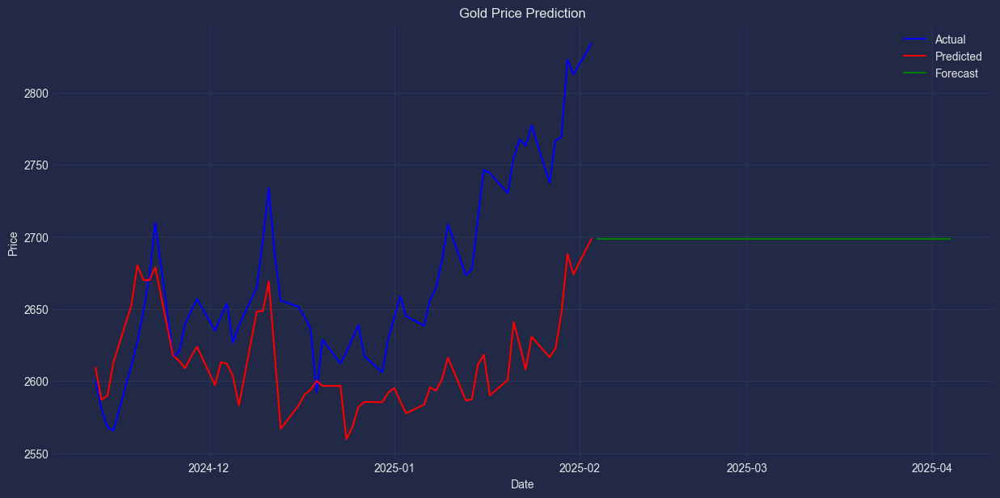

In [174]:
plt.figure(figsize=(15, 7))
plt.plot(df_["Date"][-len(y_test_) :], y_test_, label="Actual", color="blue")
plt.plot(df_["Date"][-len(y_test_) :], y_pred, label="Predicted", color="red")
future_dates = pd.date_range(
    start=df_["Date"].iloc[-1] + pd.Timedelta(days=1), periods=n_steps
)
plt.plot(future_dates, future_forecast, label="Forecast", color="green")
plt.legend()
plt.title("Gold Price Prediction")
plt.xlabel("Date")
plt.ylabel("Price")
plt.show()

In [175]:
metrics_ = get_metrics(
    df["y"].iloc[-n_steps:], y_pred, df["y"].iloc[:-n_steps], "CatBoost"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


# Neural Networks

## RNN based

### Simple RNN

In [176]:
def objective_rnn(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [-1, n_steps * 4, n_steps * 16, n_steps * 64],
        ),
        "encoder_hidden_size": trial.suggest_categorical(
            "encoder_hidden_size", [50, 100, 200, 300]
        ),
        "encoder_n_layers": trial.suggest_int("encoder_n_layers", 1, 4),
        "context_size": trial.suggest_categorical("context_size", [5, 10, 20]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "decoder_hidden_size": trial.suggest_categorical(
            "decoder_hidden_size", [64, 128, 256, 512]
        ),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [16, 32]),
    }
    print(params)

    model = RNN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [177]:
study_path = "study_rnn.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:14:50,844] Using an existing study with name 'study_rnn.db' instead of creating a new one.


In [178]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_rnn(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': -1, 'encoder_hidden_size': 100, 'encoder_n_layers': 3, 'context_size': 20, 'learning_rate': 0.09359047775636294, 'decoder_hidden_size': 128, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 16}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:15:42,246] Trial 56 finished with value: 1165.3270263671875 and parameters: {'input_size': -1, 'encoder_hidden_size': 100, 'encoder_n_layers': 3, 'context_size': 20, 'learning_rate': 0.09359047775636294, 'decoder_hidden_size': 128, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 16}. Best is trial 28 with value: 0.0.


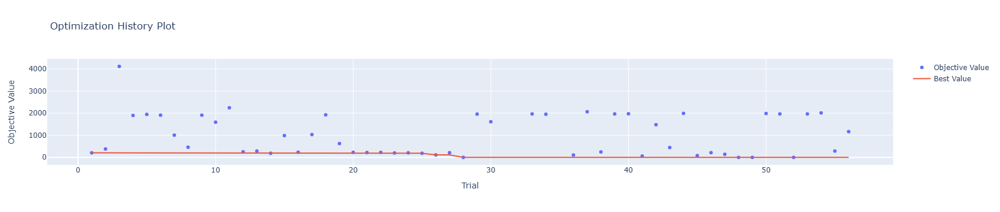

In [179]:
optuna.visualization.plot_optimization_history(study)

In [180]:
study.trials[26].params

{'input_size': -1,
 'encoder_hidden_size': 50,
 'encoder_n_layers': 1,
 'context_size': 5,
 'learning_rate': 0.0044609698109969375,
 'decoder_hidden_size': 256,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 32}

In [181]:
study.best_params

{'input_size': 3840,
 'encoder_hidden_size': 200,
 'encoder_n_layers': 1,
 'context_size': 5,
 'learning_rate': 0.012069936637014046,
 'decoder_hidden_size': 256,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 32}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


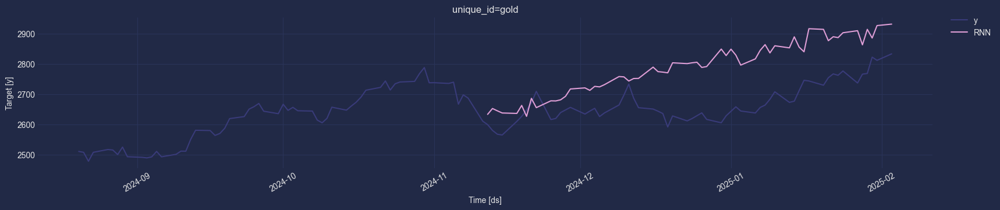

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [182]:
model = RNN(
    h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.trials[26].params
)
try_auto_model(model)

### LSTM (Long Short-Term Memory)

In [183]:
def objective_lstm(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [-1, n_steps * 4, n_steps * 16, n_steps * 64],
        ),
        "encoder_hidden_size": trial.suggest_categorical(
            "encoder_hidden_size", [50, 100, 200, 300]
        ),
        "encoder_n_layers": trial.suggest_int("encoder_n_layers", 1, 4),
        "context_size": trial.suggest_categorical("context_size", [5, 10, 20]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "decoder_hidden_size": trial.suggest_categorical(
            "decoder_hidden_size", [64, 128, 256, 512]
        ),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [16, 32]),
    }
    print(params)

    model = LSTM(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    print(model.metrics["ptl/val_loss"], type(model.metrics["ptl/val_loss"]))
    return model.metrics["ptl/val_loss"]

In [184]:
study_path = "study_LSTM_.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:16:01,692] Using an existing study with name 'study_LSTM_.db' instead of creating a new one.


In [185]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_lstm(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

{'input_size': -1, 'encoder_hidden_size': 50, 'encoder_n_layers': 2, 'context_size': 10, 'learning_rate': 0.001908496360241094, 'decoder_hidden_size': 64, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 16}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

tensor(40.4446) <class 'torch.Tensor'>
[I 2025-02-04 12:16:22,458] Trial 23 finished with value: 40.44463348388672 and parameters: {'input_size': -1, 'encoder_hidden_size': 50, 'encoder_n_layers': 2, 'context_size': 10, 'learning_rate': 0.001908496360241094, 'decoder_hidden_size': 64, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 16}. Best is trial 23 with value: 40.44463348388672.


In [186]:
study.best_params

{'input_size': -1,
 'encoder_hidden_size': 50,
 'encoder_n_layers': 2,
 'context_size': 10,
 'learning_rate': 0.001908496360241094,
 'decoder_hidden_size': 64,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 16}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


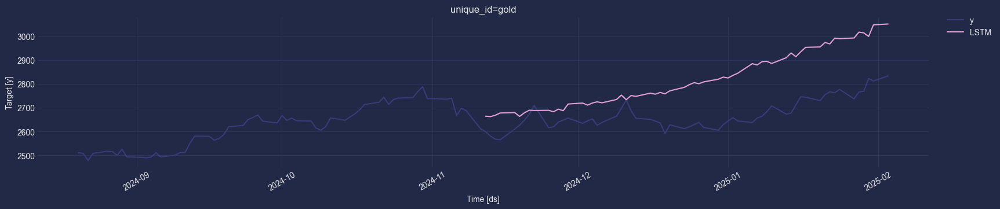

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [187]:
model = LSTM(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

### GRU (Gated Recurrent Unit)

In [188]:
def objective_gru(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [-1, n_steps * 4, n_steps * 16, n_steps * 64],
        ),
        "encoder_hidden_size": trial.suggest_categorical(
            "encoder_hidden_size", [50, 100, 200, 300]
        ),
        "encoder_n_layers": trial.suggest_int("encoder_n_layers", 1, 4),
        "context_size": trial.suggest_categorical("context_size", [5, 10, 50]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "decoder_hidden_size": trial.suggest_categorical(
            "decoder_hidden_size", [64, 128, 256, 512]
        ),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [16, 32]),
    }
    print(params)

    model = GRU(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [189]:
study_path = "study_GRU.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:16:43,851] Using an existing study with name 'study_GRU.db' instead of creating a new one.


In [190]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_gru(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': -1, 'encoder_hidden_size': 200, 'encoder_n_layers': 2, 'context_size': 50, 'learning_rate': 0.0012587959764242306, 'decoder_hidden_size': 512, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 16}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:26:44,226] Trial 22 finished with value: 139.86082458496094 and parameters: {'input_size': -1, 'encoder_hidden_size': 200, 'encoder_n_layers': 2, 'context_size': 50, 'learning_rate': 0.0012587959764242306, 'decoder_hidden_size': 512, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 16}. Best is trial 17 with value: 81.54753112792969.


In [191]:
study.best_params

{'input_size': -1,
 'encoder_hidden_size': 200,
 'encoder_n_layers': 2,
 'context_size': 50,
 'learning_rate': 0.0010504579419013441,
 'decoder_hidden_size': 512,
 'scaler_type': 'standard',
 'max_steps': 1000,
 'batch_size': 16}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


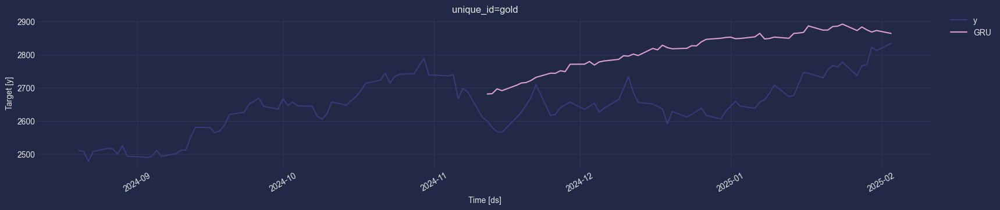

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [192]:
model = GRU(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

### Temporal Convolution Network (TCN)

In [193]:
def objective_tcn(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [-1, n_steps * 4, n_steps * 16, n_steps * 64],
        ),
        "encoder_hidden_size": trial.suggest_categorical(
            "encoder_hidden_size", [50, 100, 200, 300]
        ),
        "context_size": trial.suggest_categorical("context_size", [5, 10, 50]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "decoder_hidden_size": trial.suggest_categorical(
            "decoder_hidden_size", [64, 128]
        ),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [16, 32]),
    }
    print(params)

    model = TCN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [194]:
study_path = "study_TCN.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:36:41,011] Using an existing study with name 'study_TCN.db' instead of creating a new one.


In [195]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_tcn(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 240, 'encoder_hidden_size': 300, 'context_size': 10, 'learning_rate': 0.00010582255510106638, 'decoder_hidden_size': 128, 'scaler_type': None, 'max_steps': 500, 'batch_size': 16}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:36:46,121] Trial 21 finished with value: 208.2584686279297 and parameters: {'input_size': 240, 'encoder_hidden_size': 300, 'context_size': 10, 'learning_rate': 0.00010582255510106638, 'decoder_hidden_size': 128, 'scaler_type': None, 'max_steps': 500, 'batch_size': 16}. Best is trial 10 with value: 34.57432556152344.


In [196]:
study.best_params

{'input_size': -1,
 'encoder_hidden_size': 300,
 'context_size': 10,
 'learning_rate': 0.00012563743128946167,
 'decoder_hidden_size': 128,
 'scaler_type': None,
 'max_steps': 500,
 'batch_size': 16}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


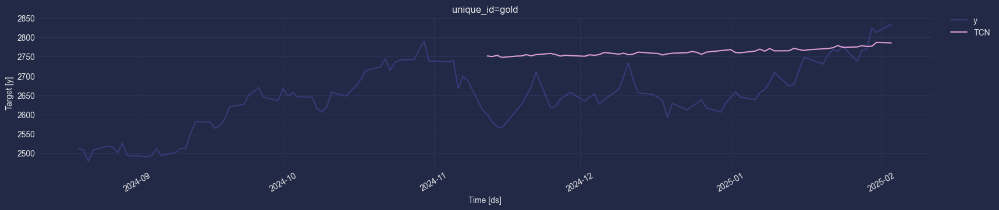

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [197]:
model = TCN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

### Autoregressive recurrent neural network (DeepAR)

In [198]:
def objective_deepar(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "lstm_hidden_size": trial.suggest_categorical(
            "lstm_hidden_size", [32, 64, 128, 256]
        ),
        "lstm_n_layers": trial.suggest_int("lstm_n_layers", 1, 4),
        "lstm_dropout": trial.suggest_float("lstm_dropout", 0.0, 0.5),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical("scaler_type", ["robust", "minmax1"]),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = DeepAR(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [199]:
study_path = "study_deepar.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:36:56,787] Using an existing study with name 'study_deepar.db' instead of creating a new one.


In [200]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_deepar(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 300, 'lstm_hidden_size': 128, 'lstm_n_layers': 2, 'lstm_dropout': 0.36130256077542955, 'learning_rate': 0.001760915203949394, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 256}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:37:19,933] Trial 13 finished with value: 10.191121101379395 and parameters: {'input_size': 300, 'lstm_hidden_size': 128, 'lstm_n_layers': 2, 'lstm_dropout': 0.36130256077542955, 'learning_rate': 0.001760915203949394, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 32, 'windows_batch_size': 256}. Best is trial 13 with value: 10.191121101379395.


In [201]:
study.best_params

{'input_size': 300,
 'lstm_hidden_size': 128,
 'lstm_n_layers': 2,
 'lstm_dropout': 0.36130256077542955,
 'learning_rate': 0.001760915203949394,
 'scaler_type': 'robust',
 'max_steps': 1000,
 'batch_size': 32,
 'windows_batch_size': 256}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 6)


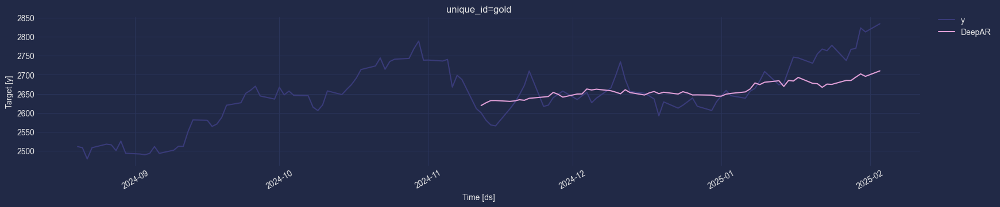

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [202]:
model = DeepAR(h=n_steps, random_seed=RND, **study.best_params)
try_auto_model(model)

### Dilated Recurrent Neural Network 

In [203]:
def objective_dilated_rnn(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [-1, n_steps * 4, n_steps * 16, n_steps * 64],
        ),
        "cell_type": trial.suggest_categorical("cell_type", ["LSTM", "GRU"]),
        "encoder_hidden_size": trial.suggest_categorical(
            "encoder_hidden_size", [50, 100, 200, 300]
        ),
        "dilations": trial.suggest_categorical(
            "dilations", [[[1, 2], [4, 8]], [[1, 2, 4, 8]]]
        ),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "context_size": trial.suggest_categorical("context_size", [5, 10, 50]),
        "decoder_hidden_size": trial.suggest_categorical(
            "decoder_hidden_size", [64, 128, 256, 512]
        ),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [16, 32]),
    }
    print(params)

    model = DilatedRNN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [204]:
study_path = "study_dilated_rnn.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:37:42,593] Using an existing study with name 'study_dilated_rnn.db' instead of creating a new one.


In [205]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_dilated_rnn(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [[1, 2], [4, 8]] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [[1, 2, 4, 8]] which is of type list.

Seed set to 0


{'input_size': 960, 'cell_type': 'GRU', 'encoder_hidden_size': 200, 'dilations': [[1, 2], [4, 8]], 'learning_rate': 0.003835125144617183, 'context_size': 50, 'decoder_hidden_size': 256, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 16}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [[1, 2], [4, 8]] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [[1, 2, 4, 8]] which is of type list.



[I 2025-02-04 12:38:53,473] Trial 29 finished with value: 1958.7060546875 and parameters: {'input_size': 960, 'cell_type': 'GRU', 'encoder_hidden_size': 200, 'dilations': [[1, 2], [4, 8]], 'learning_rate': 0.003835125144617183, 'context_size': 50, 'decoder_hidden_size': 256, 'scaler_type': None, 'max_steps': 1000, 'batch_size': 16}. Best is trial 28 with value: 103.55782318115234.


In [206]:
study.best_params

{'input_size': -1,
 'cell_type': 'GRU',
 'encoder_hidden_size': 200,
 'dilations': [[1, 2], [4, 8]],
 'learning_rate': 0.0035718303465657577,
 'context_size': 50,
 'decoder_hidden_size': 256,
 'scaler_type': 'minmax1',
 'max_steps': 1000,
 'batch_size': 16}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


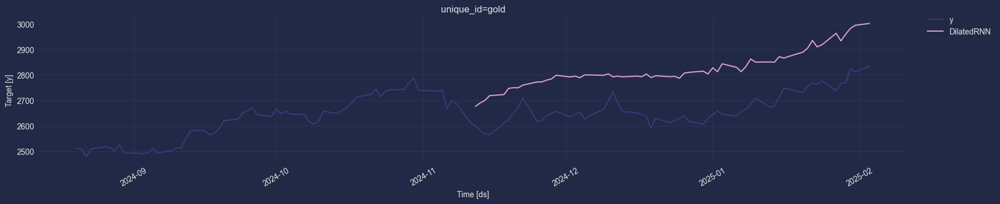

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [207]:
model = DilatedRNN(
    h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params
)
try_auto_model(model)

### Bidirectional Temporal Convolutional Network (BiTCN)

In [208]:
def objective_bitcn(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [16, 32]),
        "dropout": trial.suggest_float("dropout", 0.0, 0.99),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = BiTCN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [209]:
study_path = "study_bitcn.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:50:24,736] Using an existing study with name 'study_bitcn.db' instead of creating a new one.


In [210]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_bitcn(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 240, 'hidden_size': 32, 'dropout': 0.5991885377127788, 'learning_rate': 0.00034667155535717827, 'scaler_type': 'minmax1', 'max_steps': 1000, 'batch_size': 64, 'windows_batch_size': 512}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:50:41,358] Trial 31 finished with value: 42.51338195800781 and parameters: {'input_size': 240, 'hidden_size': 32, 'dropout': 0.5991885377127788, 'learning_rate': 0.00034667155535717827, 'scaler_type': 'minmax1', 'max_steps': 1000, 'batch_size': 64, 'windows_batch_size': 512}. Best is trial 22 with value: 28.52227020263672.


In [211]:
study.best_params

{'input_size': 240,
 'hidden_size': 32,
 'dropout': 0.4129268983619711,
 'learning_rate': 0.0004611172292187612,
 'scaler_type': 'minmax1',
 'max_steps': 1000,
 'batch_size': 64,
 'windows_batch_size': 512}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


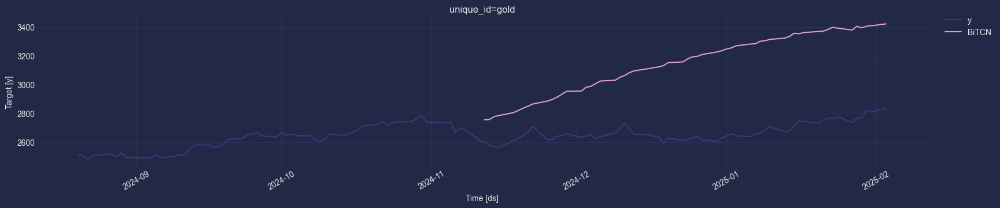

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [212]:
model = BiTCN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

## MLP-based

### MLP

In [213]:
def objective_mlp(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [256, 512, 1024]),
        "num_layers": trial.suggest_int("num_layers", 2, 6),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = MLP(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [214]:
study_path = "study_mlp.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:50:58,332] Using an existing study with name 'study_mlp.db' instead of creating a new one.


In [215]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_mlp(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 120, 'hidden_size': 256, 'num_layers': 3, 'learning_rate': 0.08507596443326385, 'scaler_type': 'minmax1', 'max_steps': 500, 'batch_size': 128, 'windows_batch_size': 256}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:51:02,909] Trial 21 finished with value: 173.76995849609375 and parameters: {'input_size': 120, 'hidden_size': 256, 'num_layers': 3, 'learning_rate': 0.08507596443326385, 'scaler_type': 'minmax1', 'max_steps': 500, 'batch_size': 128, 'windows_batch_size': 256}. Best is trial 0 with value: 39.89558792114258.


In [216]:
study.best_params

{'input_size': 180,
 'hidden_size': 256,
 'num_layers': 5,
 'learning_rate': 0.0015134023867616057,
 'scaler_type': 'minmax1',
 'max_steps': 500,
 'batch_size': 256,
 'windows_batch_size': 256}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


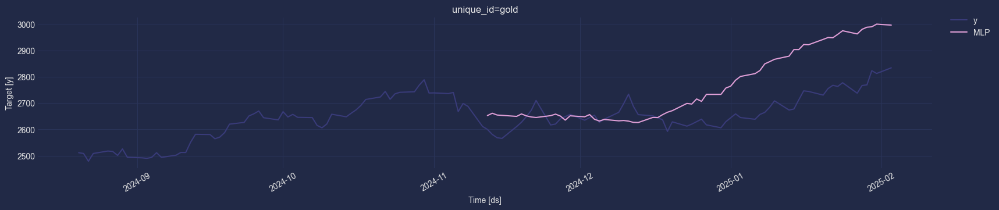

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [217]:
model = MLP(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

### Neural Basis Expansion Analysis

In [218]:
def objective_nbeats(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "n_harmonics": trial.suggest_int("n_harmonics", 2, 7),
        "n_polynomials": trial.suggest_int("n_polynomials", 2, 7),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = NBEATS(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [219]:
study_path = "study_nbeats.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:51:08,216] Using an existing study with name 'study_nbeats.db' instead of creating a new one.


In [220]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_nbeats(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 120, 'n_harmonics': 5, 'n_polynomials': 2, 'learning_rate': 0.0010292861418924504, 'scaler_type': None, 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 128}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:51:13,708] Trial 22 finished with value: 42.02740478515625 and parameters: {'input_size': 120, 'n_harmonics': 5, 'n_polynomials': 2, 'learning_rate': 0.0010292861418924504, 'scaler_type': None, 'max_steps': 500, 'batch_size': 32, 'windows_batch_size': 128}. Best is trial 14 with value: 26.05315399169922.


In [221]:
study.best_params

{'input_size': 180,
 'n_harmonics': 5,
 'n_polynomials': 3,
 'learning_rate': 0.0007794757680647125,
 'scaler_type': None,
 'max_steps': 500,
 'batch_size': 256,
 'windows_batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


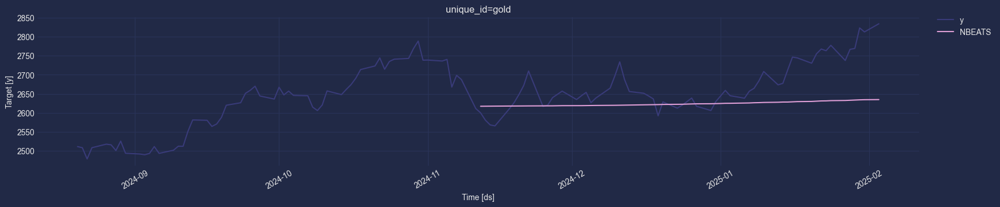

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [222]:
model = NBEATS(h=n_steps, random_seed=RND, **study.best_params)
try_auto_model(model)

### Neural Basis Expansion Analysis (NBEATSx)

In [223]:
def objective_nbeatsx(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "n_harmonics": trial.suggest_int("n_harmonics", 2, 7),
        "n_polynomials": trial.suggest_int("n_polynomials", 2, 7),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = NBEATSx(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [224]:
study_path = "study_nbeatsx.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:51:19,723] Using an existing study with name 'study_nbeatsx.db' instead of creating a new one.


In [225]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_nbeatsx(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 240, 'n_harmonics': 4, 'n_polynomials': 6, 'learning_rate': 0.0004910133651066982, 'scaler_type': 'identity', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 512}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:51:25,500] Trial 21 finished with value: 52.1750602722168 and parameters: {'input_size': 240, 'n_harmonics': 4, 'n_polynomials': 6, 'learning_rate': 0.0004910133651066982, 'scaler_type': 'identity', 'max_steps': 500, 'batch_size': 64, 'windows_batch_size': 512}. Best is trial 16 with value: 25.03871726989746.


In [226]:
study.best_params

{'input_size': 240,
 'n_harmonics': 2,
 'n_polynomials': 5,
 'learning_rate': 0.0005671411746566516,
 'scaler_type': 'identity',
 'max_steps': 500,
 'batch_size': 64,
 'windows_batch_size': 256}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


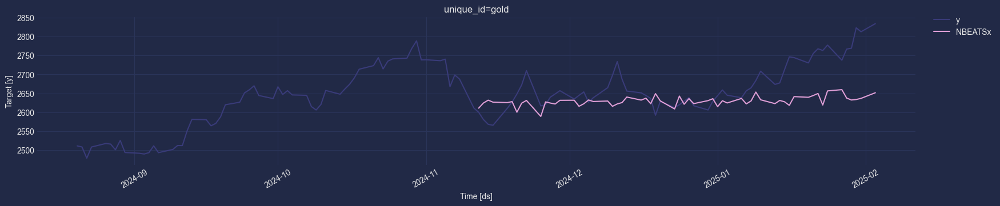

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [227]:
model = NBEATSx(
    h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params
)
try_auto_model(model)

### Neural Hierarchical Interpolation for Time Series (NHITS)

In [228]:
def objective_nhits(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "n_pool_kernel_size": trial.suggest_categorical(
            "n_pool_kernel_size",
            [[2, 2, 1], 3 * [1], 3 * [2], 3 * [4], [8, 4, 1], [16, 8, 1]],
        ),
        "n_freq_downsample": trial.suggest_categorical(
            "n_freq_downsample",
            [
                [168, 24, 1],
                [24, 12, 1],
                [180, 60, 1],
                [60, 8, 1],
                [40, 20, 1],
                [1, 1, 1],
            ],
        ),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 1500, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = NHITS(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [229]:
study_path = "study_nhits.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:51:31,576] Using an existing study with name 'study_nhits.db' instead of creating a new one.


In [230]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_nhits(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tu

{'input_size': 60, 'n_pool_kernel_size': [4, 4, 4], 'n_freq_downsample': [40, 20, 1], 'learning_rate': 0.005794317884270041, 'scaler_type': 'identity', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 1] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 1, 1] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [2, 2, 2] which is of type list.

C:\Users\Matro\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:524: UserWarning:

Choices for a categorical distribution should be a tu

[I 2025-02-04 12:51:42,370] Trial 11 finished with value: 43.1947021484375 and parameters: {'input_size': 60, 'n_pool_kernel_size': [4, 4, 4], 'n_freq_downsample': [40, 20, 1], 'learning_rate': 0.005794317884270041, 'scaler_type': 'identity', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512}. Best is trial 2 with value: 25.88405418395996.


In [231]:
study.best_params

{'input_size': 60,
 'n_pool_kernel_size': [1, 1, 1],
 'n_freq_downsample': [180, 60, 1],
 'learning_rate': 0.00032697047789416716,
 'scaler_type': 'identity',
 'max_steps': 500,
 'batch_size': 128,
 'windows_batch_size': 1024}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


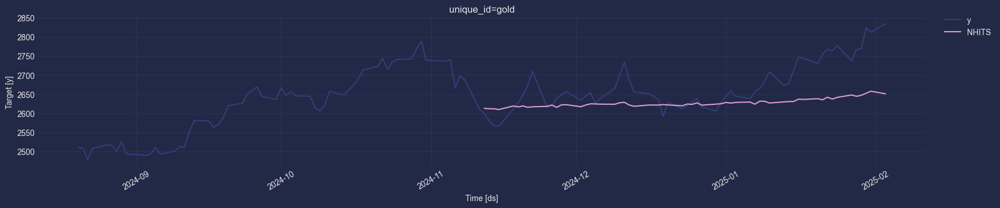

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [232]:
model = NHITS(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

### DLinear 

In [233]:
def objective_dlinear(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "moving_avg_window": trial.suggest_categorical(
            "moving_avg_window",
            [11, 25, 51],
        ),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 1500, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = DLinear(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [234]:
study_path = "study_dlinear.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:51:48,497] Using an existing study with name 'study_dlinear.db' instead of creating a new one.


In [235]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_dlinear(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 120, 'moving_avg_window': 11, 'learning_rate': 0.0005298502064107175, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 128}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:51:57,108] Trial 35 finished with value: 53.875343322753906 and parameters: {'input_size': 120, 'moving_avg_window': 11, 'learning_rate': 0.0005298502064107175, 'scaler_type': 'robust', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 128}. Best is trial 31 with value: 5.1370930671691895.


In [236]:
study.best_params

{'input_size': 120,
 'moving_avg_window': 11,
 'learning_rate': 0.0005255292070212404,
 'scaler_type': 'robust',
 'max_steps': 1000,
 'batch_size': 128,
 'windows_batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


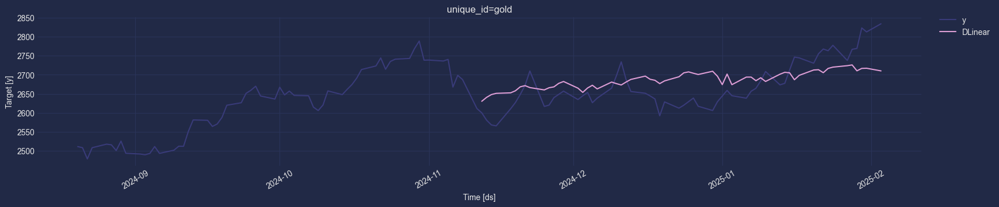

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [237]:
model = DLinear(h=n_steps, random_seed=RND, **study.best_params)
try_auto_model(model)

### NLinear 

In [238]:
def objective_nlinear(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 1500, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = NLinear(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [239]:
study_path = "study_nlinear.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:52:06,246] Using an existing study with name 'study_nlinear.db' instead of creating a new one.


In [240]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_nlinear(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 240, 'learning_rate': 0.0001747554609867059, 'scaler_type': 'robust', 'max_steps': 1500, 'batch_size': 32, 'windows_batch_size': 1024}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:52:19,090] Trial 34 finished with value: 35.547061920166016 and parameters: {'input_size': 240, 'learning_rate': 0.0001747554609867059, 'scaler_type': 'robust', 'max_steps': 1500, 'batch_size': 32, 'windows_batch_size': 1024}. Best is trial 7 with value: 27.285091400146484.


In [241]:
study.best_params

{'input_size': 240,
 'learning_rate': 0.0006990932833017732,
 'scaler_type': 'identity',
 'max_steps': 1500,
 'batch_size': 32,
 'windows_batch_size': 256}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


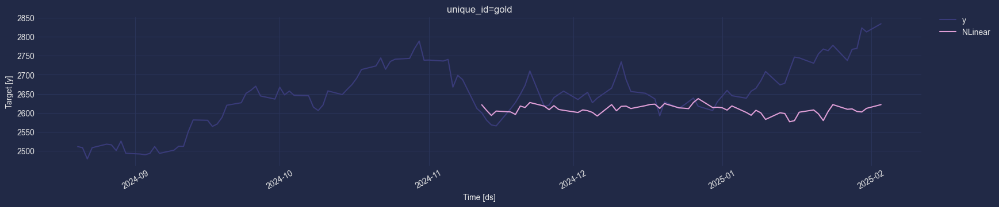

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [242]:
model = NLinear(h=n_steps, random_seed=RND, **study.best_params)
try_auto_model(model)

### TiDE 

In [243]:
def objective_tide(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [256, 512, 1024]),
        "decoder_output_dim": trial.suggest_categorical(
            "decoder_output_dim", [8, 16, 32]
        ),
        "temporal_decoder_dim": trial.suggest_categorical(
            "temporal_decoder_dim", [32, 64, 128]
        ),
        "num_encoder_layers": trial.suggest_categorical(
            "num_encoder_layers", [1, 2, 3]
        ),
        "num_decoder_layers": trial.suggest_categorical(
            "num_decoder_layers", [1, 2, 3]
        ),
        "temporal_width": trial.suggest_categorical("temporal_width", [4, 8, 16]),
        "dropout": trial.suggest_float("dropout", 0.0, 0.5),
        "learning_rate": trial.suggest_float("learning_rate", 1e-5, 1e-2, log=True),
        "layernorm": trial.suggest_categorical("layernorm", [True, False]),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 1500, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = TiDE(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [244]:
study_path = "study_tide_.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:52:31,192] Using an existing study with name 'study_tide_.db' instead of creating a new one.


In [245]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_tide(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 120, 'hidden_size': 512, 'decoder_output_dim': 32, 'temporal_decoder_dim': 128, 'num_encoder_layers': 2, 'num_decoder_layers': 2, 'temporal_width': 8, 'dropout': 0.47831002089801955, 'learning_rate': 0.00020125474504052544, 'layernorm': True, 'scaler_type': 'robust', 'max_steps': 1500, 'batch_size': 256, 'windows_batch_size': 1024}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:52:58,389] Trial 34 finished with value: 48.4669303894043 and parameters: {'input_size': 120, 'hidden_size': 512, 'decoder_output_dim': 32, 'temporal_decoder_dim': 128, 'num_encoder_layers': 2, 'num_decoder_layers': 2, 'temporal_width': 8, 'dropout': 0.47831002089801955, 'learning_rate': 0.00020125474504052544, 'layernorm': True, 'scaler_type': 'robust', 'max_steps': 1500, 'batch_size': 256, 'windows_batch_size': 1024}. Best is trial 20 with value: 5.175732612609863.


In [246]:
study.best_params

{'input_size': 60,
 'hidden_size': 512,
 'decoder_output_dim': 32,
 'temporal_decoder_dim': 128,
 'num_encoder_layers': 2,
 'num_decoder_layers': 2,
 'temporal_width': 8,
 'dropout': 0.4591617530580225,
 'learning_rate': 0.000273237386141051,
 'layernorm': True,
 'scaler_type': 'robust',
 'max_steps': 1500,
 'batch_size': 256,
 'windows_batch_size': 1024}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


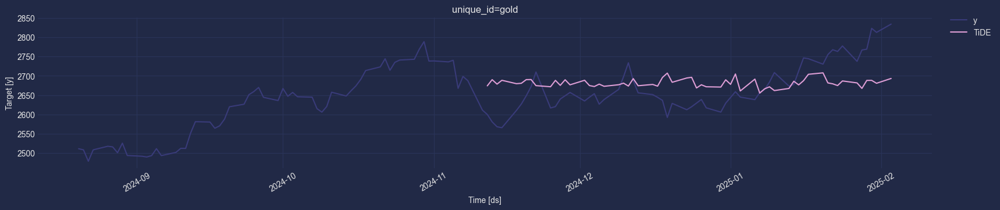

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [247]:
model = TiDE(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

### Deep Non-Parametric Time Series Forecaster

In [248]:
def objective_deepnpts(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [16, 32, 64]),
        "dropout": trial.suggest_float("dropout", 0.0, 0.99),
        "n_layers": trial.suggest_categorical("n_layers", [1, 2, 4]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 1500, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = DeepNPTS(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [249]:
study_path = "study_deepnpts.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:53:19,992] Using an existing study with name 'study_deepnpts.db' instead of creating a new one.


In [250]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_deepnpts(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 300, 'hidden_size': 16, 'dropout': 0.6924183233888459, 'n_layers': 2, 'learning_rate': 0.08054375981254898, 'scaler_type': 'standard', 'max_steps': 1500, 'batch_size': 64, 'windows_batch_size': 128}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:53:34,457] Trial 11 finished with value: 48.98582077026367 and parameters: {'input_size': 300, 'hidden_size': 16, 'dropout': 0.6924183233888459, 'n_layers': 2, 'learning_rate': 0.08054375981254898, 'scaler_type': 'standard', 'max_steps': 1500, 'batch_size': 64, 'windows_batch_size': 128}. Best is trial 5 with value: 25.74842071533203.


In [251]:
study.best_params

{'input_size': 300,
 'hidden_size': 16,
 'dropout': 0.16649857225698164,
 'n_layers': 2,
 'learning_rate': 0.008655579208588622,
 'scaler_type': 'identity',
 'max_steps': 500,
 'batch_size': 64,
 'windows_batch_size': 1024}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


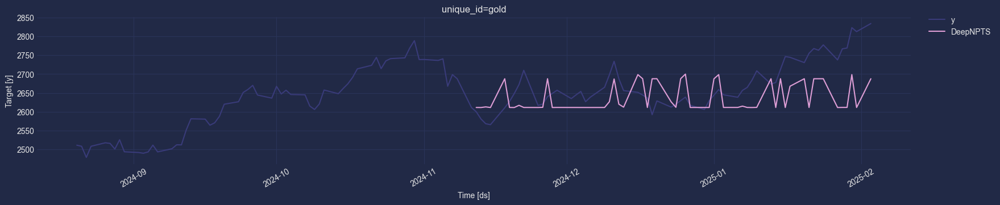

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [252]:
model = DeepNPTS(
    h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params
)
try_auto_model(model)

## Kolmogorov-Arnold Networks (KANs)

In [253]:
def objective_kan(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "grid_size": trial.suggest_categorical("grid_size", [5, 10, 15]),
        "spline_order": trial.suggest_categorical("spline_order", [2, 3, 4]),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256, 512]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["minmax1", None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 1500, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512, 1024]
        ),
    }
    print(params)

    model = KAN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [254]:
study_path = "study_kan.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:53:40,312] Using an existing study with name 'study_kan.db' instead of creating a new one.


In [255]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_kan(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 240, 'grid_size': 15, 'spline_order': 2, 'hidden_size': 128, 'learning_rate': 0.0023690018405197384, 'scaler_type': None, 'max_steps': 1500, 'batch_size': 64, 'windows_batch_size': 256}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:53:59,371] Trial 11 finished with value: 232.5232696533203 and parameters: {'input_size': 240, 'grid_size': 15, 'spline_order': 2, 'hidden_size': 128, 'learning_rate': 0.0023690018405197384, 'scaler_type': None, 'max_steps': 1500, 'batch_size': 64, 'windows_batch_size': 256}. Best is trial 4 with value: 33.66010665893555.


In [256]:
study.best_params

{'input_size': 240,
 'grid_size': 5,
 'spline_order': 2,
 'hidden_size': 128,
 'learning_rate': 0.001731868825866828,
 'scaler_type': None,
 'max_steps': 1000,
 'batch_size': 256,
 'windows_batch_size': 512}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


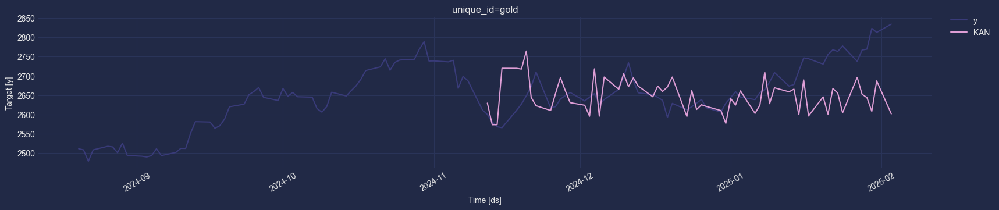

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [257]:
model = KAN(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **study.best_params)
try_auto_model(model)

## Transformer-Based

### Temporal Fusion Transformer (TFT)

In [258]:
def objective_tft(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256]),
        "n_head": trial.suggest_categorical("n_head", [4, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 2000, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512]
        ),
    }
    print(params)
    model = TFT(h=n_steps, hist_exog_list=exog_cols, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [259]:
study_path = "study_tft_2.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:54:12,196] Using an existing study with name 'study_tft_2.db' instead of creating a new one.


In [260]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_tft(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'hidden_size': 128, 'n_head': 4, 'learning_rate': 0.021341718910557285, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:55:33,134] Trial 41 finished with value: 32.980201721191406 and parameters: {'input_size': 60, 'hidden_size': 128, 'n_head': 4, 'learning_rate': 0.021341718910557285, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 512}. Best is trial 6 with value: 24.661958694458008.


In [261]:
study.best_params

{'input_size': 60,
 'hidden_size': 128,
 'n_head': 4,
 'learning_rate': 0.03084833245742338,
 'scaler_type': 'standard',
 'max_steps': 1000,
 'batch_size': 32,
 'windows_batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


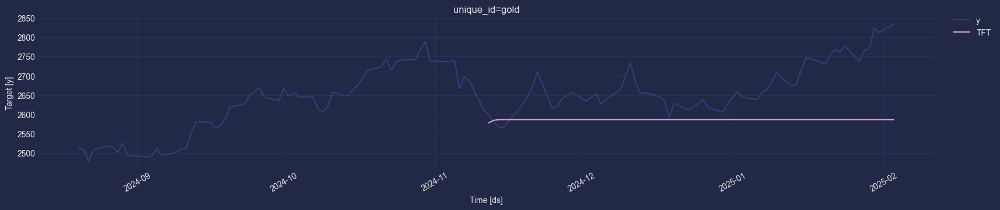

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [262]:
model = TFT(
    h=n_steps,
    **study.best_params,
    hist_exog_list=exog_cols,
    enable_progress_bar=True,
    random_seed=RND
)
try_auto_model(model)

### Vanilla Transformer

In [263]:
def objective_vanilla_transformer(trial):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256]),
        "n_head": trial.suggest_categorical("n_head", [4, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 2000, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512]
        ),
    }
    print(params)

    model = VanillaTransformer(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [264]:
study_path = "study_vanilla_transformer_2.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:56:00,050] Using an existing study with name 'study_vanilla_transformer_2.db' instead of creating a new one.


In [265]:
study.optimize(
    objective_vanilla_transformer,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'hidden_size': 64, 'n_head': 4, 'learning_rate': 0.008400458903360797, 'scaler_type': 'robust', 'max_steps': 1500, 'batch_size': 128, 'windows_batch_size': 256}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:56:26,004] Trial 41 finished with value: 46.83104705810547 and parameters: {'input_size': 60, 'hidden_size': 64, 'n_head': 4, 'learning_rate': 0.008400458903360797, 'scaler_type': 'robust', 'max_steps': 1500, 'batch_size': 128, 'windows_batch_size': 256}. Best is trial 14 with value: 24.788293838500977.


In [266]:
print(f"Best parameters found by Optuna: {study.best_params}")

Best parameters found by Optuna: {'input_size': 60, 'hidden_size': 128, 'n_head': 8, 'learning_rate': 0.0018955505205854426, 'scaler_type': 'standard', 'max_steps': 1500, 'batch_size': 64, 'windows_batch_size': 256}


Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


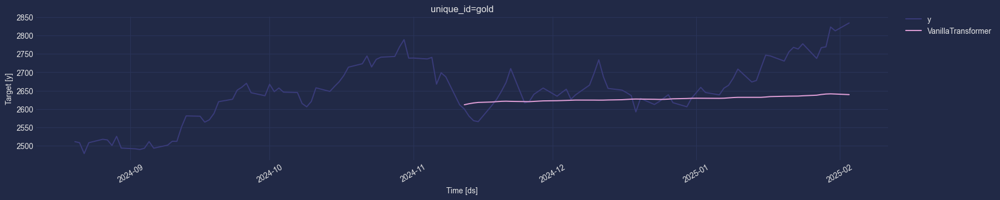

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [267]:
model = VanillaTransformer(
    h=n_steps, random_seed=RND, enable_progress_bar=True, **study.best_params
)
try_auto_model(model)

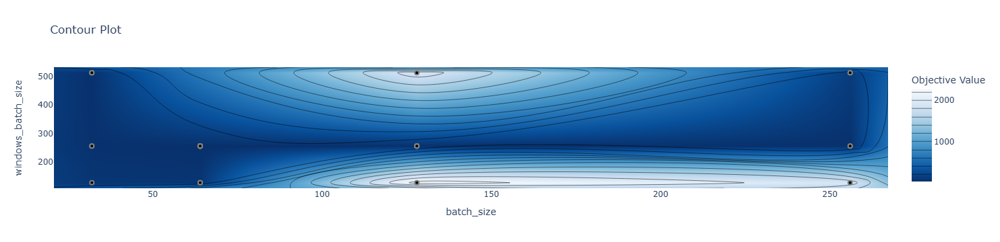

In [268]:
optuna.visualization.plot_contour(study, params=["batch_size", "windows_batch_size"])

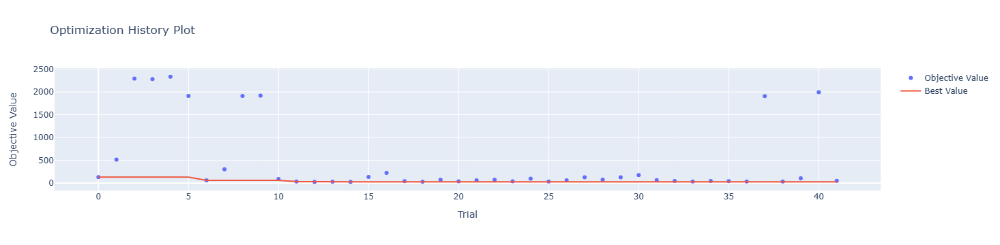

In [269]:
optuna.visualization.plot_optimization_history(study)

### Informer 

In [270]:
def objective_informer(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256]),
        "n_head": trial.suggest_categorical("n_head", [4, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 2000, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512]
        ),
    }
    print(params)

    model = Informer(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [271]:
study_path = "study_informer.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:57:02,407] Using an existing study with name 'study_informer.db' instead of creating a new one.


In [272]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_informer(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'hidden_size': 64, 'n_head': 8, 'learning_rate': 0.0028687605959067317, 'scaler_type': 'robust', 'max_steps': 2000, 'batch_size': 128, 'windows_batch_size': 512}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:58:01,126] Trial 73 finished with value: 32.589210510253906 and parameters: {'input_size': 60, 'hidden_size': 64, 'n_head': 8, 'learning_rate': 0.0028687605959067317, 'scaler_type': 'robust', 'max_steps': 2000, 'batch_size': 128, 'windows_batch_size': 512}. Best is trial 10 with value: 27.562061309814453.


In [273]:
study.best_params

{'input_size': 60,
 'hidden_size': 64,
 'n_head': 4,
 'learning_rate': 0.0017694103426415765,
 'scaler_type': 'robust',
 'max_steps': 1000,
 'batch_size': 128,
 'windows_batch_size': 512}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


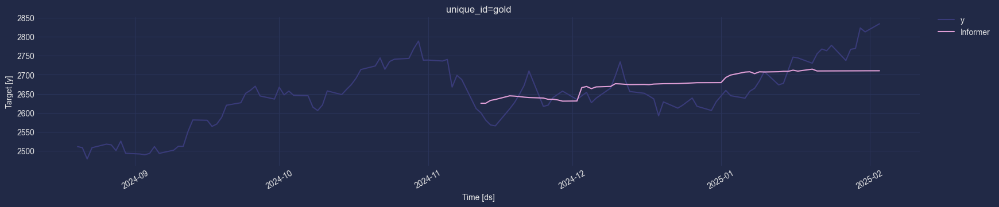

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [274]:
model = Informer(
    h=n_steps, random_seed=RND, enable_progress_bar=True, **study.best_params
)
try_auto_model(model)

### Autoformer

In [275]:
def objective_autoformer(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256]),
        "n_head": trial.suggest_categorical("n_head", [4, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 2000, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512]
        ),
    }
    print(params)

    model = Autoformer(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [276]:
study_path = "study_autoformer.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:58:26,467] Using an existing study with name 'study_autoformer.db' instead of creating a new one.


In [277]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_autoformer(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'hidden_size': 64, 'n_head': 8, 'learning_rate': 0.002076412328457569, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 128}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 12:58:58,028] Trial 92 finished with value: 113.08695983886719 and parameters: {'input_size': 60, 'hidden_size': 64, 'n_head': 8, 'learning_rate': 0.002076412328457569, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 256, 'windows_batch_size': 128}. Best is trial 36 with value: 37.7077751159668.


In [278]:
study.best_params

{'input_size': 180,
 'hidden_size': 128,
 'n_head': 4,
 'learning_rate': 0.003627309875994298,
 'scaler_type': 'standard',
 'max_steps': 1000,
 'batch_size': 32,
 'windows_batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


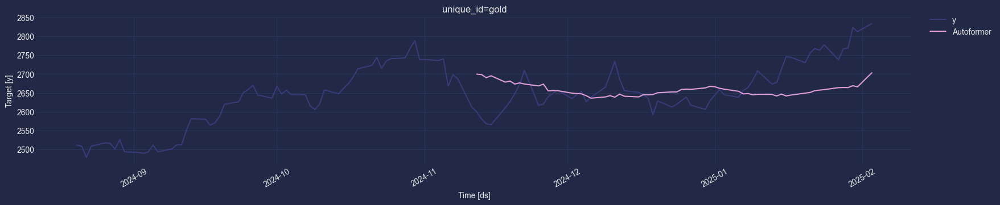

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [279]:
model = Autoformer(
    h=n_steps, random_seed=RND, enable_progress_bar=True, **study.best_params
)
try_auto_model(model)

### FEDformer

In [280]:
def objective_fedformer(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_int("max_steps", 500, 2000, step=500),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512]
        ),
    }
    print(params)

    model = FEDformer(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [281]:
study_path = "study_fedformer_.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 12:59:39,594] Using an existing study with name 'study_fedformer_.db' instead of creating a new one.


In [282]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_fedformer(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'hidden_size': 64, 'learning_rate': 0.00018026580808527386, 'scaler_type': 'robust', 'max_steps': 2000, 'batch_size': 128, 'windows_batch_size': 512}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:01:59,328] Trial 31 finished with value: 61.55146789550781 and parameters: {'input_size': 60, 'hidden_size': 64, 'learning_rate': 0.00018026580808527386, 'scaler_type': 'robust', 'max_steps': 2000, 'batch_size': 128, 'windows_batch_size': 512}. Best is trial 5 with value: 27.649913787841797.


In [283]:
study.best_params

{'input_size': 60,
 'hidden_size': 128,
 'learning_rate': 0.00010396434563812887,
 'scaler_type': 'robust',
 'max_steps': 2000,
 'batch_size': 128,
 'windows_batch_size': 512}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


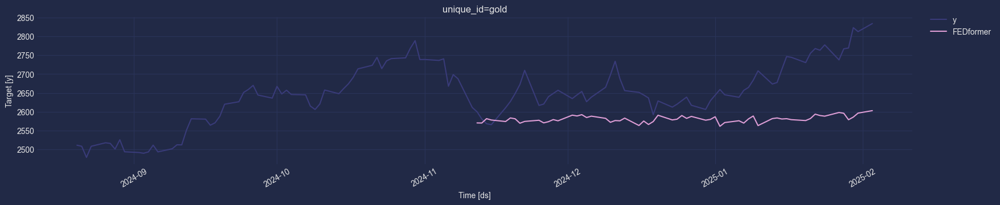

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [284]:
model = FEDformer(
    h=n_steps, random_seed=RND, enable_progress_bar=True, **study.best_params
)
try_auto_model(model)

### PatchTST

In [285]:
def objective_patchtst(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [16, 128, 256]),
        "n_heads": trial.suggest_categorical("n_heads", [4, 16]),
        "patch_len": trial.suggest_categorical("patch_len", [16, 24]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "revin": trial.suggest_categorical("revin", [False, True]),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 5000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [128, 256, 512]
        ),
    }
    print(params)

    model = PatchTST(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [286]:
study_path = "study_patchtst_.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:05:34,806] Using an existing study with name 'study_patchtst_.db' instead of creating a new one.


In [287]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_patchtst(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 180, 'hidden_size': 128, 'n_heads': 16, 'patch_len': 24, 'learning_rate': 0.012815805638362718, 'scaler_type': None, 'revin': True, 'max_steps': 5000, 'batch_size': 256, 'windows_batch_size': 256}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:06:44,036] Trial 51 finished with value: 48.168251037597656 and parameters: {'input_size': 180, 'hidden_size': 128, 'n_heads': 16, 'patch_len': 24, 'learning_rate': 0.012815805638362718, 'scaler_type': None, 'revin': True, 'max_steps': 5000, 'batch_size': 256, 'windows_batch_size': 256}. Best is trial 4 with value: 23.60138702392578.


In [288]:
study.best_params

{'input_size': 180,
 'hidden_size': 16,
 'n_heads': 16,
 'patch_len': 16,
 'learning_rate': 0.012533645254072747,
 'scaler_type': 'robust',
 'revin': True,
 'max_steps': 500,
 'batch_size': 64,
 'windows_batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


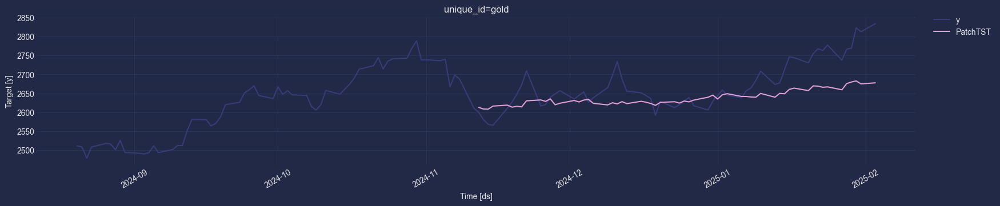

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [289]:
model = PatchTST(
    h=n_steps, random_seed=RND, enable_progress_bar=True, **study.best_params
)
try_auto_model(model)

### iTransformer

In [290]:
def objective_itransformer(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [16, 128, 256]),
        "n_heads": trial.suggest_categorical("n_heads", [4, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
    }
    print(params)

    model = iTransformer(h=n_steps, n_series=1, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [291]:
study_path = "study_itransformer_.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:06:52,027] Using an existing study with name 'study_itransformer_.db' instead of creating a new one.


In [292]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_itransformer(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 120, 'hidden_size': 16, 'n_heads': 8, 'learning_rate': 0.002131879967420107, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:07:04,239] Trial 33 finished with value: 0.6109264492988586 and parameters: {'input_size': 120, 'hidden_size': 16, 'n_heads': 8, 'learning_rate': 0.002131879967420107, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128}. Best is trial 28 with value: 0.2131960391998291.


In [293]:
study.best_params

{'input_size': 120,
 'hidden_size': 16,
 'n_heads': 8,
 'learning_rate': 0.02204739562965703,
 'scaler_type': 'standard',
 'max_steps': 1000,
 'batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


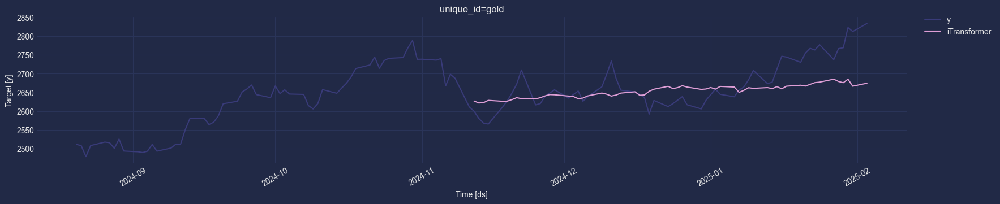

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [294]:
model = iTransformer(
    h=n_steps,
    n_series=1,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

## TimesNet (Convolutional Neural Networks, CNN)

In [295]:
def objective_timesnet(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [32, 64, 128]),
        "conv_hidden_size": trial.suggest_categorical(
            "conv_hidden_size", [32, 64, 128]
        ),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical("scaler_type", ["robust", "standard"]),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [32, 64, 128, 256]
        ),
    }
    print(params)

    model = TimesNet(h=n_steps, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [296]:
study_path = "study_timesnet_.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:07:16,934] Using an existing study with name 'study_timesnet_.db' instead of creating a new one.


In [297]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_timesnet(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 240, 'hidden_size': 128, 'conv_hidden_size': 64, 'learning_rate': 0.027889214984504626, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 32}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:09:10,345] Trial 62 finished with value: 95.49459075927734 and parameters: {'input_size': 240, 'hidden_size': 128, 'conv_hidden_size': 64, 'learning_rate': 0.027889214984504626, 'scaler_type': 'standard', 'max_steps': 1000, 'batch_size': 128, 'windows_batch_size': 32}. Best is trial 53 with value: 5.934013843536377.


In [298]:
study.best_params

{'input_size': 240,
 'hidden_size': 128,
 'conv_hidden_size': 64,
 'learning_rate': 0.04443929114482368,
 'scaler_type': 'standard',
 'max_steps': 1000,
 'batch_size': 128,
 'windows_batch_size': 32}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


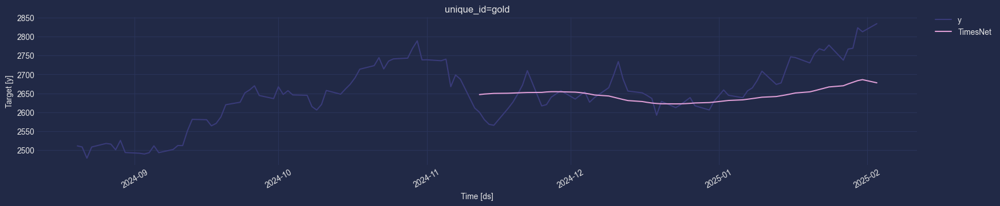

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [299]:
model = TimesNet(
    h=n_steps, random_seed=RND, enable_progress_bar=True, **study.best_params
)
try_auto_model(model)

## Multivariate

### StemGNN

def objective_stemgnn(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "multi_layer": trial.suggest_categorical("multi_layer", [3, 5, 7]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128]),
    }
    print(params)

    model = StemGNN(h=n_steps, n_series=1, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [300]:
study_path = "study_stemgnn_1.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:11:03,752] Using an existing study with name 'study_stemgnn_1.db' instead of creating a new one.


dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_stemgnn(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

In [301]:
study.best_params

{'input_size': 60,
 'multi_layer': 5,
 'learning_rate': 0.026063319193350535,
 'scaler_type': 'robust',
 'max_steps': 1000,
 'batch_size': 128}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


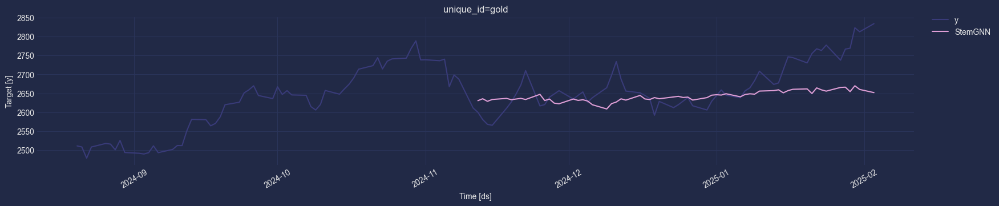

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [302]:
model = StemGNN(
    h=n_steps,
    n_series=1,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

### TSMixer

In [303]:
def objective_tsmixer(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "n_block": trial.suggest_categorical("n_block", [1, 2, 4, 6, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True),
        "ff_dim": trial.suggest_categorical("ff_dim", [32, 64, 128]),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["identity", "robust", "standard"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "dropout": trial.suggest_float("dropout", 0.0, 0.99),
    }
    print(params)

    model = TSMixer(h=n_steps, n_series=1, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [304]:
study_path = "study_tsmixer.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:11:22,637] Using an existing study with name 'study_tsmixer.db' instead of creating a new one.


In [305]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_tsmixer(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'n_block': 8, 'learning_rate': 0.0003469092532575567, 'ff_dim': 64, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 256, 'dropout': 0.46783690850766235}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:11:30,947] Trial 24 finished with value: 0.9402124881744385 and parameters: {'input_size': 60, 'n_block': 8, 'learning_rate': 0.0003469092532575567, 'ff_dim': 64, 'scaler_type': 'robust', 'max_steps': 500, 'batch_size': 256, 'dropout': 0.46783690850766235}. Best is trial 17 with value: 0.2217704951763153.


In [306]:
study.best_params

{'input_size': 60,
 'n_block': 8,
 'learning_rate': 0.0010187579604793399,
 'ff_dim': 128,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 256,
 'dropout': 0.4514181506660436}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


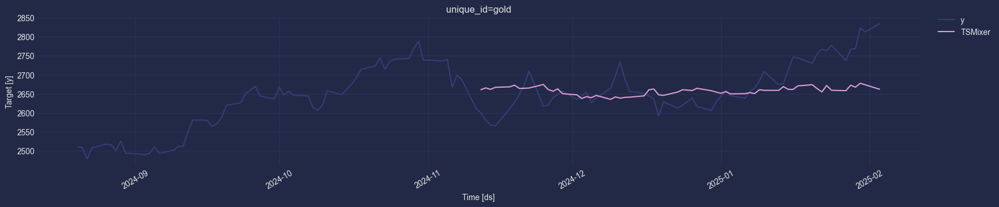

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [307]:
model = TSMixer(
    h=n_steps,
    n_series=1,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

### TSMixerx

In [308]:
def objective_tsmixerx(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "n_block": trial.suggest_categorical("n_block", [1, 2, 4, 6, 8]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-2, log=True),
        "ff_dim": trial.suggest_categorical("ff_dim", [32, 64, 128]),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", ["identity", "robust", "standard"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "dropout": trial.suggest_float("dropout", 0.0, 0.99),
    }
    print(params)

    model = TSMixerx(h=n_steps, n_series=1, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [309]:
study_path = "study_tsmixerx.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:11:38,680] Using an existing study with name 'study_tsmixerx.db' instead of creating a new one.


In [310]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_tsmixerx(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 180, 'n_block': 6, 'learning_rate': 0.0015819818513823072, 'ff_dim': 64, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 256, 'dropout': 0.21767392316034834}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:11:46,397] Trial 13 finished with value: 0.9506526589393616 and parameters: {'input_size': 180, 'n_block': 6, 'learning_rate': 0.0015819818513823072, 'ff_dim': 64, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 256, 'dropout': 0.21767392316034834}. Best is trial 2 with value: 0.27306944131851196.


In [311]:
study.best_params

{'input_size': 180,
 'n_block': 1,
 'learning_rate': 0.00015006419504224407,
 'ff_dim': 64,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 64,
 'dropout': 0.07766744636884317}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


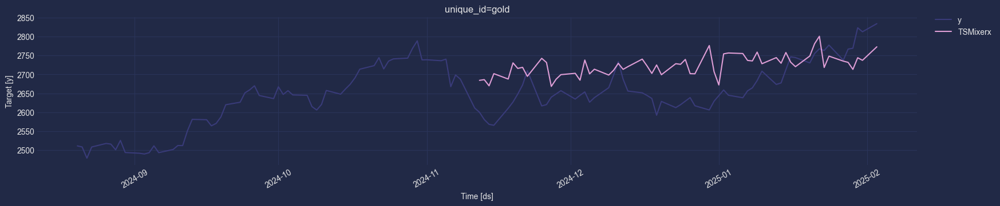

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [312]:
model = TSMixerx(
    h=n_steps,
    n_series=1,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

### MLPMultivariate

In [313]:
def objective_mlpmultivariate(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [256, 512, 1024]),
        "num_layers": trial.suggest_int("num_layers", 2, 6),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
    }
    print(params)

    model = MLPMultivariate(
        h=n_steps, n_series=1, hist_exog_list=exog_cols, random_seed=RND, **params
    )
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [314]:
study_path = "study_mlpmultivariate.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:11:52,108] Using an existing study with name 'study_mlpmultivariate.db' instead of creating a new one.


In [315]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_mlpmultivariate(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'hidden_size': 512, 'num_layers': 2, 'learning_rate': 0.0005791903902351051, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:11:56,184] Trial 22 finished with value: 2.713083028793335 and parameters: {'input_size': 60, 'hidden_size': 512, 'num_layers': 2, 'learning_rate': 0.0005791903902351051, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64}. Best is trial 12 with value: 0.32277411222457886.


In [316]:
study.best_params

{'input_size': 60,
 'hidden_size': 512,
 'num_layers': 2,
 'learning_rate': 0.0004251440904106721,
 'scaler_type': 'standard',
 'max_steps': 1000,
 'batch_size': 32}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


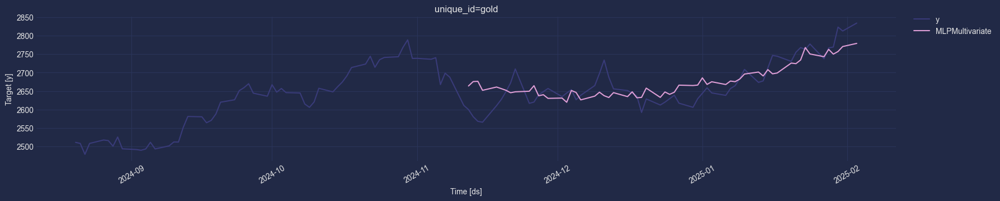

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [317]:
model = MLPMultivariate(
    h=n_steps,
    n_series=1,
    hist_exog_list=exog_cols,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

### SOFTS

In [318]:
def objective_softs(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "hidden_size": trial.suggest_categorical("hidden_size", [64, 128, 256, 512]),
        "d_core": trial.suggest_categorical("d_core", [64, 128, 256, 512]),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
    }
    print(params)

    model = SOFTS(
        h=n_steps, n_series=1, hist_exog_list=exog_cols, random_seed=RND, **params
    )
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [319]:
study_path = "study_softs.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:12:04,991] Using an existing study with name 'study_softs.db' instead of creating a new one.


In [320]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_softs(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 300, 'hidden_size': 128, 'd_core': 512, 'learning_rate': 0.00018219733926186417, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 256}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:12:11,452] Trial 22 finished with value: 0.8422942757606506 and parameters: {'input_size': 300, 'hidden_size': 128, 'd_core': 512, 'learning_rate': 0.00018219733926186417, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 256}. Best is trial 12 with value: 0.3788994252681732.


In [321]:
study.best_params

{'input_size': 300,
 'hidden_size': 128,
 'd_core': 64,
 'learning_rate': 0.00020554551530500568,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 256}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


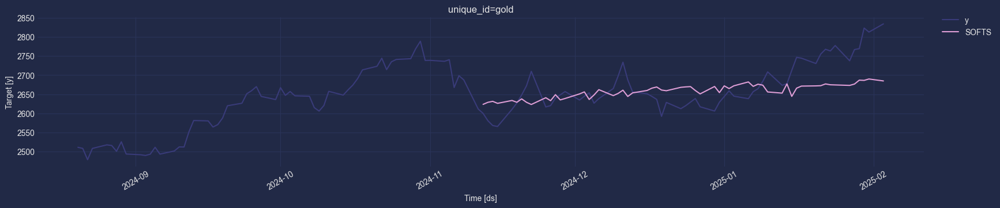

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [322]:
model = SOFTS(
    h=n_steps,
    n_series=1,
    hist_exog_list=exog_cols,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

### TimeMixer

In [323]:
def objective_timemixer(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4, n_steps * 5],
        ),
        "d_model": trial.suggest_categorical("d_model", [16, 32, 64]),
        "d_ff": trial.suggest_categorical("d_ff", [16, 32, 64]),
        "down_sampling_layers": trial.suggest_categorical(
            "down_sampling_layers", [1, 2]
        ),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "max_steps": trial.suggest_categorical("max_steps", [500, 1000, 2000]),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
    }
    print(params)

    model = TimeMixer(h=n_steps, n_series=1, random_seed=RND, **params)
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    return model.metrics["ptl/val_loss"]

In [324]:
study_path = "study_tiemixer.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:12:17,887] Using an existing study with name 'study_tiemixer.db' instead of creating a new one.


In [325]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_timemixer(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'd_model': 64, 'd_ff': 32, 'down_sampling_layers': 2, 'learning_rate': 0.0006908694341865381, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64}


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:12:32,038] Trial 12 finished with value: 0.48295098543167114 and parameters: {'input_size': 60, 'd_model': 64, 'd_ff': 32, 'down_sampling_layers': 2, 'learning_rate': 0.0006908694341865381, 'scaler_type': 'standard', 'max_steps': 500, 'batch_size': 64}. Best is trial 1 with value: 0.39759114384651184.


In [326]:
study.best_params

{'input_size': 60,
 'd_model': 16,
 'd_ff': 32,
 'down_sampling_layers': 2,
 'learning_rate': 0.0035494742123359075,
 'scaler_type': 'standard',
 'max_steps': 500,
 'batch_size': 64}

Seed set to 0


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


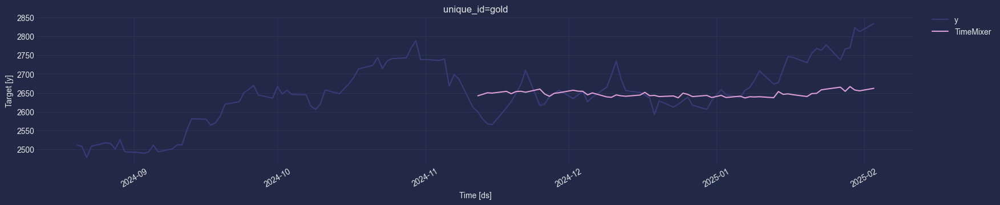

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [327]:
model = TimeMixer(
    h=n_steps,
    n_series=1,
    random_seed=RND,
    enable_progress_bar=True,
    **study.best_params
)
try_auto_model(model)

# Transformers

## TimeLLM

In [328]:
prompt_prefix = f"The dataset contains data on daily price of gold. There is no visible seasonality. Predict price for next {n_steps} working days."

In [329]:
def objective_timellm(trial, dataset):
    params = {
        "input_size": trial.suggest_categorical(
            "input_size",
            [n_steps, n_steps * 2, n_steps * 3, n_steps * 4],
        ),
        "patch_len": trial.suggest_categorical("patch_len", [8, 16, 32, 64]),
        "stride": trial.suggest_categorical("stride", [4, 8, 16]),
        "d_model": trial.suggest_categorical("d_model", [16, 32, 64]),
        "top_k": trial.suggest_categorical("top_k", [4, 5, 6]),
        "d_ff": trial.suggest_categorical("d_ff", [16, 32, 64, 128, 256]),
        "dropout": trial.suggest_float("dropout", 1e-2, 1.0),
        "learning_rate": trial.suggest_float("learning_rate", 1e-4, 1e-1, log=True),
        "scaler_type": trial.suggest_categorical(
            "scaler_type", [None, "robust", "standard", "identity"]
        ),
        "batch_size": trial.suggest_categorical("batch_size", [32, 64, 128, 256]),
        "windows_batch_size": trial.suggest_categorical(
            "windows_batch_size", [32, 64, 128]
        ),
    }
    print(params)
    model = TimeLLM(
        h=n_steps,
        prompt_prefix=prompt_prefix,
        random_seed=RND,
        max_steps=200,
        dataloader_kwargs={"num_workers": 24, "persistent_workers": True},
        **params
    )
    model.fit(dataset, val_size=n_steps, test_size=n_steps, random_seed=RND)
    torch.cuda.empty_cache()
    return model.metrics["ptl/val_loss"]

In [330]:
study_path = "study_tilellm_6.db"
study = optuna.create_study(
    storage="sqlite:///{}".format(study_path),
    study_name=study_path,
    direction="minimize",
    load_if_exists=True,
)

[I 2025-02-04 13:12:48,209] Using an existing study with name 'study_tilellm_6.db' instead of creating a new one.


In [331]:
dataset, *_ = TimeSeriesDataset.from_df(df_train)
func = lambda x: objective_timellm(x, dataset)
study.optimize(
    func,
    n_trials=1,
    show_progress_bar=True,
    n_jobs=1,
    gc_after_trial=True,
)

  0%|          | 0/1 [00:00<?, ?it/s]

Seed set to 0


{'input_size': 60, 'patch_len': 8, 'stride': 8, 'd_model': 16, 'top_k': 6, 'd_ff': 256, 'dropout': 0.4548978204595414, 'learning_rate': 0.0011310797961344458, 'scaler_type': None, 'batch_size': 128, 'windows_batch_size': 128}
Using openai-community/gpt2 as default.
Successfully loaded model: openai-community/gpt2


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

[I 2025-02-04 13:20:03,070] Trial 32 finished with value: 63.19559097290039 and parameters: {'input_size': 60, 'patch_len': 8, 'stride': 8, 'd_model': 16, 'top_k': 6, 'd_ff': 256, 'dropout': 0.4548978204595414, 'learning_rate': 0.0011310797961344458, 'scaler_type': None, 'batch_size': 128, 'windows_batch_size': 128}. Best is trial 14 with value: 29.146617889404297.


In [333]:
torch.cuda.empty_cache()

In [334]:
study.best_params

{'input_size': 60,
 'patch_len': 8,
 'stride': 8,
 'd_model': 16,
 'top_k': 6,
 'd_ff': 16,
 'dropout': 0.02781554302152124,
 'learning_rate': 0.02447157698683381,
 'scaler_type': None,
 'batch_size': 256,
 'windows_batch_size': 128}

Seed set to 0


Using openai-community/gpt2 as default.
Successfully loaded model: openai-community/gpt2


Sanity Checking: |                                                                               | 0/? [00:00<…

Training: |                                                                                      | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Validation: |                                                                                    | 0/? [00:00<…

Predicting: |                                                                                    | 0/? [00:00<…

y_hat shape: (60, 1)


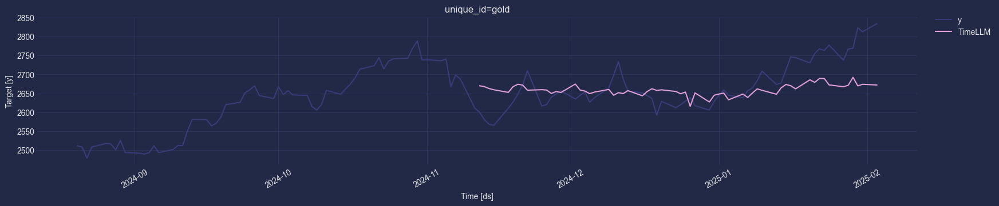

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [335]:
model = TimeLLM(
    h=n_steps,
    prompt_prefix=prompt_prefix,
    random_seed=RND,
    max_steps=200,
    dataloader_kwargs={"num_workers": 24, "persistent_workers": True},
    **study.best_params
)
try_auto_model(model)

## TimeGPT

In [336]:
from nixtla import NixtlaClient

In [337]:
nixtla_client = NixtlaClient(
    api_key="nixak-VOgcWljWgVvCdegiw6PZWYAMHIIpuOIgBlrMNBtWTy7bD8p4RZhK3CZFrBaeamOao0BAv9NRGiq7m94D"
)

In [338]:
nixtla_client.usage()

{'minute': {'usage': 0, 'limit': 200}, 'month': {'usage': 6, 'limit': 50}}

In [339]:
df_train

,y,TNX,DJI,DX-Y.NYB,WTI,IRX,GDX,EURUSD,VIX,SI,GSPC,ds,unique_id
Date,,,,,,,,,,,,,
1979-12-27,515.500000,10.4600,3172.399902,85.510002,32.049999,11.9700,37.230000,1.196501,17.24,4.930000,107.959999,1979-12-27,gold
1979-12-28,512.000000,10.4100,3172.399902,85.809998,32.049999,11.9200,37.230000,1.196501,17.24,4.930000,107.839996,1979-12-28,gold
1979-12-31,512.000000,10.4325,3172.399902,85.687498,32.049999,11.9825,37.230000,1.196501,17.24,4.930000,107.319998,1979-12-31,gold
1980-01-01,512.000000,10.4550,3172.399902,85.564999,32.049999,12.0450,37.230000,1.196501,17.24,4.930000,106.799999,1980-01-01,gold
1980-01-02,559.750000,10.5000,3172.399902,85.320000,32.049999,12.1700,37.230000,1.196501,17.24,4.930000,105.760002,1980-01-02,gold
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-05,2740.300049,4.2890,42221.878906,103.419998,71.989998,4.4230,40.110001,1.087406,20.49,32.654999,5782.759766,2024-11-05,gold
2024-11-06,2667.600098,4.4260,43729.929688,105.089996,71.690002,4.4300,38.639999,1.093446,16.27,31.221001,5929.040039,2024-11-06,gold
2024-11-07,2698.399902,4.3410,43729.339844,104.510002,72.360001,4.4200,39.570000,1.073307,15.20,31.764999,5973.100098,2024-11-07,gold


In [350]:
fcst_df = nixtla_client.forecast(
    df_train,
    h=n_steps,
    level=[95],
    hist_exog_list=exog_cols,
    finetune_steps=600,
    finetune_depth=5,
    finetune_loss="mae",
    model="timegpt-1-long-horizon",
)

INFO:nixtla.nixtla_client:Validating inputs...
INFO:nixtla.nixtla_client:Inferred freq: B
INFO:nixtla.nixtla_client:Preprocessing dataframes...
INFO:nixtla.nixtla_client:Querying model metadata...
INFO:nixtla.nixtla_client:Using historical exogenous features: ['DX-Y.NYB', 'WTI', 'IRX', 'GDX', 'EURUSD', 'VIX', 'GSPC', 'TNX', 'DJI', 'SI']
INFO:nixtla.nixtla_client:Calling Forecast Endpoint...


In [351]:
fcst_df

,unique_id,ds,TimeGPT,TimeGPT-hi-95,TimeGPT-lo-95
0,gold,2024-11-12,2636.1018,2661.2078,2610.9958
1,gold,2024-11-13,2637.2397,2671.9058,2602.5737
2,gold,2024-11-14,2643.9084,2683.1934,2604.6235
3,gold,2024-11-15,2572.7473,2617.7058,2527.7888
4,gold,2024-11-18,2602.8510,2653.8054,2551.8967
5,gold,2024-11-19,2590.9539,2644.8823,2537.0254
6,gold,2024-11-20,2515.8926,2578.0273,2453.7578
7,gold,2024-11-21,2587.5793,2612.6853,2562.4734
8,gold,2024-11-22,2588.9019,2623.5679,2554.2358
9,gold,2024-11-25,2593.5900,2632.8750,2554.3052


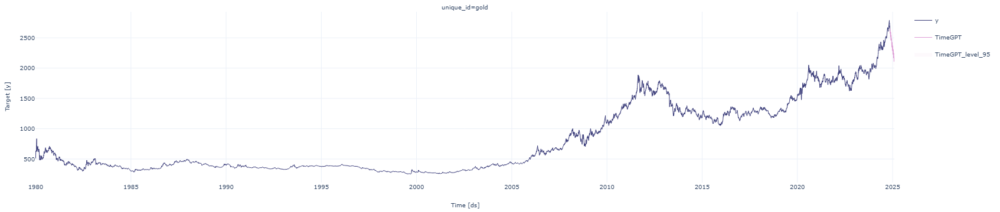

In [352]:
nixtla_client.plot(df_train, fcst_df, target_col="y", level=[95], engine="plotly")

In [343]:
metrics_ = get_metrics(
    df_test["y"], fcst_df["TimeGPT"].iloc[:n_steps].values, df_train["y"], "TimeGPT-1"
)
metrics_.set_index("model", inplace=True)
metrics = pd.concat((metrics, metrics_))
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


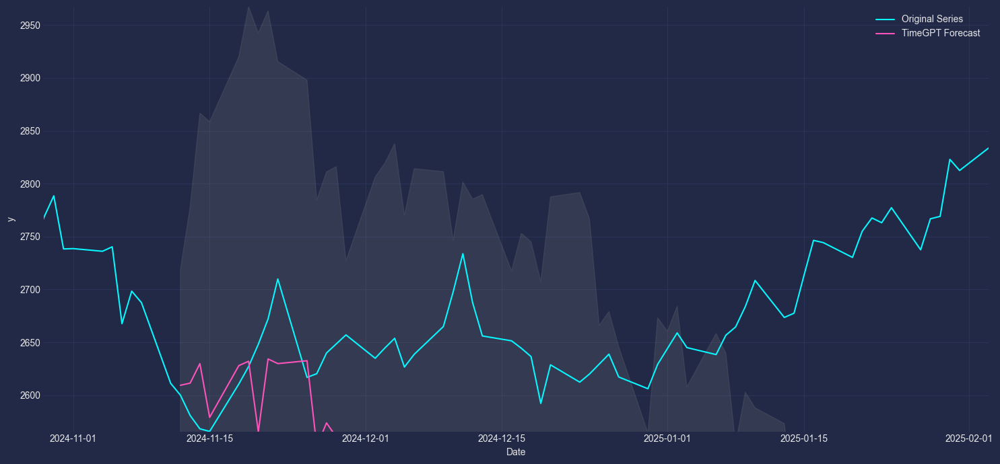

In [344]:
plt.figure(figsize=(15, 7))
lineplot(data=df["y"], label="Original Series")
lineplot(x=fcst_df.ds, y=fcst_df["TimeGPT"], label="TimeGPT Forecast")
plt.fill_between(
    fcst_df.ds,
    fcst_df["TimeGPT-lo-95"],
    fcst_df["TimeGPT-hi-95"],
    color="grey",
    alpha=0.2,
    label="Confidence Interval",
)

plt.xlim(df.index[-n_steps - 10], fcst_df.ds.iloc[-1])
max_y = fcst_df["TimeGPT-hi-95"].max()
min_y = df["y"].iloc[-n_steps - 20 :].min()
plt.ylim(min_y, max_y)
plt.tight_layout()
plt.show()

TimeGPT показывает хорошие результаты при прогнозе на 1 месяц вперед, но не улавливает спад на второй месяц.

In [345]:
metrics = metrics[~metrics.index.duplicated(keep="last")]

In [346]:
metrics

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3.521193e+06,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7.620349e+03,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6.705091e+03,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8.003707e+03,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6.573781e+03,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1.244781e+06,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3.611838e+03,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2.320467e+03,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,1.629338e+05,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


In [349]:
def highlight_rows(row):
    if row["MAE"] < metrics["MAE"]["WindowAverage"] and row["R²"] > 0:
        return ["background-color: green"] * len(row)  # Цвет для всей строки
    return [""] * len(row)  # Без изменений


# Применение стиля к DataFrame
metrics.style.apply(highlight_rows, axis=1)

,MAE,MSE,RMSE,R²,MAPE,sMAPE,MASE,Mean residuals
model,,,,,,,,
HistoricAverage,1875.427649,3521193.395049,1876.484318,-887.174578,70.180724,108.129416,314.758588,1875.427649
Naive,65.623368,7620.349145,87.294611,-0.922133,2.410012,2.460126,11.013765,60.463383
RandomWalkWithDrift,60.774142,6705.091168,81.884621,-0.691271,2.231048,2.274764,10.199905,55.003500
SeasonalNaive,68.110842,8003.706624,89.463437,-1.018829,2.547236,2.599240,11.431245,51.080841
WindowAverage,58.973832,6573.780788,81.078855,-0.658149,2.163989,2.205999,9.897753,51.080841
SeasonalWindowAverage,1114.021113,1244781.091825,1115.697581,-312.979608,41.667752,52.650281,186.969469,1114.021113
SMA,45.048412,3611.838250,60.098571,0.088961,1.661732,1.677511,7.560609,15.612682
ETS,37.355398,2320.466899,48.171225,0.414693,1.381441,1.390187,6.269467,12.548379
Prophet,397.887507,162933.820526,403.650617,-40.097907,14.851684,16.075044,66.778641,397.887507


metrics.to_parquet('metrics.parquet')

metrics = pd.read_parquet('metrics.parquet')

In [348]:
metrics.shape

(54, 8)

# Final conclusion

As a result, we can further analyze the work of the models that are marked in green. This will be done in the next notebook. Spoiler: none of them will be suitable.